In [1]:
import time
import torch
import numpy as np
import scipy.ndimage
import scipy.io
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import deepwave
from deepwave.scalar import Scalar as Propagator
from deepwave import scalar
import sys
from scipy.io import loadmat, savemat
import torch.nn.functional as F
sys.path.append("../")
from misfit import *
from utils import *
from siren import Siren

import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [2]:
import random
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)  
    torch.backends.cudnn.deterministic = True  
    torch.backends.cudnn.benchmark = False 
set_seed(1234)
device = torch.device('cuda:2')

In [3]:
# Set parameters
freq = 8
dx = 25.0
dt = 0.004 # 4ms
nz = 120
nx = 500
nt = int(6 / dt) # 6s
peak_time = 3 / freq

num_dims = 2
source_depth = 2
receiver_depth = 2
n_sources_per_shot = 1

d_source = 25
first_source = 12

d_receiver = 2
first_receiver = 1

n_shots = len(range(first_source, nx-1, d_source))
n_receivers_per_shot = len(range(first_receiver, nx, d_receiver))

# source_locations
source_locations = torch.zeros(n_shots, n_sources_per_shot, 2,
                               dtype=torch.long)
source_locations[..., 1] = source_depth
source_locations[:, 0, 0] = (torch.arange(n_shots) * d_source +
                             first_source)
# receiver_locations
receiver_locations = torch.zeros(n_shots, n_receivers_per_shot, 2,
                                 dtype=torch.long)
receiver_locations[..., 1] = receiver_depth
receiver_locations[:, :, 0] = (
    (torch.arange(n_receivers_per_shot) * d_receiver +
     first_receiver)
    .repeat(n_shots, 1)
)
# Load ricker wavelet, frequencies below 5 Hz are muted
# ricker = deepwave.wavelets.ricker(freq, nt, dt, peak_time)

src_bp = scipy.io.loadmat('wavelet.mat')
src_bp = src_bp['wavelet']
ricker = torch.tensor(src_bp[0,:],requires_grad=False).float()

In [4]:
source_amplitudes_true = (
    ricker
    .repeat(n_shots, n_sources_per_shot, 1)
    .to(device)
)

In [5]:
def data_conv(d_obs, d_pred, x_s):
....
    return d_obs_conv.permute(1,0,2), d_pred_conv.permute(1,0,2)

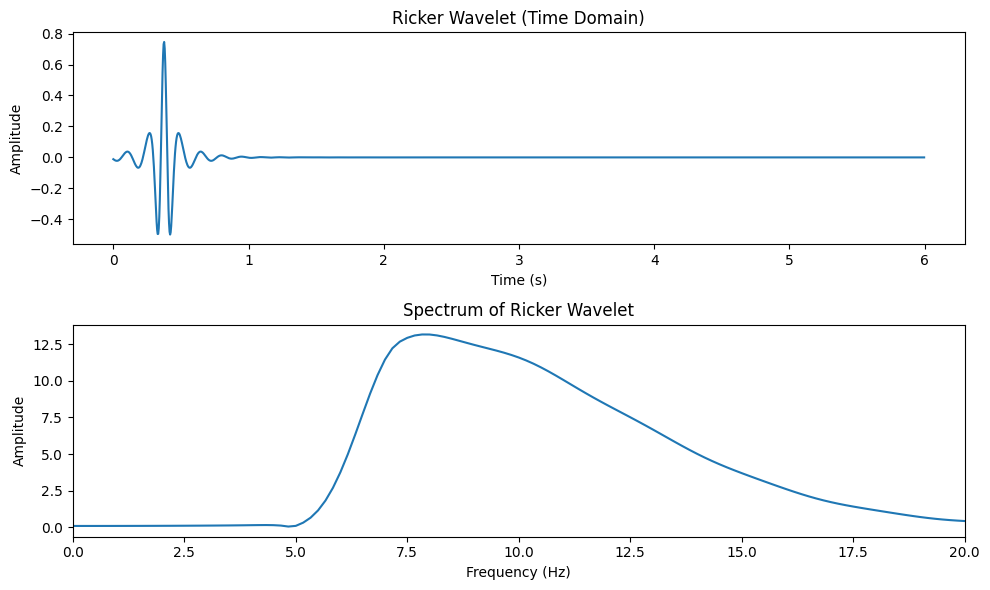

In [6]:
t_max = nt * dt  
t = np.arange(0, t_max, dt)  

wavelet = ricker.cpu().numpy()

n = len(wavelet)
f = np.fft.fftfreq(n, dt)  
f = np.fft.fftshift(f)  
wavelet_freq = np.abs(np.fft.fftshift(np.fft.fft(wavelet)))  


plt.figure(figsize=(10, 6))


plt.subplot(2, 1, 1)
plt.plot(t, wavelet)
plt.title('Ricker Wavelet (Time Domain)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')


plt.subplot(2, 1, 2)
plt.plot(f, wavelet_freq)
plt.title('Spectrum of Ricker Wavelet')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.xlim([0, 20])  

plt.tight_layout()
plt.show()

In [7]:
# load true model
v = scipy.io.loadmat('True.mat')
model_true = v['Vp'][:,:nx]
model_true = torch.Tensor(model_true) # Convert to a PyTorch Tensor
# Create 'true' data
out = scalar(
    model_true.T.to(device), dx, dt,
    source_amplitudes=source_amplitudes_true.to(device),
    source_locations=source_locations.to(device),
    receiver_locations=receiver_locations.to(device),
    pml_freq=freq,)[-1].permute(0, 2, 1)

receiver_amplitudes_true = out

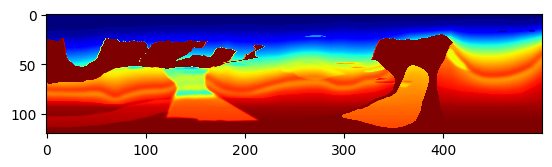

In [9]:
plt.imshow(model_true.cpu().detach().numpy(), vmin=1.5e3, vmax=4.5e3,cmap='jet')

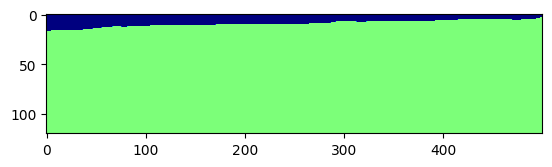

In [10]:
# Create initial guess model for inversion by smoothing the true model
v_m = scipy.io.loadmat('True_m.mat')
mask = v_m['Vp_m'][:,:nx]
v = scipy.io.loadmat('True_nosalt.mat')
model_nosalt = v['Vp_nosalt'][:,:nx]

model_init = np.where(mask == 0, model_true, 3.0e3)
model_init = np.where(mask == 1, model_init, model_nosalt)
model_init = torch.Tensor(model_init)

# Make a copy so at the end we can see how far we came from the initial model
model1 = model_init.clone()
model1 = model1.to(device)
model1.requires_grad = True


mask = torch.tensor(mask).to(device)
plt.imshow(model_init.cpu().detach().numpy(), vmin=1.5e3, vmax=4.5e3,cmap='jet')

In [11]:
in_features = 2 
out_features = 1 
hidden_features = 256
hidden_layers = 4
imvel = Siren(in_features=in_features, 
              out_features=out_features, 
              hidden_features=hidden_features, 
              hidden_layers=hidden_layers, 
              hidden_omega_0=30.0,
              outermost_linear=True,
              domain_shape=(nz, nx)).to(device)
optimizer = torch.optim.Adam(imvel.parameters(), lr=1e-4)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=200, gamma=0.8, last_epoch=-1)
coords = imvel.coords.to(device)

criterion = torch.nn.MSELoss()
criterion_data = Misfit_M_SSIM(gaussian_sigmas=[0.5,1,2])

Cannot find the pretrained model ''. Using random initialization.


Epoch: 0 Loss:  -1.8266384601593018 model_loss:  2360471.8
Epoch: 1 Loss:  -1.8335492610931396 model_loss:  2167982.2
Epoch: 2 Loss:  -1.8422024846076965 model_loss:  1734056.5
Epoch: 3 Loss:  -1.846169114112854 model_loss:  1838103.9
Epoch: 4 Loss:  -1.8538158535957336 model_loss:  1944891.2
Epoch: 5 Loss:  -1.8555134534835815 model_loss:  1902248.2
Epoch: 6 Loss:  -1.857722282409668 model_loss:  1885642.4
Epoch: 7 Loss:  -1.859351396560669 model_loss:  1931660.4
Epoch: 8 Loss:  -1.8571409583091736 model_loss:  1960958.1
Epoch: 9 Loss:  -1.8575746417045593 model_loss:  1983889.5
Epoch: 10 Loss:  -1.862491488456726 model_loss:  1991341.2


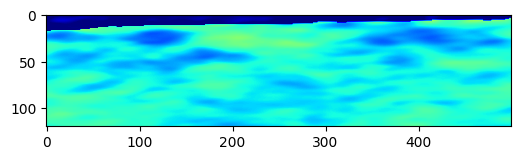

Epoch: 11 Loss:  -1.864905059337616 model_loss:  1955017.0
Epoch: 12 Loss:  -1.8683434128761292 model_loss:  1940749.1
Epoch: 13 Loss:  -1.8716012239456177 model_loss:  1947844.6
Epoch: 14 Loss:  -1.8726184368133545 model_loss:  2012020.5
Epoch: 15 Loss:  -1.872002124786377 model_loss:  1978481.0
Epoch: 16 Loss:  -1.8776068091392517 model_loss:  1984411.8
Epoch: 17 Loss:  -1.8626139760017395 model_loss:  2023369.4
Epoch: 18 Loss:  -1.8580836057662964 model_loss:  2037087.2
Epoch: 19 Loss:  -1.860683023929596 model_loss:  1986406.8
Epoch: 20 Loss:  -1.8632351756095886 model_loss:  1861248.6


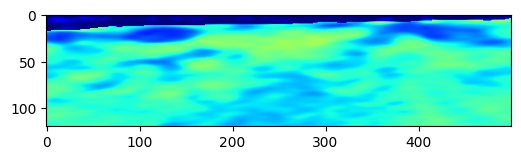

Epoch: 21 Loss:  -1.8630034923553467 model_loss:  1918597.4
Epoch: 22 Loss:  -1.8629303574562073 model_loss:  1952277.8
Epoch: 23 Loss:  -1.8641270399093628 model_loss:  2021934.9
Epoch: 24 Loss:  -1.8675737380981445 model_loss:  2143332.2
Epoch: 25 Loss:  -1.8703562021255493 model_loss:  2103588.0
Epoch: 26 Loss:  -1.8732064366340637 model_loss:  2075199.4
Epoch: 27 Loss:  -1.8753641247749329 model_loss:  1917830.2
Epoch: 28 Loss:  -1.876044511795044 model_loss:  1979938.6
Epoch: 29 Loss:  -1.8750818967819214 model_loss:  1975894.0
Epoch: 30 Loss:  -1.8770179152488708 model_loss:  1993746.6


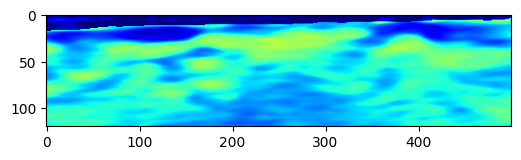

Epoch: 31 Loss:  -1.879521906375885 model_loss:  2029505.5
Epoch: 32 Loss:  -1.8832707405090332 model_loss:  1911413.5
Epoch: 33 Loss:  -1.8830249905586243 model_loss:  1947782.2
Epoch: 34 Loss:  -1.8846898078918457 model_loss:  2008985.2
Epoch: 35 Loss:  -1.8793485164642334 model_loss:  1964939.0
Epoch: 36 Loss:  -1.8766785860061646 model_loss:  2021134.5
Epoch: 37 Loss:  -1.8788581490516663 model_loss:  1922783.9
Epoch: 38 Loss:  -1.882155179977417 model_loss:  1981154.9
Epoch: 39 Loss:  -1.882913589477539 model_loss:  2000076.2
Epoch: 40 Loss:  -1.884874165058136 model_loss:  1963098.1


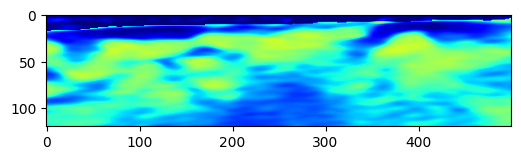

Epoch: 41 Loss:  -1.8870500922203064 model_loss:  2003219.8
Epoch: 42 Loss:  -1.8871411681175232 model_loss:  1956855.1
Epoch: 43 Loss:  -1.8780596256256104 model_loss:  2016615.4
Epoch: 44 Loss:  -1.8780576586723328 model_loss:  1968967.1
Epoch: 45 Loss:  -1.8816357851028442 model_loss:  2051173.9
Epoch: 46 Loss:  -1.8852011561393738 model_loss:  1993157.6
Epoch: 47 Loss:  -1.8893442153930664 model_loss:  1937885.0
Epoch: 48 Loss:  -1.890422284603119 model_loss:  2053805.6
Epoch: 49 Loss:  -1.8906919360160828 model_loss:  1920181.0
Epoch: 50 Loss:  -1.9004388451576233 model_loss:  1958670.6


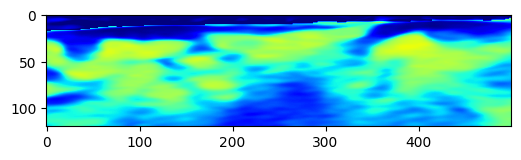

Epoch: 51 Loss:  -1.8870471119880676 model_loss:  1904650.9
Epoch: 52 Loss:  -1.9003351926803589 model_loss:  2011414.5
Epoch: 53 Loss:  -1.8987089395523071 model_loss:  1870831.8
Epoch: 54 Loss:  -1.895331621170044 model_loss:  1917167.1
Epoch: 55 Loss:  -1.8728944659233093 model_loss:  1774799.6
Epoch: 56 Loss:  -1.8799346089363098 model_loss:  1855932.0
Epoch: 57 Loss:  -1.882978916168213 model_loss:  1992163.2
Epoch: 58 Loss:  -1.8935655355453491 model_loss:  1824623.5
Epoch: 59 Loss:  -1.895663857460022 model_loss:  1848856.8
Epoch: 60 Loss:  -1.9033852815628052 model_loss:  1980482.4


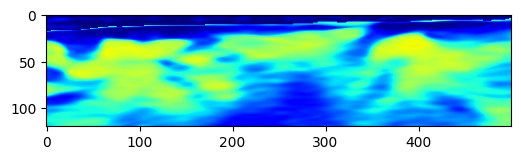

Epoch: 61 Loss:  -1.9135379791259766 model_loss:  1976175.0
Epoch: 62 Loss:  -1.9068524241447449 model_loss:  1877144.1
Epoch: 63 Loss:  -1.90805983543396 model_loss:  1785907.1
Epoch: 64 Loss:  -1.9082379341125488 model_loss:  1858954.1
Epoch: 65 Loss:  -1.9093328714370728 model_loss:  1836489.9
Epoch: 66 Loss:  -1.9092214703559875 model_loss:  1886159.8
Epoch: 67 Loss:  -1.909060299396515 model_loss:  1813571.1
Epoch: 68 Loss:  -1.9073007106781006 model_loss:  1816942.9
Epoch: 69 Loss:  -1.9117852449417114 model_loss:  1907487.4
Epoch: 70 Loss:  -1.926456868648529 model_loss:  1764172.4


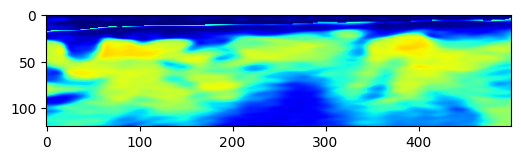

Epoch: 71 Loss:  -1.926434874534607 model_loss:  1746690.0
Epoch: 72 Loss:  -1.9293482303619385 model_loss:  1803403.8
Epoch: 73 Loss:  -1.929148256778717 model_loss:  1849511.6
Epoch: 74 Loss:  -1.930233120918274 model_loss:  1678064.4
Epoch: 75 Loss:  -1.9309000372886658 model_loss:  1649141.4
Epoch: 76 Loss:  -1.938370406627655 model_loss:  1811821.9
Epoch: 77 Loss:  -1.9377246499061584 model_loss:  1739392.8
Epoch: 78 Loss:  -1.939962923526764 model_loss:  1622330.4
Epoch: 79 Loss:  -1.9379456639289856 model_loss:  1597993.6
Epoch: 80 Loss:  -1.942882478237152 model_loss:  1612982.9


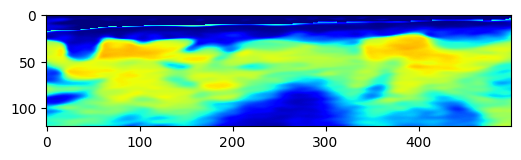

Epoch: 81 Loss:  -1.9414727687835693 model_loss:  1588098.2
Epoch: 82 Loss:  -1.9452834129333496 model_loss:  1513235.2
Epoch: 83 Loss:  -1.9460267424583435 model_loss:  1562608.2
Epoch: 84 Loss:  -1.9471608996391296 model_loss:  1515158.9
Epoch: 85 Loss:  -1.9492669105529785 model_loss:  1482633.1
Epoch: 86 Loss:  -1.949341893196106 model_loss:  1497350.4
Epoch: 87 Loss:  -1.9500879049301147 model_loss:  1446507.1
Epoch: 88 Loss:  -1.9495575428009033 model_loss:  1422535.1
Epoch: 89 Loss:  -1.9512545466423035 model_loss:  1365360.9
Epoch: 90 Loss:  -1.9516246318817139 model_loss:  1380674.6


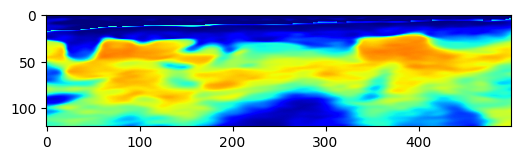

Epoch: 91 Loss:  -1.9522084593772888 model_loss:  1304749.4
Epoch: 92 Loss:  -1.9524694681167603 model_loss:  1274204.2
Epoch: 93 Loss:  -1.9530569314956665 model_loss:  1306522.2
Epoch: 94 Loss:  -1.953696370124817 model_loss:  1228470.6
Epoch: 95 Loss:  -1.9519255757331848 model_loss:  1191410.5
Epoch: 96 Loss:  -1.95169597864151 model_loss:  1219744.2
Epoch: 97 Loss:  -1.950688123703003 model_loss:  1162609.8
Epoch: 98 Loss:  -1.9483485221862793 model_loss:  1165987.9
Epoch: 99 Loss:  -1.9461275935173035 model_loss:  1087626.1
Epoch: 100 Loss:  -1.9445205926895142 model_loss:  1148918.5


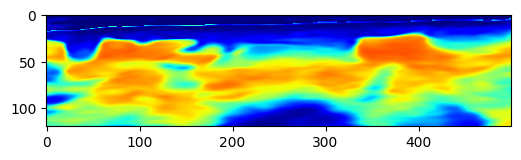

Epoch: 101 Loss:  -1.945914626121521 model_loss:  1003434.8
Epoch: 102 Loss:  -1.948444426059723 model_loss:  1124199.2
Epoch: 103 Loss:  -1.9469884634017944 model_loss:  1020848.1
Epoch: 104 Loss:  -1.9492265582084656 model_loss:  957685.94
Epoch: 105 Loss:  -1.9513212442398071 model_loss:  1059935.9
Epoch: 106 Loss:  -1.9494229555130005 model_loss:  978752.9
Epoch: 107 Loss:  -1.949235200881958 model_loss:  917370.2
Epoch: 108 Loss:  -1.9524874091148376 model_loss:  1010975.3
Epoch: 109 Loss:  -1.9522019028663635 model_loss:  889535.94
Epoch: 110 Loss:  -1.9523515105247498 model_loss:  844065.56


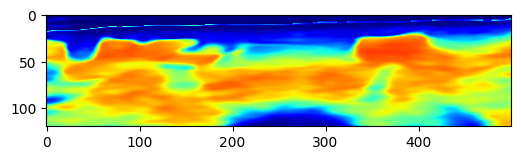

Epoch: 111 Loss:  -1.9544853568077087 model_loss:  907312.94
Epoch: 112 Loss:  -1.9547168612480164 model_loss:  865200.3
Epoch: 113 Loss:  -1.956041693687439 model_loss:  786701.1
Epoch: 114 Loss:  -1.9568440914154053 model_loss:  812072.25
Epoch: 115 Loss:  -1.956099271774292 model_loss:  759902.5
Epoch: 116 Loss:  -1.9561730027198792 model_loss:  731443.6
Epoch: 117 Loss:  -1.9567835927009583 model_loss:  738760.2
Epoch: 118 Loss:  -1.9577127695083618 model_loss:  702261.9
Epoch: 119 Loss:  -1.9586008191108704 model_loss:  650005.9
Epoch: 120 Loss:  -1.9593724608421326 model_loss:  659608.0


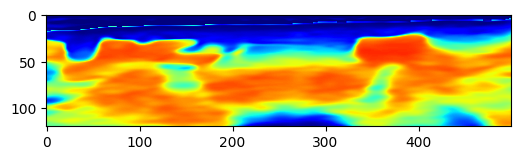

Epoch: 121 Loss:  -1.959376037120819 model_loss:  626102.56
Epoch: 122 Loss:  -1.9596226811408997 model_loss:  591459.9
Epoch: 123 Loss:  -1.9598003029823303 model_loss:  575436.6
Epoch: 124 Loss:  -1.9596785306930542 model_loss:  552610.94
Epoch: 125 Loss:  -1.9599233865737915 model_loss:  513701.75
Epoch: 126 Loss:  -1.9601409435272217 model_loss:  511911.3
Epoch: 127 Loss:  -1.9603055119514465 model_loss:  467259.2
Epoch: 128 Loss:  -1.9605603218078613 model_loss:  451758.7
Epoch: 129 Loss:  -1.960832417011261 model_loss:  432342.1
Epoch: 130 Loss:  -1.9611660242080688 model_loss:  405961.28


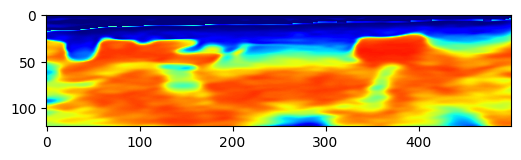

Epoch: 131 Loss:  -1.9616098999977112 model_loss:  388029.78
Epoch: 132 Loss:  -1.9617982506752014 model_loss:  374668.0
Epoch: 133 Loss:  -1.9621719717979431 model_loss:  346873.3
Epoch: 134 Loss:  -1.9623903036117554 model_loss:  342063.6
Epoch: 135 Loss:  -1.962291657924652 model_loss:  318074.22
Epoch: 136 Loss:  -1.962224304676056 model_loss:  313349.25
Epoch: 137 Loss:  -1.9622493982315063 model_loss:  299207.16
Epoch: 138 Loss:  -1.962295114994049 model_loss:  289943.0
Epoch: 139 Loss:  -1.962605059146881 model_loss:  279670.28
Epoch: 140 Loss:  -1.9627963304519653 model_loss:  273115.8


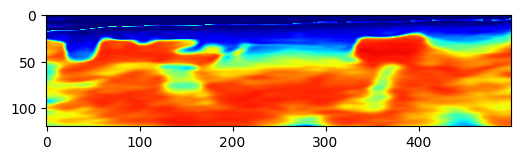

Epoch: 141 Loss:  -1.9631547927856445 model_loss:  260322.75
Epoch: 142 Loss:  -1.9633705019950867 model_loss:  257487.88
Epoch: 143 Loss:  -1.9635335803031921 model_loss:  245290.89
Epoch: 144 Loss:  -1.9635639190673828 model_loss:  241304.78
Epoch: 145 Loss:  -1.9636530876159668 model_loss:  232008.2
Epoch: 146 Loss:  -1.9636536240577698 model_loss:  227481.97
Epoch: 147 Loss:  -1.9637839794158936 model_loss:  221498.31
Epoch: 148 Loss:  -1.963807761669159 model_loss:  216447.77
Epoch: 149 Loss:  -1.9639750123023987 model_loss:  209398.75
Epoch: 150 Loss:  -1.964106559753418 model_loss:  206869.2


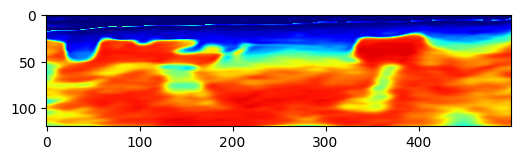

Epoch: 151 Loss:  -1.9643223285675049 model_loss:  199120.97
Epoch: 152 Loss:  -1.9644322395324707 model_loss:  196903.88
Epoch: 153 Loss:  -1.9645345211029053 model_loss:  189766.83
Epoch: 154 Loss:  -1.9645365476608276 model_loss:  187452.8
Epoch: 155 Loss:  -1.9646235704421997 model_loss:  181915.7
Epoch: 156 Loss:  -1.9646501541137695 model_loss:  178476.4
Epoch: 157 Loss:  -1.9647555351257324 model_loss:  174008.06
Epoch: 158 Loss:  -1.964812695980072 model_loss:  170930.48
Epoch: 159 Loss:  -1.964980125427246 model_loss:  166111.84
Epoch: 160 Loss:  -1.9650585651397705 model_loss:  164068.0


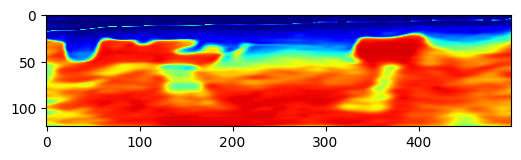

Epoch: 161 Loss:  -1.9652461409568787 model_loss:  158922.2
Epoch: 162 Loss:  -1.9652872681617737 model_loss:  157724.4
Epoch: 163 Loss:  -1.9653805494308472 model_loss:  152695.38
Epoch: 164 Loss:  -1.9653708934783936 model_loss:  151885.36
Epoch: 165 Loss:  -1.9654455184936523 model_loss:  147920.72
Epoch: 166 Loss:  -1.965419352054596 model_loss:  146821.88
Epoch: 167 Loss:  -1.9655434489250183 model_loss:  144173.98
Epoch: 168 Loss:  -1.9655106663703918 model_loss:  142582.53
Epoch: 169 Loss:  -1.9657350182533264 model_loss:  140380.33
Epoch: 170 Loss:  -1.9657732844352722 model_loss:  139346.61


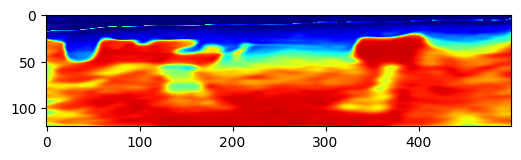

Epoch: 171 Loss:  -1.9659656286239624 model_loss:  136584.45
Epoch: 172 Loss:  -1.9659605622291565 model_loss:  136364.34
Epoch: 173 Loss:  -1.966064453125 model_loss:  133322.98
Epoch: 174 Loss:  -1.9660545587539673 model_loss:  133319.08
Epoch: 175 Loss:  -1.9660891890525818 model_loss:  130580.55
Epoch: 176 Loss:  -1.965973675251007 model_loss:  130393.0
Epoch: 177 Loss:  -1.9660720229148865 model_loss:  128448.48
Epoch: 178 Loss:  -1.9660481810569763 model_loss:  127616.62
Epoch: 179 Loss:  -1.9662806391716003 model_loss:  126399.38
Epoch: 180 Loss:  -1.9662426710128784 model_loss:  125411.875


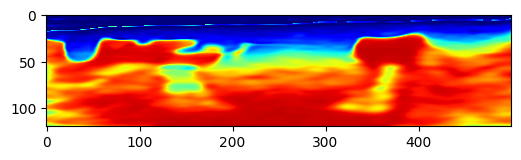

Epoch: 181 Loss:  -1.9664034247398376 model_loss:  124071.234
Epoch: 182 Loss:  -1.9664891362190247 model_loss:  123204.47
Epoch: 183 Loss:  -1.966613233089447 model_loss:  121581.16
Epoch: 184 Loss:  -1.9665842652320862 model_loss:  121330.5
Epoch: 185 Loss:  -1.966711699962616 model_loss:  119165.26
Epoch: 186 Loss:  -1.966645359992981 model_loss:  119390.65
Epoch: 187 Loss:  -1.966743528842926 model_loss:  117296.12
Epoch: 188 Loss:  -1.9666211605072021 model_loss:  117592.21
Epoch: 189 Loss:  -1.9666008949279785 model_loss:  115595.08
Epoch: 190 Loss:  -1.9665706753730774 model_loss:  115731.266


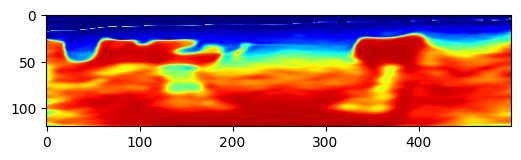

Epoch: 191 Loss:  -1.9667003750801086 model_loss:  114407.49
Epoch: 192 Loss:  -1.9666359424591064 model_loss:  113598.82
Epoch: 193 Loss:  -1.9668578505516052 model_loss:  113518.9
Epoch: 194 Loss:  -1.9668944478034973 model_loss:  111860.234
Epoch: 195 Loss:  -1.9670888781547546 model_loss:  111642.35
Epoch: 196 Loss:  -1.9671111106872559 model_loss:  110937.125
Epoch: 197 Loss:  -1.9672759771347046 model_loss:  109520.31
Epoch: 198 Loss:  -1.9672107100486755 model_loss:  109294.12
Epoch: 199 Loss:  -1.9672576785087585 model_loss:  108088.664
Epoch: 200 Loss:  -1.9673332571983337 model_loss:  107629.23


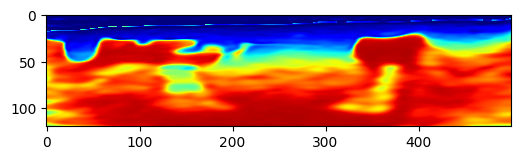

Epoch: 201 Loss:  -1.9676759243011475 model_loss:  106885.63
Epoch: 202 Loss:  -1.9683480262756348 model_loss:  106394.54
Epoch: 203 Loss:  -1.9691269993782043 model_loss:  106013.41
Epoch: 204 Loss:  -1.9696358442306519 model_loss:  104386.695
Epoch: 205 Loss:  -1.9697450995445251 model_loss:  104746.73
Epoch: 206 Loss:  -1.9697559475898743 model_loss:  103357.3
Epoch: 207 Loss:  -1.9696903824806213 model_loss:  102834.26
Epoch: 208 Loss:  -1.9695796966552734 model_loss:  101969.42
Epoch: 209 Loss:  -1.969367504119873 model_loss:  101596.266
Epoch: 210 Loss:  -1.9692482948303223 model_loss:  100219.22


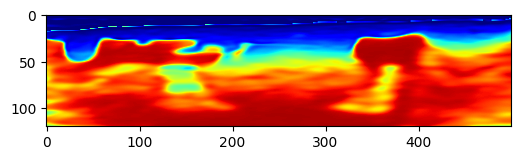

Epoch: 211 Loss:  -1.9690654873847961 model_loss:  100010.12
Epoch: 212 Loss:  -1.9690920114517212 model_loss:  99252.76
Epoch: 213 Loss:  -1.9690580368041992 model_loss:  98617.33
Epoch: 214 Loss:  -1.9692001938819885 model_loss:  97837.82
Epoch: 215 Loss:  -1.9692066311836243 model_loss:  97767.836
Epoch: 216 Loss:  -1.9693211913108826 model_loss:  96498.586
Epoch: 217 Loss:  -1.9693047404289246 model_loss:  96474.414
Epoch: 218 Loss:  -1.9693835377693176 model_loss:  95473.07
Epoch: 219 Loss:  -1.9693096280097961 model_loss:  95314.65
Epoch: 220 Loss:  -1.9693434834480286 model_loss:  94410.91


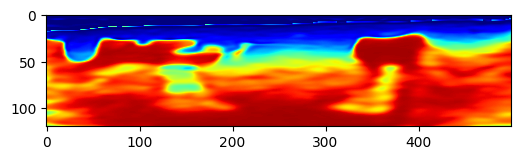

Epoch: 221 Loss:  -1.9692376255989075 model_loss:  94209.44
Epoch: 222 Loss:  -1.9692466259002686 model_loss:  93419.57
Epoch: 223 Loss:  -1.9691097736358643 model_loss:  93213.46
Epoch: 224 Loss:  -1.9691395163536072 model_loss:  92425.95
Epoch: 225 Loss:  -1.969016969203949 model_loss:  92141.766
Epoch: 226 Loss:  -1.9690988063812256 model_loss:  91582.02
Epoch: 227 Loss:  -1.9690579175949097 model_loss:  91172.84
Epoch: 228 Loss:  -1.9692006707191467 model_loss:  90609.32
Epoch: 229 Loss:  -1.969184160232544 model_loss:  90398.72
Epoch: 230 Loss:  -1.9693140387535095 model_loss:  89633.01


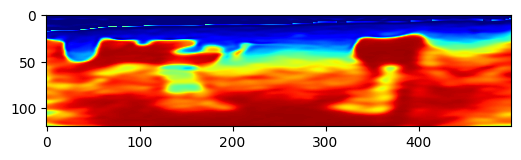

Epoch: 231 Loss:  -1.9692619442939758 model_loss:  89540.61
Epoch: 232 Loss:  -1.9693500995635986 model_loss:  88711.016
Epoch: 233 Loss:  -1.9692630767822266 model_loss:  88759.07
Epoch: 234 Loss:  -1.9693171977996826 model_loss:  87810.03
Epoch: 235 Loss:  -1.9692077040672302 model_loss:  87988.92
Epoch: 236 Loss:  -1.9692588448524475 model_loss:  87030.66
Epoch: 237 Loss:  -1.9691434502601624 model_loss:  87134.99
Epoch: 238 Loss:  -1.9692255854606628 model_loss:  86389.125
Epoch: 239 Loss:  -1.9691312313079834 model_loss:  86290.7
Epoch: 240 Loss:  -1.9692569971084595 model_loss:  85824.0


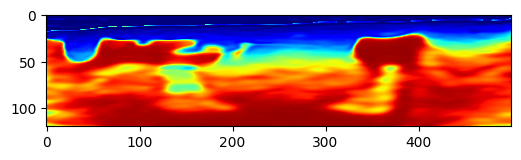

Epoch: 241 Loss:  -1.9691981077194214 model_loss:  85471.47
Epoch: 242 Loss:  -1.9693524241447449 model_loss:  85240.79
Epoch: 243 Loss:  -1.9693069458007812 model_loss:  84696.17
Epoch: 244 Loss:  -1.969456970691681 model_loss:  84547.586
Epoch: 245 Loss:  -1.9694029688835144 model_loss:  83999.76
Epoch: 246 Loss:  -1.9695323705673218 model_loss:  83755.52
Epoch: 247 Loss:  -1.9694722890853882 model_loss:  83373.15
Epoch: 248 Loss:  -1.9695860743522644 model_loss:  82906.19
Epoch: 249 Loss:  -1.9695191979408264 model_loss:  82827.59
Epoch: 250 Loss:  -1.9696140885353088 model_loss:  81977.484


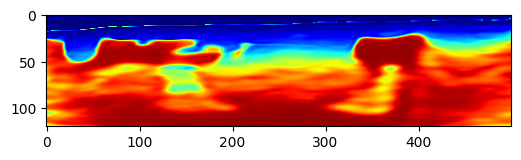

Epoch: 251 Loss:  -1.9695169925689697 model_loss:  82398.85
Epoch: 252 Loss:  -1.969557762145996 model_loss:  81016.48
Epoch: 253 Loss:  -1.9693812131881714 model_loss:  82018.15
Epoch: 254 Loss:  -1.9693384766578674 model_loss:  80262.3
Epoch: 255 Loss:  -1.9691057205200195 model_loss:  81309.56
Epoch: 256 Loss:  -1.969146728515625 model_loss:  80168.6
Epoch: 257 Loss:  -1.9690393209457397 model_loss:  80163.09
Epoch: 258 Loss:  -1.9693331122398376 model_loss:  80524.27
Epoch: 259 Loss:  -1.9693524241447449 model_loss:  79359.19
Epoch: 260 Loss:  -1.969653606414795 model_loss:  80421.66


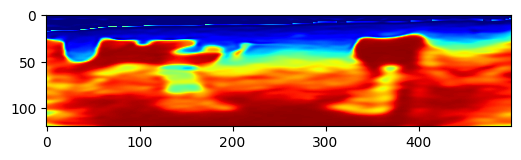

Epoch: 261 Loss:  -1.969552993774414 model_loss:  78709.76
Epoch: 262 Loss:  -1.9696245789527893 model_loss:  79933.52
Epoch: 263 Loss:  -1.9693394899368286 model_loss:  77841.51
Epoch: 264 Loss:  -1.9692248106002808 model_loss:  79401.38
Epoch: 265 Loss:  -1.9689545035362244 model_loss:  77390.58
Epoch: 266 Loss:  -1.9690456986427307 model_loss:  78020.6
Epoch: 267 Loss:  -1.9693355560302734 model_loss:  77862.79
Epoch: 268 Loss:  -1.9698084592819214 model_loss:  76585.22
Epoch: 269 Loss:  -1.9701520204544067 model_loss:  78073.14
Epoch: 270 Loss:  -1.9703943729400635 model_loss:  75863.18


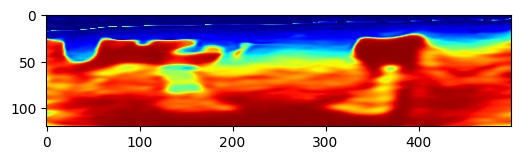

Epoch: 271 Loss:  -1.97017240524292 model_loss:  77769.1
Epoch: 272 Loss:  -1.9697582125663757 model_loss:  75204.17
Epoch: 273 Loss:  -1.9688758254051208 model_loss:  77247.24
Epoch: 274 Loss:  -1.9682156443595886 model_loss:  75428.44
Epoch: 275 Loss:  -1.9678404331207275 model_loss:  75783.734
Epoch: 276 Loss:  -1.9684247970581055 model_loss:  77212.69
Epoch: 277 Loss:  -1.9685987830162048 model_loss:  74838.94
Epoch: 278 Loss:  -1.969247043132782 model_loss:  76761.484
Epoch: 279 Loss:  -1.9691716432571411 model_loss:  75083.38
Epoch: 280 Loss:  -1.9692522883415222 model_loss:  75789.8


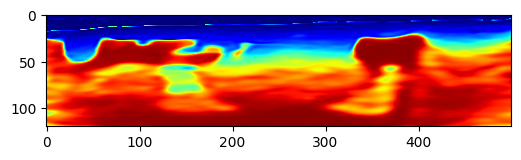

Epoch: 281 Loss:  -1.969195008277893 model_loss:  74904.15
Epoch: 282 Loss:  -1.9693583846092224 model_loss:  74736.77
Epoch: 283 Loss:  -1.9698333740234375 model_loss:  75474.56
Epoch: 284 Loss:  -1.9701574444770813 model_loss:  73977.586
Epoch: 285 Loss:  -1.970005214214325 model_loss:  75204.68
Epoch: 286 Loss:  -1.9696484208106995 model_loss:  73325.96
Epoch: 287 Loss:  -1.9690130352973938 model_loss:  74833.93
Epoch: 288 Loss:  -1.9687740206718445 model_loss:  73640.77
Epoch: 289 Loss:  -1.9683647751808167 model_loss:  73200.96
Epoch: 290 Loss:  -1.9688093662261963 model_loss:  74041.19


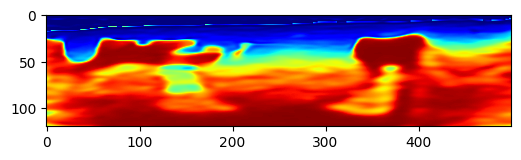

Epoch: 291 Loss:  -1.969046175479889 model_loss:  72957.58
Epoch: 292 Loss:  -1.9695369005203247 model_loss:  74087.695
Epoch: 293 Loss:  -1.9696130752563477 model_loss:  72740.05
Epoch: 294 Loss:  -1.9699559807777405 model_loss:  72817.77
Epoch: 295 Loss:  -1.9699633717536926 model_loss:  72594.04
Epoch: 296 Loss:  -1.9700639247894287 model_loss:  72607.61
Epoch: 297 Loss:  -1.970127284526825 model_loss:  72216.195
Epoch: 298 Loss:  -1.9701579809188843 model_loss:  71597.19
Epoch: 299 Loss:  -1.9700788259506226 model_loss:  72680.76
Epoch: 300 Loss:  -1.970042884349823 model_loss:  70606.14


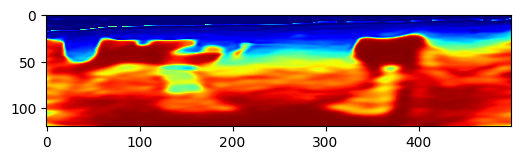

Epoch: 301 Loss:  -1.9694784879684448 model_loss:  72268.16
Epoch: 302 Loss:  -1.9691244959831238 model_loss:  70754.67
Epoch: 303 Loss:  -1.9686527848243713 model_loss:  70656.49
Epoch: 304 Loss:  -1.968783974647522 model_loss:  71550.99
Epoch: 305 Loss:  -1.9690433144569397 model_loss:  70605.055
Epoch: 306 Loss:  -1.9696617722511292 model_loss:  71183.06
Epoch: 307 Loss:  -1.9697462916374207 model_loss:  70060.766
Epoch: 308 Loss:  -1.9701539278030396 model_loss:  70777.77
Epoch: 309 Loss:  -1.9702290892601013 model_loss:  70192.29
Epoch: 310 Loss:  -1.9702313542366028 model_loss:  70023.92


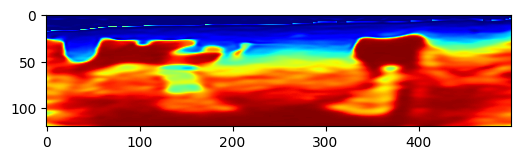

Epoch: 311 Loss:  -1.9701913595199585 model_loss:  69836.46
Epoch: 312 Loss:  -1.9701775312423706 model_loss:  69556.56
Epoch: 313 Loss:  -1.970058798789978 model_loss:  69810.164
Epoch: 314 Loss:  -1.9701465368270874 model_loss:  69020.8
Epoch: 315 Loss:  -1.970031499862671 model_loss:  69912.164
Epoch: 316 Loss:  -1.9699196219444275 model_loss:  67879.15
Epoch: 317 Loss:  -1.9692078828811646 model_loss:  70060.086
Epoch: 318 Loss:  -1.969077467918396 model_loss:  68380.336
Epoch: 319 Loss:  -1.9687060117721558 model_loss:  68207.83
Epoch: 320 Loss:  -1.969291627407074 model_loss:  69963.47


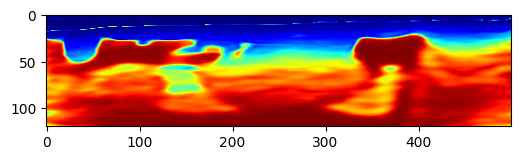

Epoch: 321 Loss:  -1.9695578813552856 model_loss:  67830.08
Epoch: 322 Loss:  -1.9700044989585876 model_loss:  69051.73
Epoch: 323 Loss:  -1.9696208238601685 model_loss:  68194.16
Epoch: 324 Loss:  -1.969725787639618 model_loss:  68024.24
Epoch: 325 Loss:  -1.9689058065414429 model_loss:  67653.8
Epoch: 326 Loss:  -1.9681174159049988 model_loss:  68733.0
Epoch: 327 Loss:  -1.9631654024124146 model_loss:  68513.945
Epoch: 328 Loss:  -1.9629466533660889 model_loss:  66665.5
Epoch: 329 Loss:  -1.9690371751785278 model_loss:  68351.41
Epoch: 330 Loss:  -1.9551861882209778 model_loss:  68418.83


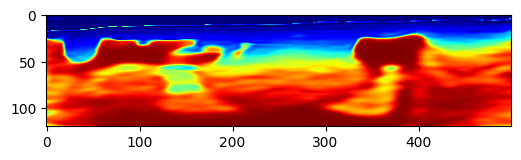

Epoch: 331 Loss:  -1.9611681699752808 model_loss:  68675.55
Epoch: 332 Loss:  -1.9589717388153076 model_loss:  67618.56
Epoch: 333 Loss:  -1.9533356428146362 model_loss:  69600.63
Epoch: 334 Loss:  -1.9464578032493591 model_loss:  70630.22
Epoch: 335 Loss:  -1.9392061233520508 model_loss:  67864.8
Epoch: 336 Loss:  -1.9298208951950073 model_loss:  74690.64
Epoch: 337 Loss:  -1.9182473421096802 model_loss:  75927.586
Epoch: 338 Loss:  -1.9352896809577942 model_loss:  73242.1
Epoch: 339 Loss:  -1.9426084160804749 model_loss:  75634.01
Epoch: 340 Loss:  -1.9340418577194214 model_loss:  82678.75


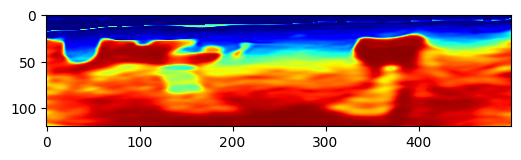

Epoch: 341 Loss:  -1.9392459988594055 model_loss:  86397.7
Epoch: 342 Loss:  -1.9365551471710205 model_loss:  91331.0
Epoch: 343 Loss:  -1.937870442867279 model_loss:  91834.7
Epoch: 344 Loss:  -1.9458011388778687 model_loss:  86900.14
Epoch: 345 Loss:  -1.9485443830490112 model_loss:  89061.85
Epoch: 346 Loss:  -1.950761616230011 model_loss:  88347.53
Epoch: 347 Loss:  -1.9529251456260681 model_loss:  86796.95
Epoch: 348 Loss:  -1.9474111199378967 model_loss:  86978.125
Epoch: 349 Loss:  -1.9465036988258362 model_loss:  83237.336
Epoch: 350 Loss:  -1.952738642692566 model_loss:  83905.445


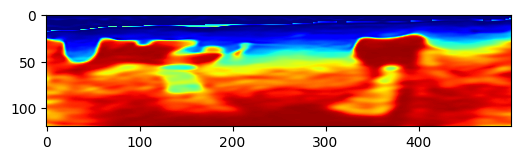

Epoch: 351 Loss:  -1.951284646987915 model_loss:  82731.65
Epoch: 352 Loss:  -1.9523775577545166 model_loss:  84804.59
Epoch: 353 Loss:  -1.957563579082489 model_loss:  88048.35
Epoch: 354 Loss:  -1.9572808742523193 model_loss:  82403.37
Epoch: 355 Loss:  -1.9561334252357483 model_loss:  81268.414
Epoch: 356 Loss:  -1.954693078994751 model_loss:  83011.81
Epoch: 357 Loss:  -1.9564857482910156 model_loss:  80035.69
Epoch: 358 Loss:  -1.9563734531402588 model_loss:  80366.99
Epoch: 359 Loss:  -1.958887755870819 model_loss:  83193.09
Epoch: 360 Loss:  -1.9619210362434387 model_loss:  81371.89


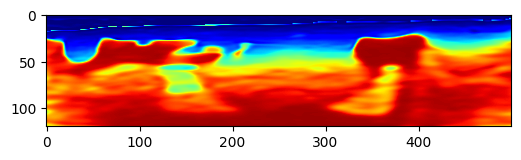

Epoch: 361 Loss:  -1.96381676197052 model_loss:  80599.0
Epoch: 362 Loss:  -1.9630364775657654 model_loss:  80549.42
Epoch: 363 Loss:  -1.9626427292823792 model_loss:  79752.414
Epoch: 364 Loss:  -1.9614338874816895 model_loss:  79262.586
Epoch: 365 Loss:  -1.9604055285453796 model_loss:  79132.2
Epoch: 366 Loss:  -1.9627534747123718 model_loss:  80897.414
Epoch: 367 Loss:  -1.9637677669525146 model_loss:  79486.36
Epoch: 368 Loss:  -1.9658990502357483 model_loss:  78409.09
Epoch: 369 Loss:  -1.9682577848434448 model_loss:  80002.5
Epoch: 370 Loss:  -1.9682103991508484 model_loss:  78828.31


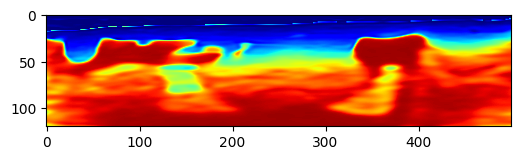

Epoch: 371 Loss:  -1.968962848186493 model_loss:  78690.22
Epoch: 372 Loss:  -1.9685155153274536 model_loss:  77552.28
Epoch: 373 Loss:  -1.9682090878486633 model_loss:  75757.016
Epoch: 374 Loss:  -1.967896044254303 model_loss:  77826.516
Epoch: 375 Loss:  -1.9675412774085999 model_loss:  77051.87
Epoch: 376 Loss:  -1.9678314924240112 model_loss:  76078.82
Epoch: 377 Loss:  -1.9687834978103638 model_loss:  76078.9
Epoch: 378 Loss:  -1.9695537090301514 model_loss:  75673.34
Epoch: 379 Loss:  -1.970480740070343 model_loss:  76513.875
Epoch: 380 Loss:  -1.9706124067306519 model_loss:  75454.586


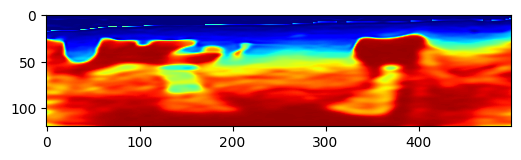

Epoch: 381 Loss:  -1.9710644483566284 model_loss:  74054.06
Epoch: 382 Loss:  -1.9710807800292969 model_loss:  74711.555
Epoch: 383 Loss:  -1.9707136750221252 model_loss:  74047.336
Epoch: 384 Loss:  -1.9702839255332947 model_loss:  74233.56
Epoch: 385 Loss:  -1.9700658917427063 model_loss:  73475.46
Epoch: 386 Loss:  -1.9698114395141602 model_loss:  73344.62
Epoch: 387 Loss:  -1.9703177213668823 model_loss:  73419.914
Epoch: 388 Loss:  -1.9704251289367676 model_loss:  72787.03
Epoch: 389 Loss:  -1.9710665345191956 model_loss:  72695.18
Epoch: 390 Loss:  -1.9711785316467285 model_loss:  72464.54


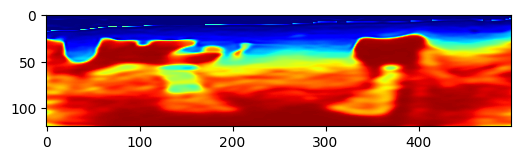

Epoch: 391 Loss:  -1.9714855551719666 model_loss:  71675.78
Epoch: 392 Loss:  -1.9714045524597168 model_loss:  72070.766
Epoch: 393 Loss:  -1.971388339996338 model_loss:  71507.65
Epoch: 394 Loss:  -1.9710619449615479 model_loss:  71604.91
Epoch: 395 Loss:  -1.9710783958435059 model_loss:  70968.164
Epoch: 396 Loss:  -1.9707496762275696 model_loss:  70980.51
Epoch: 397 Loss:  -1.9709770679473877 model_loss:  70810.82
Epoch: 398 Loss:  -1.9708344340324402 model_loss:  70626.63
Epoch: 399 Loss:  -1.9712324142456055 model_loss:  70249.19
Epoch: 400 Loss:  -1.9712383151054382 model_loss:  70094.85


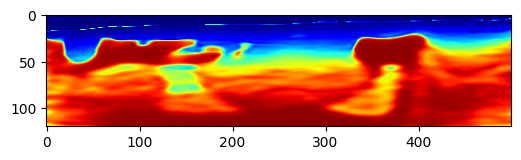

Epoch: 401 Loss:  -1.9720527529716492 model_loss:  70225.83
Epoch: 402 Loss:  -1.9730893969535828 model_loss:  69698.46
Epoch: 403 Loss:  -1.973983883857727 model_loss:  69738.695
Epoch: 404 Loss:  -1.9742944836616516 model_loss:  69388.32
Epoch: 405 Loss:  -1.9742830991744995 model_loss:  69128.72
Epoch: 406 Loss:  -1.9741417169570923 model_loss:  68858.99
Epoch: 407 Loss:  -1.9738598465919495 model_loss:  68879.54
Epoch: 408 Loss:  -1.9736230373382568 model_loss:  68229.86
Epoch: 409 Loss:  -1.973317265510559 model_loss:  68373.16
Epoch: 410 Loss:  -1.9734079241752625 model_loss:  67972.89


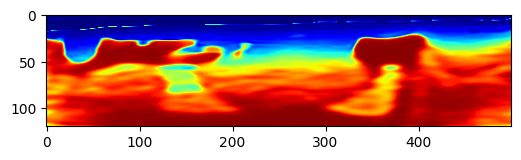

Epoch: 411 Loss:  -1.9732964634895325 model_loss:  67774.51
Epoch: 412 Loss:  -1.9735798239707947 model_loss:  67702.95
Epoch: 413 Loss:  -1.9735748171806335 model_loss:  67463.836
Epoch: 414 Loss:  -1.9737935662269592 model_loss:  67215.19
Epoch: 415 Loss:  -1.9737604260444641 model_loss:  67157.51
Epoch: 416 Loss:  -1.9738730192184448 model_loss:  66793.38
Epoch: 417 Loss:  -1.9737549424171448 model_loss:  66769.805
Epoch: 418 Loss:  -1.9738026857376099 model_loss:  66410.93
Epoch: 419 Loss:  -1.9735533595085144 model_loss:  66462.234
Epoch: 420 Loss:  -1.973542332649231 model_loss:  66026.05


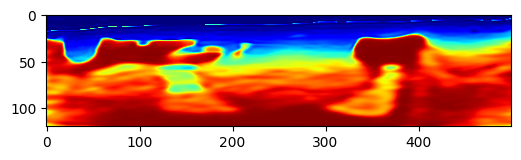

Epoch: 421 Loss:  -1.9732277393341064 model_loss:  66164.69
Epoch: 422 Loss:  -1.9732698202133179 model_loss:  65711.04
Epoch: 423 Loss:  -1.973040759563446 model_loss:  65796.06
Epoch: 424 Loss:  -1.97323077917099 model_loss:  65475.527
Epoch: 425 Loss:  -1.9731119871139526 model_loss:  65478.445
Epoch: 426 Loss:  -1.9733788967132568 model_loss:  65231.77
Epoch: 427 Loss:  -1.973256528377533 model_loss:  65234.34
Epoch: 428 Loss:  -1.9734848141670227 model_loss:  64946.387
Epoch: 429 Loss:  -1.9733046889305115 model_loss:  65007.92
Epoch: 430 Loss:  -1.9734686017036438 model_loss:  64660.9


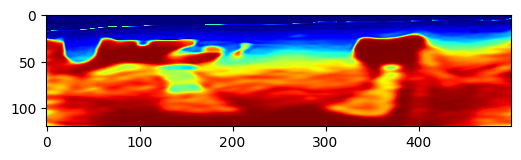

Epoch: 431 Loss:  -1.9732463955879211 model_loss:  64766.19
Epoch: 432 Loss:  -1.973381757736206 model_loss:  64385.9
Epoch: 433 Loss:  -1.973139464855194 model_loss:  64532.906
Epoch: 434 Loss:  -1.973288357257843 model_loss:  64125.39
Epoch: 435 Loss:  -1.9730469584465027 model_loss:  64328.5
Epoch: 436 Loss:  -1.9732430577278137 model_loss:  63903.223
Epoch: 437 Loss:  -1.9730265736579895 model_loss:  64086.875
Epoch: 438 Loss:  -1.9732772707939148 model_loss:  63722.094
Epoch: 439 Loss:  -1.9730815291404724 model_loss:  63843.9
Epoch: 440 Loss:  -1.9733437299728394 model_loss:  63546.168


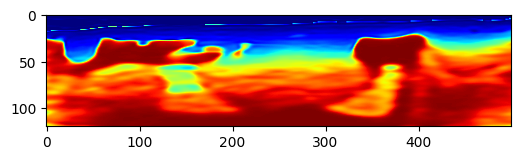

Epoch: 441 Loss:  -1.9731316566467285 model_loss:  63623.34
Epoch: 442 Loss:  -1.9733703136444092 model_loss:  63347.47
Epoch: 443 Loss:  -1.9731308817863464 model_loss:  63446.4
Epoch: 444 Loss:  -1.9733442664146423 model_loss:  63135.83
Epoch: 445 Loss:  -1.973098874092102 model_loss:  63278.875
Epoch: 446 Loss:  -1.9733136892318726 model_loss:  62922.848
Epoch: 447 Loss:  -1.9730780720710754 model_loss:  63127.773
Epoch: 448 Loss:  -1.973310112953186 model_loss:  62715.64
Epoch: 449 Loss:  -1.9730692505836487 model_loss:  62986.9
Epoch: 450 Loss:  -1.9733192324638367 model_loss:  62526.953


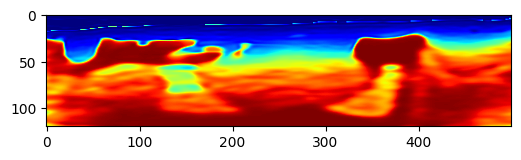

Epoch: 451 Loss:  -1.9730553030967712 model_loss:  62829.535
Epoch: 452 Loss:  -1.9733197689056396 model_loss:  62375.305
Epoch: 453 Loss:  -1.9730424284934998 model_loss:  62629.848
Epoch: 454 Loss:  -1.9733258485794067 model_loss:  62268.195
Epoch: 455 Loss:  -1.9730508923530579 model_loss:  62409.387
Epoch: 456 Loss:  -1.9733445644378662 model_loss:  62171.023
Epoch: 457 Loss:  -1.9730782508850098 model_loss:  62222.816
Epoch: 458 Loss:  -1.9733705520629883 model_loss:  62042.88
Epoch: 459 Loss:  -1.9731150269508362 model_loss:  62082.61
Epoch: 460 Loss:  -1.9733994007110596 model_loss:  61874.082


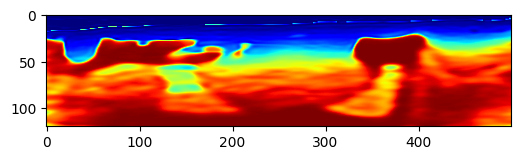

Epoch: 461 Loss:  -1.9731561541557312 model_loss:  61985.492
Epoch: 462 Loss:  -1.9734289646148682 model_loss:  61670.2
Epoch: 463 Loss:  -1.973179280757904 model_loss:  61933.242
Epoch: 464 Loss:  -1.9734358191490173 model_loss:  61430.457
Epoch: 465 Loss:  -1.9731357097625732 model_loss:  61907.516
Epoch: 466 Loss:  -1.9733773469924927 model_loss:  61202.11
Epoch: 467 Loss:  -1.9730104207992554 model_loss:  61815.875
Epoch: 468 Loss:  -1.9732805490493774 model_loss:  61098.992
Epoch: 469 Loss:  -1.972914457321167 model_loss:  61547.234
Epoch: 470 Loss:  -1.9732818603515625 model_loss:  61172.734


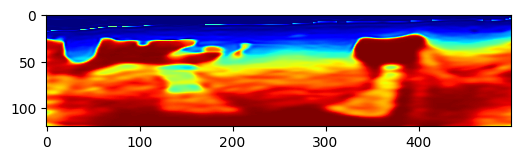

Epoch: 471 Loss:  -1.9729802012443542 model_loss:  61230.28
Epoch: 472 Loss:  -1.9734166860580444 model_loss:  61248.082
Epoch: 473 Loss:  -1.9731279015541077 model_loss:  61028.004
Epoch: 474 Loss:  -1.973528504371643 model_loss:  61201.715
Epoch: 475 Loss:  -1.9732173085212708 model_loss:  60892.25
Epoch: 476 Loss:  -1.9735392332077026 model_loss:  61102.277
Epoch: 477 Loss:  -1.9732988476753235 model_loss:  60746.996
Epoch: 478 Loss:  -1.973574936389923 model_loss:  61010.6
Epoch: 479 Loss:  -1.9734516143798828 model_loss:  60594.703
Epoch: 480 Loss:  -1.9737313389778137 model_loss:  60903.355


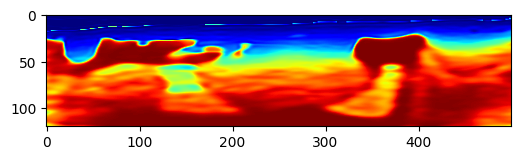

Epoch: 481 Loss:  -1.9736012816429138 model_loss:  60470.324
Epoch: 482 Loss:  -1.9739278554916382 model_loss:  60771.586
Epoch: 483 Loss:  -1.9736947417259216 model_loss:  60321.996
Epoch: 484 Loss:  -1.9740126132965088 model_loss:  60694.168
Epoch: 485 Loss:  -1.9736908078193665 model_loss:  60012.297
Epoch: 486 Loss:  -1.9738215804100037 model_loss:  60868.79
Epoch: 487 Loss:  -1.9733144044876099 model_loss:  59378.45
Epoch: 488 Loss:  -1.972843050956726 model_loss:  61408.54
Epoch: 489 Loss:  -1.9719690084457397 model_loss:  58983.14
Epoch: 490 Loss:  -1.9714094400405884 model_loss:  60444.688


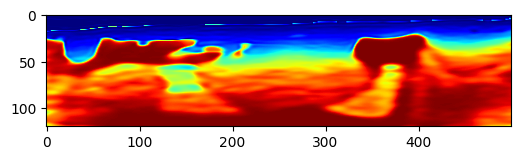

Epoch: 491 Loss:  -1.9718334078788757 model_loss:  60066.023
Epoch: 492 Loss:  -1.9726114869117737 model_loss:  59677.098
Epoch: 493 Loss:  -1.9735795855522156 model_loss:  60363.17
Epoch: 494 Loss:  -1.9745142459869385 model_loss:  60011.17
Epoch: 495 Loss:  -1.9752503633499146 model_loss:  60199.477
Epoch: 496 Loss:  -1.975427508354187 model_loss:  60092.73
Epoch: 497 Loss:  -1.9752487540245056 model_loss:  59890.68
Epoch: 498 Loss:  -1.9748140573501587 model_loss:  60235.87
Epoch: 499 Loss:  -1.9741604924201965 model_loss:  59884.902
Epoch: 500 Loss:  -1.9731249809265137 model_loss:  59511.914


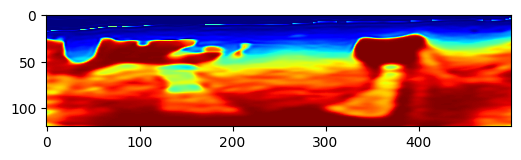

Epoch: 501 Loss:  -1.9731084108352661 model_loss:  60759.535
Epoch: 502 Loss:  -1.9730311632156372 model_loss:  58847.008
Epoch: 503 Loss:  -1.9729113578796387 model_loss:  61129.56
Epoch: 504 Loss:  -1.9724265933036804 model_loss:  58489.027
Epoch: 505 Loss:  -1.9693657159805298 model_loss:  61916.16
Epoch: 506 Loss:  -1.9669716954231262 model_loss:  59446.305
Epoch: 507 Loss:  -1.9672564268112183 model_loss:  59124.297
Epoch: 508 Loss:  -1.969468593597412 model_loss:  61592.938
Epoch: 509 Loss:  -1.9702942371368408 model_loss:  60176.598
Epoch: 510 Loss:  -1.9722874760627747 model_loss:  60387.785


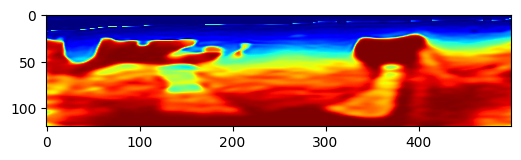

Epoch: 511 Loss:  -1.9702604413032532 model_loss:  60154.445
Epoch: 512 Loss:  -1.970724105834961 model_loss:  60250.324
Epoch: 513 Loss:  -1.967050015926361 model_loss:  59590.67
Epoch: 514 Loss:  -1.9632048606872559 model_loss:  61152.516
Epoch: 515 Loss:  -1.9712673425674438 model_loss:  59818.617
Epoch: 516 Loss:  -1.95899099111557 model_loss:  61812.293
Epoch: 517 Loss:  -1.9589152336120605 model_loss:  62576.41
Epoch: 518 Loss:  -1.9492287635803223 model_loss:  60191.957
Epoch: 519 Loss:  -1.9311457872390747 model_loss:  61900.78
Epoch: 520 Loss:  -1.933864951133728 model_loss:  62894.38


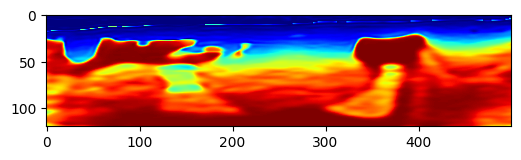

Epoch: 521 Loss:  -1.940540850162506 model_loss:  60888.86
Epoch: 522 Loss:  -1.935299575328827 model_loss:  67954.42
Epoch: 523 Loss:  -1.9072561860084534 model_loss:  75254.5
Epoch: 524 Loss:  -1.9105916619300842 model_loss:  75829.375
Epoch: 525 Loss:  -1.9121195077896118 model_loss:  78732.2
Epoch: 526 Loss:  -1.9229296445846558 model_loss:  72663.86
Epoch: 527 Loss:  -1.9057736992835999 model_loss:  73673.836
Epoch: 528 Loss:  -1.89435213804245 model_loss:  78467.305
Epoch: 529 Loss:  -1.8990293145179749 model_loss:  82617.86
Epoch: 530 Loss:  -1.9042654633522034 model_loss:  89720.59


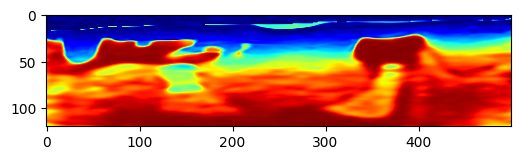

Epoch: 531 Loss:  -1.9102489948272705 model_loss:  83747.61
Epoch: 532 Loss:  -1.913942039012909 model_loss:  80102.414
Epoch: 533 Loss:  -1.9159672260284424 model_loss:  81590.79
Epoch: 534 Loss:  -1.914723515510559 model_loss:  79601.516
Epoch: 535 Loss:  -1.918839156627655 model_loss:  79418.84
Epoch: 536 Loss:  -1.9217920899391174 model_loss:  79924.836
Epoch: 537 Loss:  -1.9235301613807678 model_loss:  76116.91
Epoch: 538 Loss:  -1.9234474897384644 model_loss:  76103.68
Epoch: 539 Loss:  -1.9297879338264465 model_loss:  74605.86
Epoch: 540 Loss:  -1.9299299120903015 model_loss:  73613.44


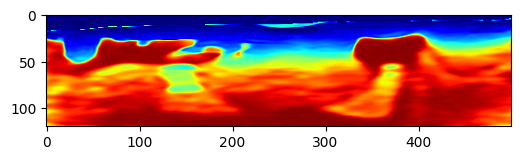

Epoch: 541 Loss:  -1.9257949590682983 model_loss:  75521.734
Epoch: 542 Loss:  -1.9260061979293823 model_loss:  71867.22
Epoch: 543 Loss:  -1.932258129119873 model_loss:  72784.74
Epoch: 544 Loss:  -1.9311658143997192 model_loss:  71592.08
Epoch: 545 Loss:  -1.9319224953651428 model_loss:  70313.49
Epoch: 546 Loss:  -1.9249467849731445 model_loss:  69318.83
Epoch: 547 Loss:  -1.9309458136558533 model_loss:  68192.766
Epoch: 548 Loss:  -1.9270018339157104 model_loss:  72193.945
Epoch: 549 Loss:  -1.9248414635658264 model_loss:  69447.99
Epoch: 550 Loss:  -1.9214317202568054 model_loss:  70768.91


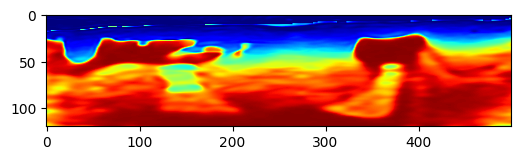

Epoch: 551 Loss:  -1.9287766218185425 model_loss:  70385.664
Epoch: 552 Loss:  -1.9298120737075806 model_loss:  68604.77
Epoch: 553 Loss:  -1.933368980884552 model_loss:  72910.19
Epoch: 554 Loss:  -1.9358962774276733 model_loss:  69462.82
Epoch: 555 Loss:  -1.9346885681152344 model_loss:  68637.53
Epoch: 556 Loss:  -1.9367194771766663 model_loss:  68883.445
Epoch: 557 Loss:  -1.937752366065979 model_loss:  68677.76
Epoch: 558 Loss:  -1.9387187957763672 model_loss:  69127.836
Epoch: 559 Loss:  -1.9344668984413147 model_loss:  67673.38
Epoch: 560 Loss:  -1.9372036457061768 model_loss:  68224.08


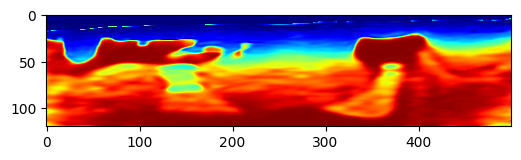

Epoch: 561 Loss:  -1.9396169185638428 model_loss:  68917.73
Epoch: 562 Loss:  -1.932928204536438 model_loss:  67266.21
Epoch: 563 Loss:  -1.93753981590271 model_loss:  68275.62
Epoch: 564 Loss:  -1.9326720237731934 model_loss:  67095.57
Epoch: 565 Loss:  -1.9299675226211548 model_loss:  69211.94
Epoch: 566 Loss:  -1.9128772020339966 model_loss:  73012.27
Epoch: 567 Loss:  -1.9186506867408752 model_loss:  71582.54
Epoch: 568 Loss:  -1.9233835935592651 model_loss:  72162.1
Epoch: 569 Loss:  -1.9298208355903625 model_loss:  70753.484
Epoch: 570 Loss:  -1.9313424825668335 model_loss:  74850.734


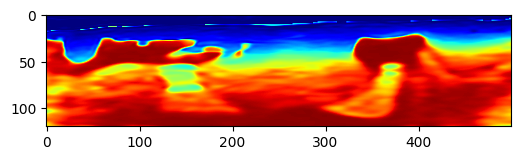

Epoch: 571 Loss:  -1.9278107285499573 model_loss:  73039.77
Epoch: 572 Loss:  -1.9230712056159973 model_loss:  69996.22
Epoch: 573 Loss:  -1.921608030796051 model_loss:  71380.445
Epoch: 574 Loss:  -1.9246209859848022 model_loss:  71132.34
Epoch: 575 Loss:  -1.9235756397247314 model_loss:  74389.57
Epoch: 576 Loss:  -1.926667332649231 model_loss:  70961.984
Epoch: 577 Loss:  -1.928089678287506 model_loss:  70761.72
Epoch: 578 Loss:  -1.9290515184402466 model_loss:  70463.1
Epoch: 579 Loss:  -1.9290494918823242 model_loss:  69570.195
Epoch: 580 Loss:  -1.9301357865333557 model_loss:  70301.9


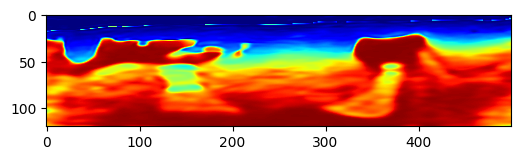

Epoch: 581 Loss:  -1.9345283508300781 model_loss:  68027.72
Epoch: 582 Loss:  -1.935982882976532 model_loss:  72372.75
Epoch: 583 Loss:  -1.927691102027893 model_loss:  72691.195
Epoch: 584 Loss:  -1.9228952527046204 model_loss:  73507.46
Epoch: 585 Loss:  -1.9102969765663147 model_loss:  73691.125
Epoch: 586 Loss:  -1.9149783849716187 model_loss:  74713.36
Epoch: 587 Loss:  -1.92032128572464 model_loss:  77120.93
Epoch: 588 Loss:  -1.9213771224021912 model_loss:  73934.6
Epoch: 589 Loss:  -1.911836862564087 model_loss:  75870.78
Epoch: 590 Loss:  -1.905117154121399 model_loss:  77720.8


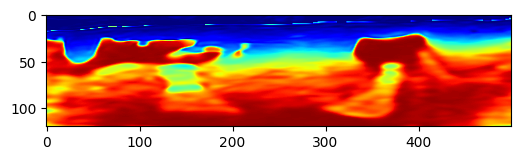

Epoch: 591 Loss:  -1.91367506980896 model_loss:  74409.234
Epoch: 592 Loss:  -1.9165510535240173 model_loss:  75437.7
Epoch: 593 Loss:  -1.9227371215820312 model_loss:  76894.24
Epoch: 594 Loss:  -1.9185903072357178 model_loss:  76792.87
Epoch: 595 Loss:  -1.9291134476661682 model_loss:  77492.79
Epoch: 596 Loss:  -1.9162024855613708 model_loss:  75751.94
Epoch: 597 Loss:  -1.9270033240318298 model_loss:  78431.93
Epoch: 598 Loss:  -1.9217889904975891 model_loss:  74697.35
Epoch: 599 Loss:  -1.916349172592163 model_loss:  74520.875
Epoch: 600 Loss:  -1.9161556363105774 model_loss:  79575.375


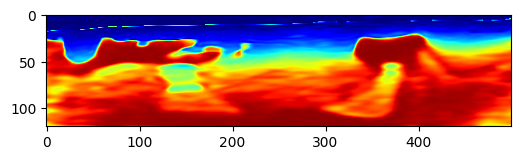

Epoch: 601 Loss:  -1.9212303161621094 model_loss:  78801.81
Epoch: 602 Loss:  -1.934195101261139 model_loss:  76742.29
Epoch: 603 Loss:  -1.9186537861824036 model_loss:  75862.17
Epoch: 604 Loss:  -1.9179788827896118 model_loss:  77233.234
Epoch: 605 Loss:  -1.9268596768379211 model_loss:  84672.55
Epoch: 606 Loss:  -1.9234923124313354 model_loss:  85734.6
Epoch: 607 Loss:  -1.929780900478363 model_loss:  79803.17
Epoch: 608 Loss:  -1.936076819896698 model_loss:  79217.414
Epoch: 609 Loss:  -1.930365800857544 model_loss:  77417.74
Epoch: 610 Loss:  -1.9223045706748962 model_loss:  77863.2


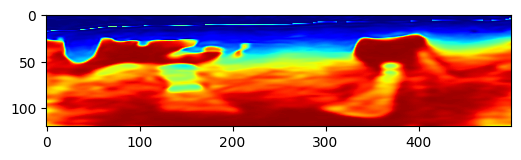

Epoch: 611 Loss:  -1.9092154502868652 model_loss:  84282.695
Epoch: 612 Loss:  -1.9129482507705688 model_loss:  87474.51
Epoch: 613 Loss:  -1.9165220856666565 model_loss:  81233.3
Epoch: 614 Loss:  -1.9272106289863586 model_loss:  79216.52
Epoch: 615 Loss:  -1.928129255771637 model_loss:  79013.2
Epoch: 616 Loss:  -1.9332945942878723 model_loss:  79784.85
Epoch: 617 Loss:  -1.9394538402557373 model_loss:  81728.93
Epoch: 618 Loss:  -1.943777322769165 model_loss:  80495.29
Epoch: 619 Loss:  -1.9470091462135315 model_loss:  79277.03
Epoch: 620 Loss:  -1.945626139640808 model_loss:  79277.24


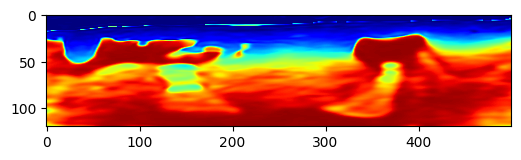

Epoch: 621 Loss:  -1.9453015327453613 model_loss:  78255.055
Epoch: 622 Loss:  -1.926045536994934 model_loss:  77601.23
Epoch: 623 Loss:  -1.91970956325531 model_loss:  79961.375
Epoch: 624 Loss:  -1.9212133288383484 model_loss:  79662.42
Epoch: 625 Loss:  -1.9311605095863342 model_loss:  77872.39
Epoch: 626 Loss:  -1.935689926147461 model_loss:  80426.39
Epoch: 627 Loss:  -1.9430832862854004 model_loss:  79157.47
Epoch: 628 Loss:  -1.9418070912361145 model_loss:  78206.734
Epoch: 629 Loss:  -1.934281051158905 model_loss:  81557.44
Epoch: 630 Loss:  -1.9094616770744324 model_loss:  83710.87


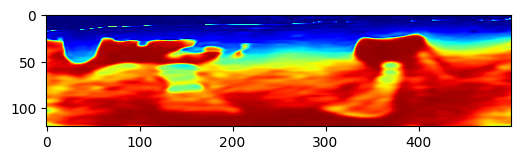

Epoch: 631 Loss:  -1.9301515221595764 model_loss:  80646.914
Epoch: 632 Loss:  -1.9280481934547424 model_loss:  78897.24
Epoch: 633 Loss:  -1.9371575713157654 model_loss:  80648.75
Epoch: 634 Loss:  -1.940624475479126 model_loss:  81225.26
Epoch: 635 Loss:  -1.9475783705711365 model_loss:  80953.86
Epoch: 636 Loss:  -1.95537930727005 model_loss:  83313.79
Epoch: 637 Loss:  -1.9607324600219727 model_loss:  82881.57
Epoch: 638 Loss:  -1.9429055452346802 model_loss:  79587.8
Epoch: 639 Loss:  -1.9442378878593445 model_loss:  77435.336
Epoch: 640 Loss:  -1.9554719924926758 model_loss:  80065.336


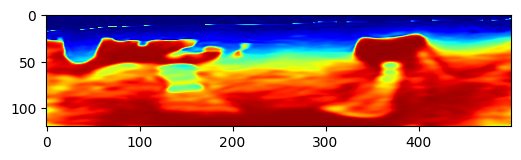

Epoch: 641 Loss:  -1.9435622096061707 model_loss:  79418.17
Epoch: 642 Loss:  -1.931317150592804 model_loss:  78091.08
Epoch: 643 Loss:  -1.940152645111084 model_loss:  80987.49
Epoch: 644 Loss:  -1.9442103505134583 model_loss:  84321.37
Epoch: 645 Loss:  -1.953797698020935 model_loss:  80346.47
Epoch: 646 Loss:  -1.9571096301078796 model_loss:  77698.68
Epoch: 647 Loss:  -1.9593020677566528 model_loss:  80058.8
Epoch: 648 Loss:  -1.9504632353782654 model_loss:  83818.26
Epoch: 649 Loss:  -1.9346864223480225 model_loss:  81970.234
Epoch: 650 Loss:  -1.935383677482605 model_loss:  81522.32


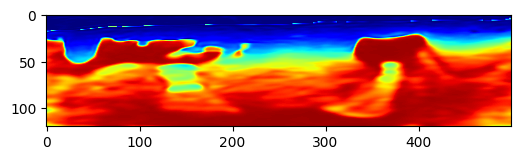

Epoch: 651 Loss:  -1.9450247883796692 model_loss:  84677.27
Epoch: 652 Loss:  -1.9474527835845947 model_loss:  82000.77
Epoch: 653 Loss:  -1.9529693722724915 model_loss:  79547.65
Epoch: 654 Loss:  -1.9647483825683594 model_loss:  83601.94
Epoch: 655 Loss:  -1.9678500294685364 model_loss:  85459.555
Epoch: 656 Loss:  -1.9739446640014648 model_loss:  81364.32
Epoch: 657 Loss:  -1.9575016498565674 model_loss:  80441.36
Epoch: 658 Loss:  -1.950631558895111 model_loss:  81117.91
Epoch: 659 Loss:  -1.9446117281913757 model_loss:  82543.33
Epoch: 660 Loss:  -1.9426023364067078 model_loss:  82272.36


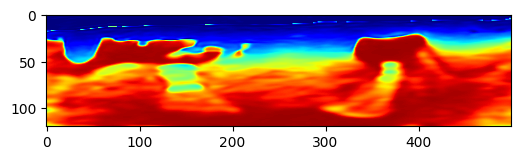

Epoch: 661 Loss:  -1.9451456665992737 model_loss:  81353.34
Epoch: 662 Loss:  -1.9503993391990662 model_loss:  83058.95
Epoch: 663 Loss:  -1.9543840885162354 model_loss:  82932.46
Epoch: 664 Loss:  -1.957655429840088 model_loss:  80780.78
Epoch: 665 Loss:  -1.9592081904411316 model_loss:  83688.17
Epoch: 666 Loss:  -1.9572096467018127 model_loss:  85797.76
Epoch: 667 Loss:  -1.9597545266151428 model_loss:  83483.16
Epoch: 668 Loss:  -1.9578173160552979 model_loss:  82136.375
Epoch: 669 Loss:  -1.9602166414260864 model_loss:  82933.695
Epoch: 670 Loss:  -1.9604511260986328 model_loss:  82375.95


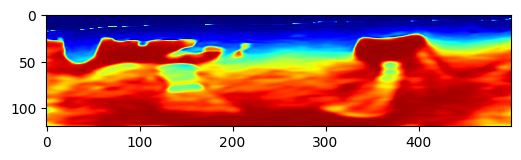

Epoch: 671 Loss:  -1.9560685753822327 model_loss:  84672.945
Epoch: 672 Loss:  -1.9531015753746033 model_loss:  85117.984
Epoch: 673 Loss:  -1.9654688239097595 model_loss:  82777.79
Epoch: 674 Loss:  -1.9697893261909485 model_loss:  82978.695
Epoch: 675 Loss:  -1.9721335768699646 model_loss:  83389.234
Epoch: 676 Loss:  -1.9718920588493347 model_loss:  84000.92
Epoch: 677 Loss:  -1.9713481664657593 model_loss:  83798.62
Epoch: 678 Loss:  -1.974119782447815 model_loss:  83533.29
Epoch: 679 Loss:  -1.974390685558319 model_loss:  83657.63
Epoch: 680 Loss:  -1.9748212099075317 model_loss:  82762.07


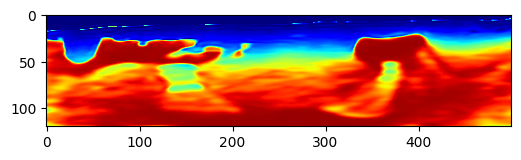

Epoch: 681 Loss:  -1.9759426712989807 model_loss:  83762.79
Epoch: 682 Loss:  -1.9755682349205017 model_loss:  84814.28
Epoch: 683 Loss:  -1.9756013751029968 model_loss:  82715.945
Epoch: 684 Loss:  -1.9758331179618835 model_loss:  82766.586
Epoch: 685 Loss:  -1.9765619039535522 model_loss:  83941.89
Epoch: 686 Loss:  -1.978606939315796 model_loss:  83023.34
Epoch: 687 Loss:  -1.9774680733680725 model_loss:  83311.43
Epoch: 688 Loss:  -1.9776135087013245 model_loss:  82995.35
Epoch: 689 Loss:  -1.9787244200706482 model_loss:  82642.24
Epoch: 690 Loss:  -1.975023627281189 model_loss:  83593.586


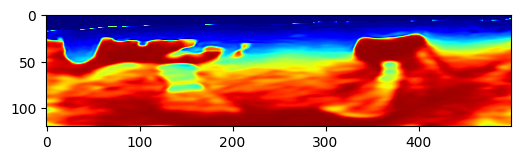

Epoch: 691 Loss:  -1.972981870174408 model_loss:  82790.31
Epoch: 692 Loss:  -1.9683182835578918 model_loss:  82930.664
Epoch: 693 Loss:  -1.9635839462280273 model_loss:  82867.266
Epoch: 694 Loss:  -1.9640785455703735 model_loss:  84228.84
Epoch: 695 Loss:  -1.9679415822029114 model_loss:  82405.86
Epoch: 696 Loss:  -1.9705322980880737 model_loss:  81796.51
Epoch: 697 Loss:  -1.974005103111267 model_loss:  84874.84
Epoch: 698 Loss:  -1.9737874269485474 model_loss:  84337.05
Epoch: 699 Loss:  -1.9724124073982239 model_loss:  82546.66
Epoch: 700 Loss:  -1.9701871871948242 model_loss:  82934.92


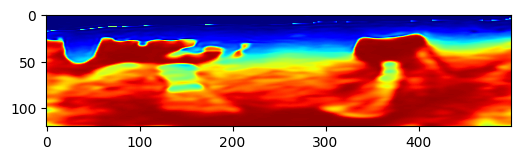

Epoch: 701 Loss:  -1.9688081741333008 model_loss:  83322.1
Epoch: 702 Loss:  -1.9681335091590881 model_loss:  85404.23
Epoch: 703 Loss:  -1.9675685167312622 model_loss:  83951.016
Epoch: 704 Loss:  -1.9669297933578491 model_loss:  82732.32
Epoch: 705 Loss:  -1.9700016975402832 model_loss:  84218.35
Epoch: 706 Loss:  -1.976219654083252 model_loss:  84027.53
Epoch: 707 Loss:  -1.9787765145301819 model_loss:  83711.16
Epoch: 708 Loss:  -1.9804639220237732 model_loss:  83758.85
Epoch: 709 Loss:  -1.981246829032898 model_loss:  83922.99
Epoch: 710 Loss:  -1.980531930923462 model_loss:  83964.35


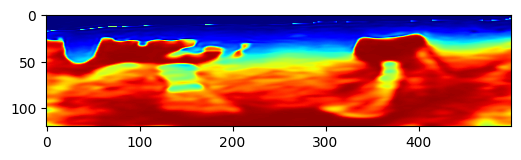

Epoch: 711 Loss:  -1.980926752090454 model_loss:  84359.36
Epoch: 712 Loss:  -1.9807367324829102 model_loss:  84057.055
Epoch: 713 Loss:  -1.9807389378547668 model_loss:  84513.08
Epoch: 714 Loss:  -1.9806016683578491 model_loss:  84265.67
Epoch: 715 Loss:  -1.9809561371803284 model_loss:  83539.35
Epoch: 716 Loss:  -1.9819573163986206 model_loss:  84123.336
Epoch: 717 Loss:  -1.9825089573860168 model_loss:  84307.7
Epoch: 718 Loss:  -1.9832292795181274 model_loss:  83545.1
Epoch: 719 Loss:  -1.9834259748458862 model_loss:  83787.914
Epoch: 720 Loss:  -1.983583152294159 model_loss:  83514.92


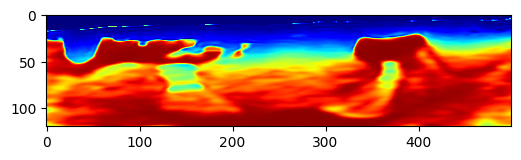

Epoch: 721 Loss:  -1.9840046763420105 model_loss:  83997.016
Epoch: 722 Loss:  -1.9841771721839905 model_loss:  83959.09
Epoch: 723 Loss:  -1.983891785144806 model_loss:  83580.35
Epoch: 724 Loss:  -1.984328806400299 model_loss:  83531.164
Epoch: 725 Loss:  -1.9839372038841248 model_loss:  83645.16
Epoch: 726 Loss:  -1.9841455817222595 model_loss:  83171.11
Epoch: 727 Loss:  -1.9840072393417358 model_loss:  83637.81
Epoch: 728 Loss:  -1.9842334389686584 model_loss:  83231.84
Epoch: 729 Loss:  -1.9843558073043823 model_loss:  83338.12
Epoch: 730 Loss:  -1.9847747683525085 model_loss:  83277.7


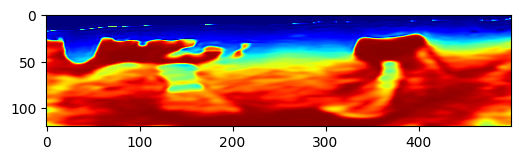

Epoch: 731 Loss:  -1.9849368929862976 model_loss:  83081.766
Epoch: 732 Loss:  -1.9851748943328857 model_loss:  83079.56
Epoch: 733 Loss:  -1.985213041305542 model_loss:  83063.6
Epoch: 734 Loss:  -1.9855291843414307 model_loss:  82828.41
Epoch: 735 Loss:  -1.985611617565155 model_loss:  83093.15
Epoch: 736 Loss:  -1.985714852809906 model_loss:  82816.766
Epoch: 737 Loss:  -1.9856538772583008 model_loss:  82777.21
Epoch: 738 Loss:  -1.985786497592926 model_loss:  82682.57
Epoch: 739 Loss:  -1.9856418371200562 model_loss:  82816.836
Epoch: 740 Loss:  -1.9858396649360657 model_loss:  82443.266


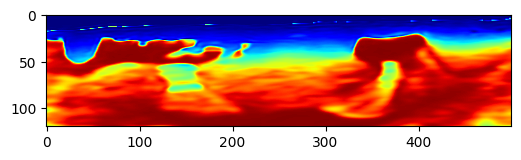

Epoch: 741 Loss:  -1.985802710056305 model_loss:  82727.555
Epoch: 742 Loss:  -1.985988438129425 model_loss:  82324.0
Epoch: 743 Loss:  -1.986031174659729 model_loss:  82367.97
Epoch: 744 Loss:  -1.9863111972808838 model_loss:  82346.445
Epoch: 745 Loss:  -1.986405611038208 model_loss:  82319.67
Epoch: 746 Loss:  -1.9866228699684143 model_loss:  82159.164
Epoch: 747 Loss:  -1.986646294593811 model_loss:  82228.36
Epoch: 748 Loss:  -1.9867085814476013 model_loss:  82037.02
Epoch: 749 Loss:  -1.9867694973945618 model_loss:  82184.99
Epoch: 750 Loss:  -1.9867129921913147 model_loss:  81891.04


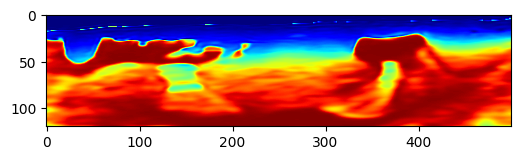

Epoch: 751 Loss:  -1.9868544936180115 model_loss:  81961.414
Epoch: 752 Loss:  -1.9865368008613586 model_loss:  81827.72
Epoch: 753 Loss:  -1.9868892431259155 model_loss:  81976.54
Epoch: 754 Loss:  -1.9865607023239136 model_loss:  81666.01
Epoch: 755 Loss:  -1.9870067834854126 model_loss:  81746.6
Epoch: 756 Loss:  -1.986628770828247 model_loss:  81620.84
Epoch: 757 Loss:  -1.987064778804779 model_loss:  81782.88
Epoch: 758 Loss:  -1.9870550036430359 model_loss:  81437.46
Epoch: 759 Loss:  -1.9868784546852112 model_loss:  81514.734
Epoch: 760 Loss:  -1.9877062439918518 model_loss:  81509.66


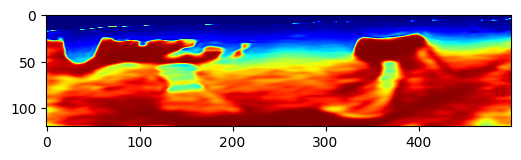

Epoch: 761 Loss:  -1.9877636432647705 model_loss:  81561.6
Epoch: 762 Loss:  -1.9880099296569824 model_loss:  81215.53
Epoch: 763 Loss:  -1.987808108329773 model_loss:  81484.19
Epoch: 764 Loss:  -1.9880074262619019 model_loss:  81211.49
Epoch: 765 Loss:  -1.987895131111145 model_loss:  81383.8
Epoch: 766 Loss:  -1.9880263209342957 model_loss:  81149.836
Epoch: 767 Loss:  -1.9879755973815918 model_loss:  81199.945
Epoch: 768 Loss:  -1.9879191517829895 model_loss:  81042.6
Epoch: 769 Loss:  -1.9880680441856384 model_loss:  81134.53
Epoch: 770 Loss:  -1.9877773523330688 model_loss:  81011.22


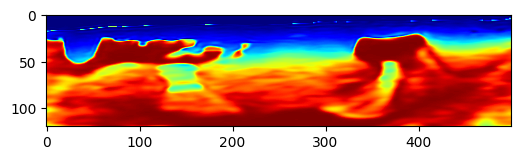

Epoch: 771 Loss:  -1.9882139563560486 model_loss:  80936.83
Epoch: 772 Loss:  -1.9876795411109924 model_loss:  80945.766
Epoch: 773 Loss:  -1.9882788062095642 model_loss:  81009.58
Epoch: 774 Loss:  -1.988226592540741 model_loss:  80844.86
Epoch: 775 Loss:  -1.9881563186645508 model_loss:  80839.05
Epoch: 776 Loss:  -1.9889246821403503 model_loss:  80853.64
Epoch: 777 Loss:  -1.9890238046646118 model_loss:  80870.33
Epoch: 778 Loss:  -1.9891688823699951 model_loss:  80671.67
Epoch: 779 Loss:  -1.989001452922821 model_loss:  80906.17
Epoch: 780 Loss:  -1.9890933632850647 model_loss:  80548.47


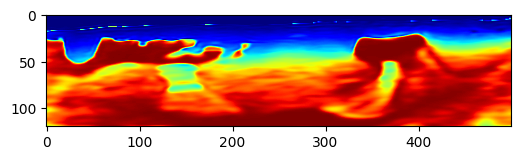

Epoch: 781 Loss:  -1.9889313578605652 model_loss:  80764.57
Epoch: 782 Loss:  -1.9887815713882446 model_loss:  80489.73
Epoch: 783 Loss:  -1.9888043999671936 model_loss:  80729.08
Epoch: 784 Loss:  -1.9887430667877197 model_loss:  80355.17
Epoch: 785 Loss:  -1.988755702972412 model_loss:  80393.38
Epoch: 786 Loss:  -1.9887493252754211 model_loss:  80394.89
Epoch: 787 Loss:  -1.9890314936637878 model_loss:  80472.71
Epoch: 788 Loss:  -1.9890100955963135 model_loss:  80166.01
Epoch: 789 Loss:  -1.9888802766799927 model_loss:  80281.65
Epoch: 790 Loss:  -1.9892324209213257 model_loss:  80204.61


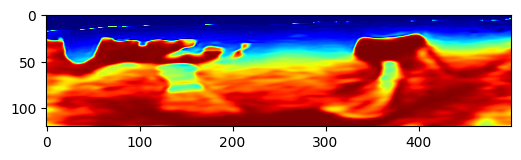

Epoch: 791 Loss:  -1.9893251657485962 model_loss:  80389.24
Epoch: 792 Loss:  -1.989384412765503 model_loss:  79936.56
Epoch: 793 Loss:  -1.9891611337661743 model_loss:  80235.35
Epoch: 794 Loss:  -1.9890110492706299 model_loss:  79876.914
Epoch: 795 Loss:  -1.9887101650238037 model_loss:  80207.62
Epoch: 796 Loss:  -1.98879873752594 model_loss:  79818.18
Epoch: 797 Loss:  -1.988478422164917 model_loss:  79892.36
Epoch: 798 Loss:  -1.9891034364700317 model_loss:  79913.54
Epoch: 799 Loss:  -1.9892555475234985 model_loss:  79682.51
Epoch: 800 Loss:  -1.9895696640014648 model_loss:  79992.5


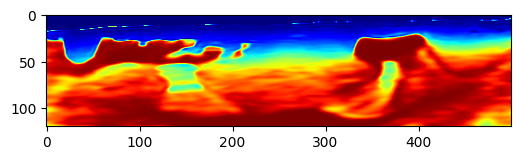

Epoch: 801 Loss:  -1.9899978041648865 model_loss:  79541.76
Epoch: 802 Loss:  -1.9905023574829102 model_loss:  80025.67
Epoch: 803 Loss:  -1.9906782507896423 model_loss:  79601.42
Epoch: 804 Loss:  -1.9904420971870422 model_loss:  79802.195
Epoch: 805 Loss:  -1.9904801845550537 model_loss:  79945.555
Epoch: 806 Loss:  -1.9906795024871826 model_loss:  79647.875
Epoch: 807 Loss:  -1.990898311138153 model_loss:  79839.66
Epoch: 808 Loss:  -1.9910489916801453 model_loss:  79574.67
Epoch: 809 Loss:  -1.991011142730713 model_loss:  79678.16
Epoch: 810 Loss:  -1.9909760355949402 model_loss:  79663.53


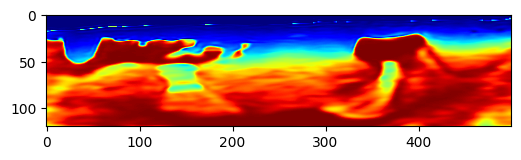

Epoch: 811 Loss:  -1.9910118579864502 model_loss:  79549.54
Epoch: 812 Loss:  -1.9910746812820435 model_loss:  79569.75
Epoch: 813 Loss:  -1.991224765777588 model_loss:  79394.8
Epoch: 814 Loss:  -1.9912644624710083 model_loss:  79487.46
Epoch: 815 Loss:  -1.991261601448059 model_loss:  79359.98
Epoch: 816 Loss:  -1.9912768006324768 model_loss:  79436.234
Epoch: 817 Loss:  -1.9913366436958313 model_loss:  79309.91
Epoch: 818 Loss:  -1.9913578629493713 model_loss:  79287.5
Epoch: 819 Loss:  -1.991454303264618 model_loss:  79261.44
Epoch: 820 Loss:  -1.9914577007293701 model_loss:  79149.96


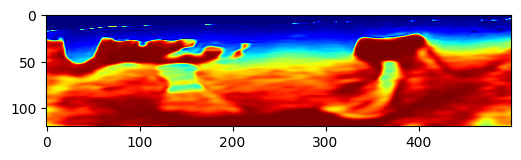

Epoch: 821 Loss:  -1.9915555119514465 model_loss:  79226.21
Epoch: 822 Loss:  -1.9915974736213684 model_loss:  79054.95
Epoch: 823 Loss:  -1.9915814995765686 model_loss:  79135.74
Epoch: 824 Loss:  -1.9916496872901917 model_loss:  79009.125
Epoch: 825 Loss:  -1.9916733503341675 model_loss:  78981.83
Epoch: 826 Loss:  -1.9917141795158386 model_loss:  78985.98
Epoch: 827 Loss:  -1.9917632341384888 model_loss:  78870.95
Epoch: 828 Loss:  -1.9917885065078735 model_loss:  78911.38
Epoch: 829 Loss:  -1.9918199181556702 model_loss:  78806.4
Epoch: 830 Loss:  -1.9918733835220337 model_loss:  78780.555


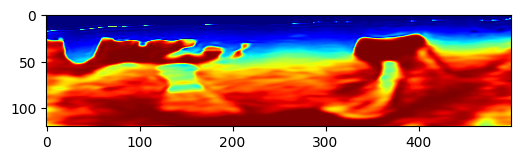

Epoch: 831 Loss:  -1.9918821454048157 model_loss:  78747.59
Epoch: 832 Loss:  -1.9919264316558838 model_loss:  78674.51
Epoch: 833 Loss:  -1.9919683933258057 model_loss:  78655.64
Epoch: 834 Loss:  -1.9919756650924683 model_loss:  78593.98
Epoch: 835 Loss:  -1.992017388343811 model_loss:  78538.24
Epoch: 836 Loss:  -1.9920527338981628 model_loss:  78517.71
Epoch: 837 Loss:  -1.9920707941055298 model_loss:  78445.234
Epoch: 838 Loss:  -1.9920997023582458 model_loss:  78414.734
Epoch: 839 Loss:  -1.9921253323554993 model_loss:  78367.96
Epoch: 840 Loss:  -1.9921684861183167 model_loss:  78290.6


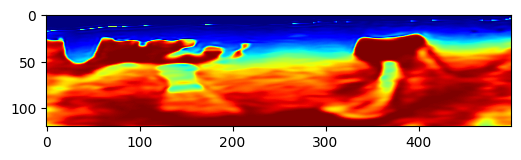

Epoch: 841 Loss:  -1.9921324253082275 model_loss:  78294.16
Epoch: 842 Loss:  -1.992192268371582 model_loss:  78175.73
Epoch: 843 Loss:  -1.9920694828033447 model_loss:  78231.57
Epoch: 844 Loss:  -1.9920711517333984 model_loss:  78010.59
Epoch: 845 Loss:  -1.9916576743125916 model_loss:  78236.45
Epoch: 846 Loss:  -1.9915524125099182 model_loss:  77785.15
Epoch: 847 Loss:  -1.9911497831344604 model_loss:  78227.05
Epoch: 848 Loss:  -1.9911252856254578 model_loss:  77658.08
Epoch: 849 Loss:  -1.9912384152412415 model_loss:  77880.25
Epoch: 850 Loss:  -1.9916335940361023 model_loss:  77875.2


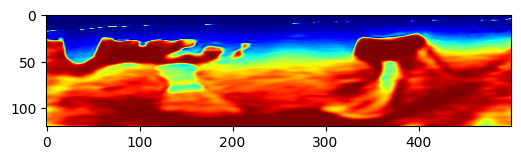

Epoch: 851 Loss:  -1.9919312000274658 model_loss:  77505.11
Epoch: 852 Loss:  -1.99226975440979 model_loss:  77905.336
Epoch: 853 Loss:  -1.9923880100250244 model_loss:  77488.164
Epoch: 854 Loss:  -1.9924370050430298 model_loss:  77682.03
Epoch: 855 Loss:  -1.9924344420433044 model_loss:  77508.8
Epoch: 856 Loss:  -1.9924020171165466 model_loss:  77616.57
Epoch: 857 Loss:  -1.9924047589302063 model_loss:  77499.266
Epoch: 858 Loss:  -1.9923794269561768 model_loss:  77576.07
Epoch: 859 Loss:  -1.9924010634422302 model_loss:  77382.71
Epoch: 860 Loss:  -1.992317795753479 model_loss:  77493.51


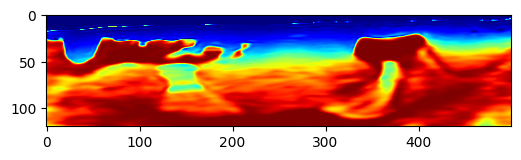

Epoch: 861 Loss:  -1.9923746585845947 model_loss:  77284.33
Epoch: 862 Loss:  -1.9922791719436646 model_loss:  77417.93
Epoch: 863 Loss:  -1.9923339486122131 model_loss:  77146.33
Epoch: 864 Loss:  -1.9922605752944946 model_loss:  77291.77
Epoch: 865 Loss:  -1.992335557937622 model_loss:  77097.95
Epoch: 866 Loss:  -1.9922789335250854 model_loss:  77141.375
Epoch: 867 Loss:  -1.9924155473709106 model_loss:  77061.87
Epoch: 868 Loss:  -1.9923840761184692 model_loss:  77055.555
Epoch: 869 Loss:  -1.9925163984298706 model_loss:  76955.72
Epoch: 870 Loss:  -1.9924857020378113 model_loss:  76996.28


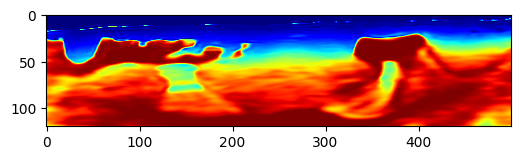

Epoch: 871 Loss:  -1.9925901889801025 model_loss:  76864.92
Epoch: 872 Loss:  -1.9925460815429688 model_loss:  76914.89
Epoch: 873 Loss:  -1.9926310181617737 model_loss:  76792.914
Epoch: 874 Loss:  -1.9925667643547058 model_loss:  76836.82
Epoch: 875 Loss:  -1.99263995885849 model_loss:  76712.99
Epoch: 876 Loss:  -1.9925538897514343 model_loss:  76762.54
Epoch: 877 Loss:  -1.9926239848136902 model_loss:  76616.125
Epoch: 878 Loss:  -1.9925262928009033 model_loss:  76677.24
Epoch: 879 Loss:  -1.9926092624664307 model_loss:  76528.375
Epoch: 880 Loss:  -1.9925193190574646 model_loss:  76584.43


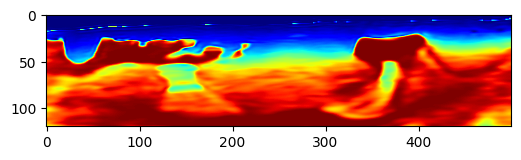

Epoch: 881 Loss:  -1.9926351308822632 model_loss:  76451.88
Epoch: 882 Loss:  -1.99257230758667 model_loss:  76489.59
Epoch: 883 Loss:  -1.9927025437355042 model_loss:  76372.13
Epoch: 884 Loss:  -1.992651879787445 model_loss:  76407.945
Epoch: 885 Loss:  -1.9927790760993958 model_loss:  76294.66
Epoch: 886 Loss:  -1.992714285850525 model_loss:  76341.37
Epoch: 887 Loss:  -1.9928337335586548 model_loss:  76210.484
Epoch: 888 Loss:  -1.9927455186843872 model_loss:  76282.01
Epoch: 889 Loss:  -1.9928449392318726 model_loss:  76111.24
Epoch: 890 Loss:  -1.9927183985710144 model_loss:  76217.21


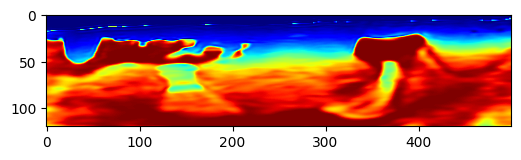

Epoch: 891 Loss:  -1.9928061962127686 model_loss:  76014.26
Epoch: 892 Loss:  -1.9926519989967346 model_loss:  76133.51
Epoch: 893 Loss:  -1.992732286453247 model_loss:  75931.39
Epoch: 894 Loss:  -1.992596983909607 model_loss:  76034.39
Epoch: 895 Loss:  -1.9926833510398865 model_loss:  75881.21
Epoch: 896 Loss:  -1.9926079511642456 model_loss:  75920.74
Epoch: 897 Loss:  -1.9927234053611755 model_loss:  75852.94
Epoch: 898 Loss:  -1.9927231073379517 model_loss:  75822.93
Epoch: 899 Loss:  -1.9928596019744873 model_loss:  75808.3
Epoch: 900 Loss:  -1.992907464504242 model_loss:  75762.96


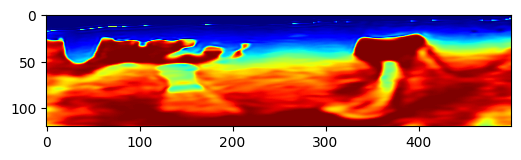

Epoch: 901 Loss:  -1.99303138256073 model_loss:  75742.19
Epoch: 902 Loss:  -1.9930803179740906 model_loss:  75729.39
Epoch: 903 Loss:  -1.9931678771972656 model_loss:  75668.97
Epoch: 904 Loss:  -1.9931888580322266 model_loss:  75697.516
Epoch: 905 Loss:  -1.993241786956787 model_loss:  75590.04
Epoch: 906 Loss:  -1.9932290315628052 model_loss:  75652.164
Epoch: 907 Loss:  -1.9932566285133362 model_loss:  75495.375
Epoch: 908 Loss:  -1.993202805519104 model_loss:  75596.38
Epoch: 909 Loss:  -1.993213713169098 model_loss:  75391.28
Epoch: 910 Loss:  -1.9931080341339111 model_loss:  75532.734


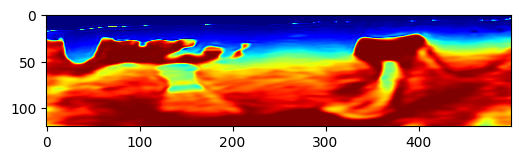

Epoch: 911 Loss:  -1.993113100528717 model_loss:  75296.36
Epoch: 912 Loss:  -1.9929736852645874 model_loss:  75448.96
Epoch: 913 Loss:  -1.9930071830749512 model_loss:  75225.02
Epoch: 914 Loss:  -1.9928982853889465 model_loss:  75338.52
Epoch: 915 Loss:  -1.9930060505867004 model_loss:  75181.2
Epoch: 916 Loss:  -1.9929713010787964 model_loss:  75227.984
Epoch: 917 Loss:  -1.993132770061493 model_loss:  75140.9
Epoch: 918 Loss:  -1.9931365847587585 model_loss:  75146.086
Epoch: 919 Loss:  -1.9932788610458374 model_loss:  75078.266
Epoch: 920 Loss:  -1.9932657480239868 model_loss:  75090.83


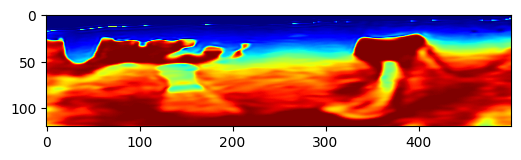

Epoch: 921 Loss:  -1.9933579564094543 model_loss:  75000.45
Epoch: 922 Loss:  -1.9932942390441895 model_loss:  75047.58
Epoch: 923 Loss:  -1.9933392405509949 model_loss:  74920.984
Epoch: 924 Loss:  -1.9932085275650024 model_loss:  74996.81
Epoch: 925 Loss:  -1.9932206869125366 model_loss:  74845.59
Epoch: 926 Loss:  -1.993044376373291 model_loss:  74918.555
Epoch: 927 Loss:  -1.993091642856598 model_loss:  74784.87
Epoch: 928 Loss:  -1.9929665327072144 model_loss:  74826.75
Epoch: 929 Loss:  -1.9931146502494812 model_loss:  74734.766
Epoch: 930 Loss:  -1.993091106414795 model_loss:  74754.37


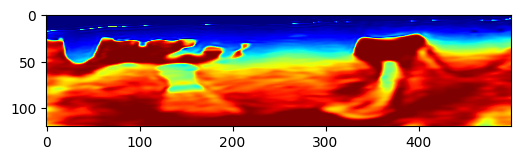

Epoch: 931 Loss:  -1.9932842254638672 model_loss:  74683.85
Epoch: 932 Loss:  -1.9932906031608582 model_loss:  74704.07
Epoch: 933 Loss:  -1.993445634841919 model_loss:  74627.05
Epoch: 934 Loss:  -1.993423044681549 model_loss:  74664.945
Epoch: 935 Loss:  -1.9935237169265747 model_loss:  74552.49
Epoch: 936 Loss:  -1.9934532046318054 model_loss:  74623.13
Epoch: 937 Loss:  -1.9935189485549927 model_loss:  74457.93
Epoch: 938 Loss:  -1.9933956265449524 model_loss:  74568.78
Epoch: 939 Loss:  -1.9934453964233398 model_loss:  74360.68
Epoch: 940 Loss:  -1.9932887554168701 model_loss:  74494.23


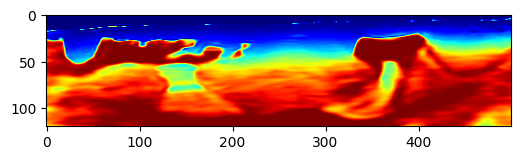

Epoch: 941 Loss:  -1.9933525919914246 model_loss:  74281.81
Epoch: 942 Loss:  -1.9932188391685486 model_loss:  74399.8
Epoch: 943 Loss:  -1.9933363795280457 model_loss:  74226.79
Epoch: 944 Loss:  -1.9932776093482971 model_loss:  74299.34
Epoch: 945 Loss:  -1.9934310913085938 model_loss:  74184.47
Epoch: 946 Loss:  -1.9934160709381104 model_loss:  74213.19
Epoch: 947 Loss:  -1.993540108203888 model_loss:  74137.28
Epoch: 948 Loss:  -1.9935187697410583 model_loss:  74149.516
Epoch: 949 Loss:  -1.9935771822929382 model_loss:  74076.95
Epoch: 950 Loss:  -1.9935312271118164 model_loss:  74105.03


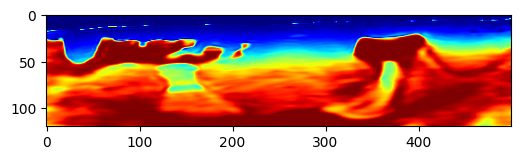

Epoch: 951 Loss:  -1.9935453534126282 model_loss:  74018.56
Epoch: 952 Loss:  -1.9934957027435303 model_loss:  74065.8
Epoch: 953 Loss:  -1.9935168623924255 model_loss:  73967.734
Epoch: 954 Loss:  -1.9934961795806885 model_loss:  74022.945
Epoch: 955 Loss:  -1.9935551285743713 model_loss:  73913.24
Epoch: 956 Loss:  -1.9935619831085205 model_loss:  73975.414
Epoch: 957 Loss:  -1.9936376214027405 model_loss:  73850.83
Epoch: 958 Loss:  -1.9936434626579285 model_loss:  73924.836
Epoch: 959 Loss:  -1.9937066435813904 model_loss:  73783.73
Epoch: 960 Loss:  -1.993691861629486 model_loss:  73869.02


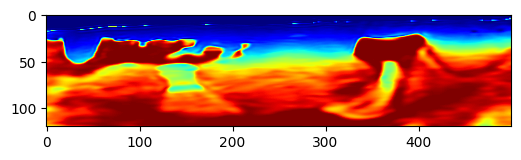

Epoch: 961 Loss:  -1.9937397837638855 model_loss:  73717.09
Epoch: 962 Loss:  -1.9937013387680054 model_loss:  73805.39
Epoch: 963 Loss:  -1.9937441945075989 model_loss:  73652.234
Epoch: 964 Loss:  -1.9936860799789429 model_loss:  73738.76
Epoch: 965 Loss:  -1.993733525276184 model_loss:  73587.51
Epoch: 966 Loss:  -1.9936608672142029 model_loss:  73671.77
Epoch: 967 Loss:  -1.9937188625335693 model_loss:  73524.96
Epoch: 968 Loss:  -1.9936408400535583 model_loss:  73605.195
Epoch: 969 Loss:  -1.9937114715576172 model_loss:  73466.08
Epoch: 970 Loss:  -1.9936336874961853 model_loss:  73537.555


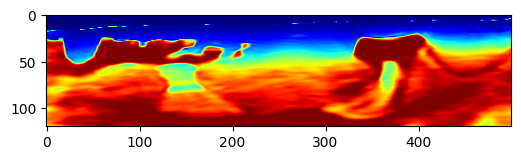

Epoch: 971 Loss:  -1.9937125444412231 model_loss:  73412.88
Epoch: 972 Loss:  -1.9936294555664062 model_loss:  73466.62
Epoch: 973 Loss:  -1.9937030673027039 model_loss:  73364.164
Epoch: 974 Loss:  -1.993600308895111 model_loss:  73392.91
Epoch: 975 Loss:  -1.9936673641204834 model_loss:  73323.23
Epoch: 976 Loss:  -1.9935534596443176 model_loss:  73320.66
Epoch: 977 Loss:  -1.993643581867218 model_loss:  73286.59
Epoch: 978 Loss:  -1.9935717582702637 model_loss:  73266.234
Epoch: 979 Loss:  -1.9937057495117188 model_loss:  73238.88
Epoch: 980 Loss:  -1.9936931133270264 model_loss:  73232.81


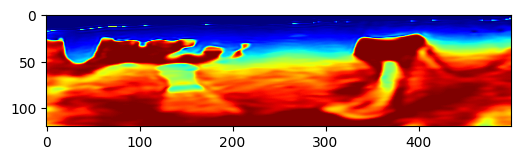

Epoch: 981 Loss:  -1.9938359260559082 model_loss:  73177.67
Epoch: 982 Loss:  -1.9938311576843262 model_loss:  73202.11
Epoch: 983 Loss:  -1.993940830230713 model_loss:  73113.67
Epoch: 984 Loss:  -1.9939086437225342 model_loss:  73165.53
Epoch: 985 Loss:  -1.993977129459381 model_loss:  73036.97
Epoch: 986 Loss:  -1.9939014315605164 model_loss:  73123.36
Epoch: 987 Loss:  -1.993945837020874 model_loss:  72948.305
Epoch: 988 Loss:  -1.9938259720802307 model_loss:  73065.92
Epoch: 989 Loss:  -1.9938615560531616 model_loss:  72866.766
Epoch: 990 Loss:  -1.9937167763710022 model_loss:  72989.26


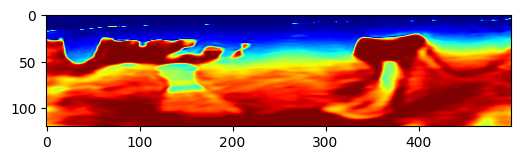

Epoch: 991 Loss:  -1.9937783479690552 model_loss:  72804.47
Epoch: 992 Loss:  -1.9936538338661194 model_loss:  72901.03
Epoch: 993 Loss:  -1.9937658309936523 model_loss:  72755.29
Epoch: 994 Loss:  -1.9937049746513367 model_loss:  72823.65
Epoch: 995 Loss:  -1.9938505291938782 model_loss:  72702.39
Epoch: 996 Loss:  -1.9938342571258545 model_loss:  72762.29
Epoch: 997 Loss:  -1.9939671158790588 model_loss:  72648.54
Epoch: 998 Loss:  -1.9939560890197754 model_loss:  72706.65
Epoch: 999 Loss:  -1.9940443634986877 model_loss:  72586.26
Epoch: 1000 Loss:  -1.9940251111984253 model_loss:  72545.19


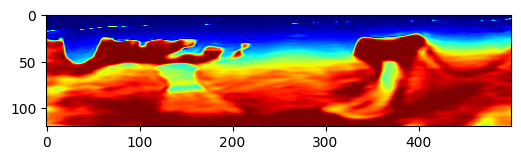

Epoch: 1001 Loss:  -1.9941792488098145 model_loss:  72777.35
Epoch: 1002 Loss:  -1.9942936301231384 model_loss:  72390.29
Epoch: 1003 Loss:  -1.99431312084198 model_loss:  72654.52
Epoch: 1004 Loss:  -1.9942439794540405 model_loss:  72513.92
Epoch: 1005 Loss:  -1.9942615032196045 model_loss:  72457.22
Epoch: 1006 Loss:  -1.9943148493766785 model_loss:  72587.4
Epoch: 1007 Loss:  -1.9943799376487732 model_loss:  72372.07
Epoch: 1008 Loss:  -1.9943686127662659 model_loss:  72501.52
Epoch: 1009 Loss:  -1.9943493604660034 model_loss:  72419.31
Epoch: 1010 Loss:  -1.994360089302063 model_loss:  72358.875


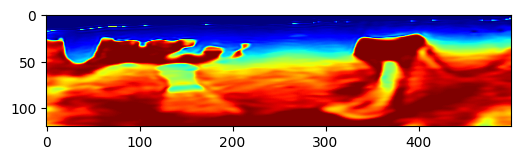

Epoch: 1011 Loss:  -1.994364619255066 model_loss:  72423.086
Epoch: 1012 Loss:  -1.9944152235984802 model_loss:  72292.44
Epoch: 1013 Loss:  -1.994409203529358 model_loss:  72342.875
Epoch: 1014 Loss:  -1.994421899318695 model_loss:  72286.19
Epoch: 1015 Loss:  -1.9944175481796265 model_loss:  72248.45
Epoch: 1016 Loss:  -1.9944066405296326 model_loss:  72275.625
Epoch: 1017 Loss:  -1.9944352507591248 model_loss:  72183.96
Epoch: 1018 Loss:  -1.9944302439689636 model_loss:  72212.62
Epoch: 1019 Loss:  -1.994460940361023 model_loss:  72165.17
Epoch: 1020 Loss:  -1.99446040391922 model_loss:  72130.2


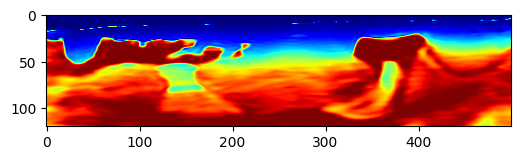

Epoch: 1021 Loss:  -1.9944517016410828 model_loss:  72137.18
Epoch: 1022 Loss:  -1.9944608211517334 model_loss:  72068.88
Epoch: 1023 Loss:  -1.994445025920868 model_loss:  72082.75
Epoch: 1024 Loss:  -1.9944747686386108 model_loss:  72029.19
Epoch: 1025 Loss:  -1.9944815635681152 model_loss:  72012.734
Epoch: 1026 Loss:  -1.99448961019516 model_loss:  71997.12
Epoch: 1027 Loss:  -1.9944995045661926 model_loss:  71938.92
Epoch: 1028 Loss:  -1.9944739937782288 model_loss:  71950.49
Epoch: 1029 Loss:  -1.9944908022880554 model_loss:  71885.26
Epoch: 1030 Loss:  -1.9944865107536316 model_loss:  71884.02


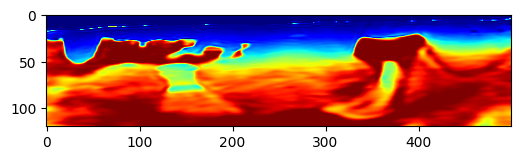

Epoch: 1031 Loss:  -1.9945043921470642 model_loss:  71848.055
Epoch: 1032 Loss:  -1.9945263266563416 model_loss:  71808.055
Epoch: 1033 Loss:  -1.994508147239685 model_loss:  71809.94
Epoch: 1034 Loss:  -1.9945305585861206 model_loss:  71741.35
Epoch: 1035 Loss:  -1.9945079684257507 model_loss:  71753.89
Epoch: 1036 Loss:  -1.9945268034934998 model_loss:  71692.95
Epoch: 1037 Loss:  -1.994537889957428 model_loss:  71680.2
Epoch: 1038 Loss:  -1.9945300817489624 model_loss:  71656.625
Epoch: 1039 Loss:  -1.9945611953735352 model_loss:  71605.73
Epoch: 1040 Loss:  -1.9945359826087952 model_loss:  71613.125


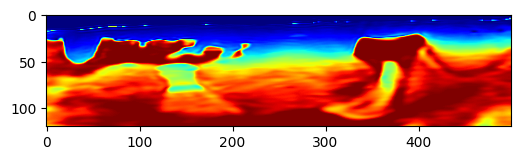

Epoch: 1041 Loss:  -1.9945674538612366 model_loss:  71544.14
Epoch: 1042 Loss:  -1.9945593476295471 model_loss:  71550.99
Epoch: 1043 Loss:  -1.994567096233368 model_loss:  71495.59
Epoch: 1044 Loss:  -1.9945802092552185 model_loss:  71478.39
Epoch: 1045 Loss:  -1.9945692420005798 model_loss:  71450.74
Epoch: 1046 Loss:  -1.9945884346961975 model_loss:  71411.96
Epoch: 1047 Loss:  -1.9945871233940125 model_loss:  71394.26
Epoch: 1048 Loss:  -1.9945905208587646 model_loss:  71354.12
Epoch: 1049 Loss:  -1.9946039319038391 model_loss:  71329.01
Epoch: 1050 Loss:  -1.9945926666259766 model_loss:  71299.26


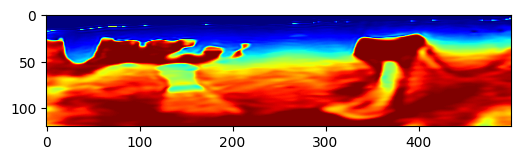

Epoch: 1051 Loss:  -1.9946107864379883 model_loss:  71266.56
Epoch: 1052 Loss:  -1.9945977926254272 model_loss:  71240.43
Epoch: 1053 Loss:  -1.994609534740448 model_loss:  71207.28
Epoch: 1054 Loss:  -1.9945861101150513 model_loss:  71179.05
Epoch: 1055 Loss:  -1.9945977330207825 model_loss:  71143.68
Epoch: 1056 Loss:  -1.9945403337478638 model_loss:  71125.375
Epoch: 1057 Loss:  -1.9945538640022278 model_loss:  71068.69
Epoch: 1058 Loss:  -1.9944717288017273 model_loss:  71086.08
Epoch: 1059 Loss:  -1.9945003390312195 model_loss:  70976.84
Epoch: 1060 Loss:  -1.9944822788238525 model_loss:  71058.05


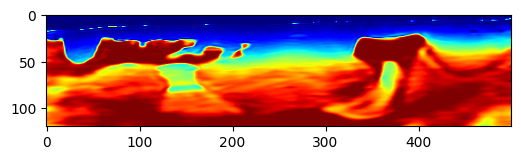

Epoch: 1061 Loss:  -1.994540274143219 model_loss:  70885.57
Epoch: 1062 Loss:  -1.9945439100265503 model_loss:  70991.24
Epoch: 1063 Loss:  -1.9945616126060486 model_loss:  70846.37
Epoch: 1064 Loss:  -1.9945482015609741 model_loss:  70867.34
Epoch: 1065 Loss:  -1.9945414066314697 model_loss:  70826.71
Epoch: 1066 Loss:  -1.9945846199989319 model_loss:  70767.945
Epoch: 1067 Loss:  -1.9945815205574036 model_loss:  70787.336
Epoch: 1068 Loss:  -1.994637906551361 model_loss:  70709.125
Epoch: 1069 Loss:  -1.99462890625 model_loss:  70735.15
Epoch: 1070 Loss:  -1.9946478605270386 model_loss:  70668.85


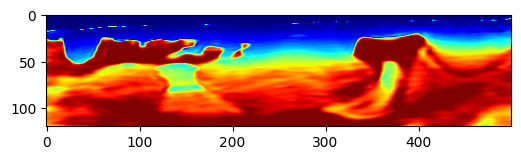

Epoch: 1071 Loss:  -1.9946585297584534 model_loss:  70658.78
Epoch: 1072 Loss:  -1.9946529269218445 model_loss:  70640.99
Epoch: 1073 Loss:  -1.994671106338501 model_loss:  70579.26
Epoch: 1074 Loss:  -1.9946748614311218 model_loss:  70599.586
Epoch: 1075 Loss:  -1.9946714043617249 model_loss:  70512.8
Epoch: 1076 Loss:  -1.9946856498718262 model_loss:  70537.484
Epoch: 1077 Loss:  -1.9946715831756592 model_loss:  70447.89
Epoch: 1078 Loss:  -1.9946816563606262 model_loss:  70468.88
Epoch: 1079 Loss:  -1.9946731328964233 model_loss:  70381.164
Epoch: 1080 Loss:  -1.9946751594543457 model_loss:  70409.41


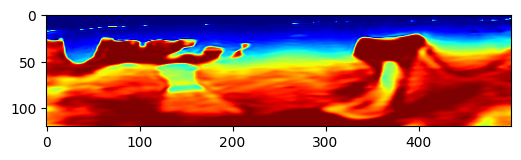

Epoch: 1081 Loss:  -1.9946641325950623 model_loss:  70307.86
Epoch: 1082 Loss:  -1.9946644306182861 model_loss:  70353.74
Epoch: 1083 Loss:  -1.99464350938797 model_loss:  70226.26
Epoch: 1084 Loss:  -1.9946353435516357 model_loss:  70292.67
Epoch: 1085 Loss:  -1.994611918926239 model_loss:  70151.086
Epoch: 1086 Loss:  -1.994593322277069 model_loss:  70222.45
Epoch: 1087 Loss:  -1.99457186460495 model_loss:  70088.72
Epoch: 1088 Loss:  -1.99455726146698 model_loss:  70143.93
Epoch: 1089 Loss:  -1.9945423603057861 model_loss:  70030.21
Epoch: 1090 Loss:  -1.9945395588874817 model_loss:  70064.96


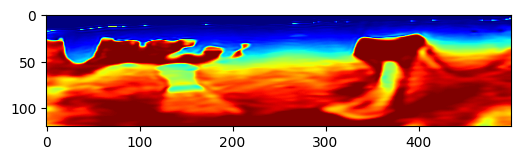

Epoch: 1091 Loss:  -1.9945395588874817 model_loss:  69975.14
Epoch: 1092 Loss:  -1.9945438504219055 model_loss:  69991.17
Epoch: 1093 Loss:  -1.9945570826530457 model_loss:  69919.87
Epoch: 1094 Loss:  -1.9945645332336426 model_loss:  69928.96
Epoch: 1095 Loss:  -1.9945817589759827 model_loss:  69859.55
Epoch: 1096 Loss:  -1.994589388370514 model_loss:  69876.48
Epoch: 1097 Loss:  -1.9946060180664062 model_loss:  69792.69
Epoch: 1098 Loss:  -1.9946115612983704 model_loss:  69821.62
Epoch: 1099 Loss:  -1.9946240782737732 model_loss:  69725.81
Epoch: 1100 Loss:  -1.994629442691803 model_loss:  69759.32


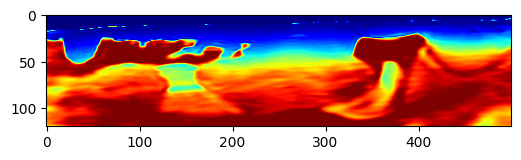

Epoch: 1101 Loss:  -1.9946346282958984 model_loss:  69661.86
Epoch: 1102 Loss:  -1.9946417808532715 model_loss:  69692.5
Epoch: 1103 Loss:  -1.9946404695510864 model_loss:  69599.4
Epoch: 1104 Loss:  -1.994650423526764 model_loss:  69625.73
Epoch: 1105 Loss:  -1.994644284248352 model_loss:  69538.62
Epoch: 1106 Loss:  -1.994657278060913 model_loss:  69560.9
Epoch: 1107 Loss:  -1.9946460723876953 model_loss:  69478.45
Epoch: 1108 Loss:  -1.9946605563163757 model_loss:  69499.234
Epoch: 1109 Loss:  -1.9946438074111938 model_loss:  69417.59
Epoch: 1110 Loss:  -1.9946584105491638 model_loss:  69440.67


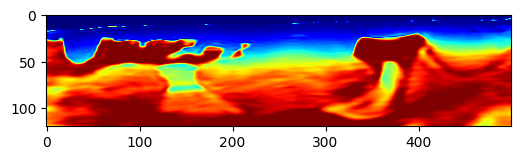

Epoch: 1111 Loss:  -1.994636356830597 model_loss:  69356.16
Epoch: 1112 Loss:  -1.9946529269218445 model_loss:  69381.87
Epoch: 1113 Loss:  -1.994626760482788 model_loss:  69294.86
Epoch: 1114 Loss:  -1.9946469068527222 model_loss:  69321.19
Epoch: 1115 Loss:  -1.9946200251579285 model_loss:  69234.31
Epoch: 1116 Loss:  -1.9946454763412476 model_loss:  69259.26
Epoch: 1117 Loss:  -1.9946191310882568 model_loss:  69173.555
Epoch: 1118 Loss:  -1.9946502447128296 model_loss:  69197.125
Epoch: 1119 Loss:  -1.994624674320221 model_loss:  69112.09
Epoch: 1120 Loss:  -1.9946594834327698 model_loss:  69135.445


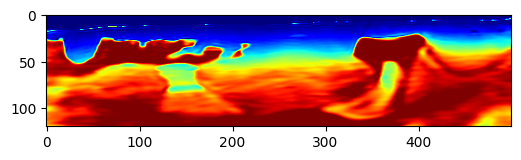

Epoch: 1121 Loss:  -1.9946329593658447 model_loss:  69049.66
Epoch: 1122 Loss:  -1.9946695566177368 model_loss:  69073.85
Epoch: 1123 Loss:  -1.9946388602256775 model_loss:  68985.87
Epoch: 1124 Loss:  -1.994676947593689 model_loss:  69012.08
Epoch: 1125 Loss:  -1.9946388602256775 model_loss:  68921.29
Epoch: 1126 Loss:  -1.9946780800819397 model_loss:  68949.164
Epoch: 1127 Loss:  -1.994626760482788 model_loss:  68857.46
Epoch: 1128 Loss:  -1.9946668148040771 model_loss:  68883.46
Epoch: 1129 Loss:  -1.994592308998108 model_loss:  68796.664
Epoch: 1130 Loss:  -1.994629442691803 model_loss:  68811.36


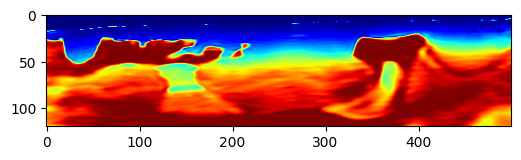

Epoch: 1131 Loss:  -1.9945319890975952 model_loss:  68745.21
Epoch: 1132 Loss:  -1.9945746064186096 model_loss:  68723.44
Epoch: 1133 Loss:  -1.9945120215415955 model_loss:  68715.57
Epoch: 1134 Loss:  -1.9946011900901794 model_loss:  68617.55
Epoch: 1135 Loss:  -1.994598150253296 model_loss:  68700.055
Epoch: 1136 Loss:  -1.9947025179862976 model_loss:  68531.8
Epoch: 1137 Loss:  -1.9946749806404114 model_loss:  68661.21
Epoch: 1138 Loss:  -1.9947030544281006 model_loss:  68464.63
Epoch: 1139 Loss:  -1.9946451783180237 model_loss:  68612.44
Epoch: 1140 Loss:  -1.9946244359016418 model_loss:  68372.31


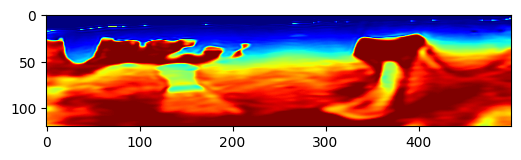

Epoch: 1141 Loss:  -1.9945253133773804 model_loss:  68552.16
Epoch: 1142 Loss:  -1.994500994682312 model_loss:  68298.8
Epoch: 1143 Loss:  -1.9943830966949463 model_loss:  68436.4
Epoch: 1144 Loss:  -1.9943836331367493 model_loss:  68264.86
Epoch: 1145 Loss:  -1.9942868947982788 model_loss:  68318.47
Epoch: 1146 Loss:  -1.9943657517433167 model_loss:  68229.25
Epoch: 1147 Loss:  -1.994327425956726 model_loss:  68238.85
Epoch: 1148 Loss:  -1.9944607615470886 model_loss:  68179.81
Epoch: 1149 Loss:  -1.9944832921028137 model_loss:  68184.31
Epoch: 1150 Loss:  -1.9945901036262512 model_loss:  68120.89


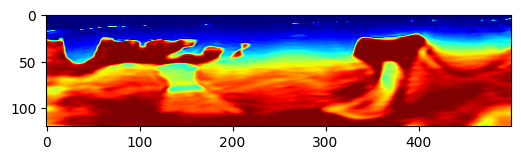

Epoch: 1151 Loss:  -1.994606852531433 model_loss:  68137.31
Epoch: 1152 Loss:  -1.9946749806404114 model_loss:  68063.14
Epoch: 1153 Loss:  -1.9946731328964233 model_loss:  68091.12
Epoch: 1154 Loss:  -1.9946997165679932 model_loss:  67999.82
Epoch: 1155 Loss:  -1.9946860671043396 model_loss:  68037.77
Epoch: 1156 Loss:  -1.9947012066841125 model_loss:  67918.95
Epoch: 1157 Loss:  -1.9946665167808533 model_loss:  67968.43
Epoch: 1158 Loss:  -1.9946774244308472 model_loss:  67851.2
Epoch: 1159 Loss:  -1.9946333169937134 model_loss:  67892.6
Epoch: 1160 Loss:  -1.994645595550537 model_loss:  67782.04


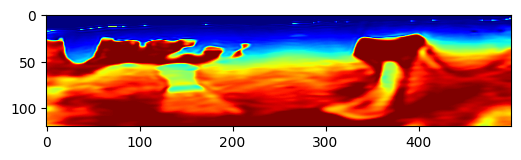

Epoch: 1161 Loss:  -1.9945840239524841 model_loss:  67824.664
Epoch: 1162 Loss:  -1.9946098923683167 model_loss:  67718.96
Epoch: 1163 Loss:  -1.99454665184021 model_loss:  67751.99
Epoch: 1164 Loss:  -1.994584858417511 model_loss:  67664.266
Epoch: 1165 Loss:  -1.9945307970046997 model_loss:  67679.945
Epoch: 1166 Loss:  -1.9945923686027527 model_loss:  67614.914
Epoch: 1167 Loss:  -1.9945491552352905 model_loss:  67616.18
Epoch: 1168 Loss:  -1.994620442390442 model_loss:  67570.86
Epoch: 1169 Loss:  -1.9945876002311707 model_loss:  67555.43
Epoch: 1170 Loss:  -1.9946552515029907 model_loss:  67518.625


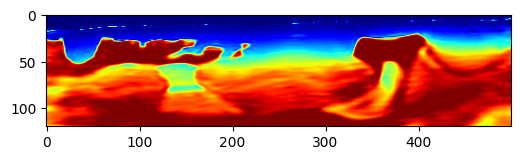

Epoch: 1171 Loss:  -1.9946194887161255 model_loss:  67499.43
Epoch: 1172 Loss:  -1.9946818351745605 model_loss:  67468.24
Epoch: 1173 Loss:  -1.9946430921554565 model_loss:  67444.07
Epoch: 1174 Loss:  -1.994698166847229 model_loss:  67418.445
Epoch: 1175 Loss:  -1.9946562051773071 model_loss:  67390.21
Epoch: 1176 Loss:  -1.9947116374969482 model_loss:  67362.03
Epoch: 1177 Loss:  -1.994663953781128 model_loss:  67336.48
Epoch: 1178 Loss:  -1.9947200417518616 model_loss:  67304.83
Epoch: 1179 Loss:  -1.9946712255477905 model_loss:  67280.16
Epoch: 1180 Loss:  -1.9947285056114197 model_loss:  67244.03


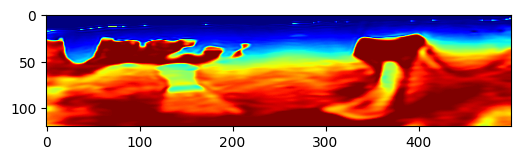

Epoch: 1181 Loss:  -1.994677722454071 model_loss:  67227.33
Epoch: 1182 Loss:  -1.994737684726715 model_loss:  67182.45
Epoch: 1183 Loss:  -1.9946869015693665 model_loss:  67175.52
Epoch: 1184 Loss:  -1.9947449564933777 model_loss:  67119.164
Epoch: 1185 Loss:  -1.9946928024291992 model_loss:  67126.76
Epoch: 1186 Loss:  -1.9947490096092224 model_loss:  67050.58
Epoch: 1187 Loss:  -1.99469393491745 model_loss:  67081.78
Epoch: 1188 Loss:  -1.9947438836097717 model_loss:  66975.04
Epoch: 1189 Loss:  -1.994683027267456 model_loss:  67041.15
Epoch: 1190 Loss:  -1.99472314119339 model_loss:  66888.27


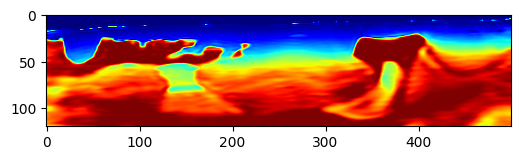

Epoch: 1191 Loss:  -1.994649350643158 model_loss:  67002.16
Epoch: 1192 Loss:  -1.9946717619895935 model_loss:  66796.086
Epoch: 1193 Loss:  -1.994578778743744 model_loss:  66948.36
Epoch: 1194 Loss:  -1.9945863485336304 model_loss:  66716.42
Epoch: 1195 Loss:  -1.9944852590560913 model_loss:  66865.2
Epoch: 1196 Loss:  -1.9945054650306702 model_loss:  66663.31
Epoch: 1197 Loss:  -1.994435966014862 model_loss:  66770.09
Epoch: 1198 Loss:  -1.9944931268692017 model_loss:  66624.82
Epoch: 1199 Loss:  -1.9944738745689392 model_loss:  66686.74
Epoch: 1200 Loss:  -1.994541347026825 model_loss:  66708.76


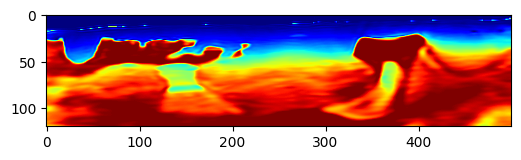

Epoch: 1201 Loss:  -1.9947149157524109 model_loss:  66401.195
Epoch: 1202 Loss:  -1.9948802590370178 model_loss:  66805.945
Epoch: 1203 Loss:  -1.9948935508728027 model_loss:  66476.74
Epoch: 1204 Loss:  -1.9948109984397888 model_loss:  66573.96
Epoch: 1205 Loss:  -1.9948418736457825 model_loss:  66594.875
Epoch: 1206 Loss:  -1.9949017763137817 model_loss:  66437.46
Epoch: 1207 Loss:  -1.9949286580085754 model_loss:  66594.23
Epoch: 1208 Loss:  -1.9948937892913818 model_loss:  66450.52
Epoch: 1209 Loss:  -1.994908332824707 model_loss:  66466.27
Epoch: 1210 Loss:  -1.994918942451477 model_loss:  66477.61


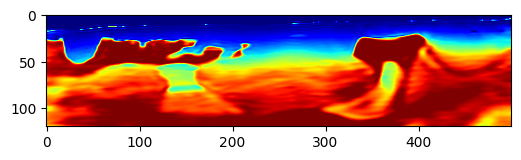

Epoch: 1211 Loss:  -1.994966983795166 model_loss:  66374.734
Epoch: 1212 Loss:  -1.9949635863304138 model_loss:  66415.086
Epoch: 1213 Loss:  -1.9949180483818054 model_loss:  66360.31
Epoch: 1214 Loss:  -1.9949322938919067 model_loss:  66327.45
Epoch: 1215 Loss:  -1.9949098825454712 model_loss:  66351.82
Epoch: 1216 Loss:  -1.994975984096527 model_loss:  66269.336
Epoch: 1217 Loss:  -1.9949752688407898 model_loss:  66286.78
Epoch: 1218 Loss:  -1.9949654340744019 model_loss:  66256.195
Epoch: 1219 Loss:  -1.9949689507484436 model_loss:  66195.92
Epoch: 1220 Loss:  -1.994917631149292 model_loss:  66241.5


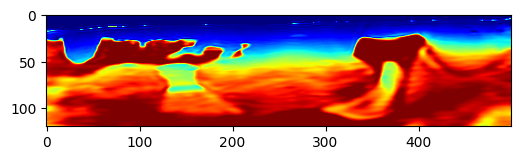

Epoch: 1221 Loss:  -1.9949634671211243 model_loss:  66140.67
Epoch: 1222 Loss:  -1.9949496388435364 model_loss:  66173.37
Epoch: 1223 Loss:  -1.9949854612350464 model_loss:  66126.625
Epoch: 1224 Loss:  -1.994995653629303 model_loss:  66085.12
Epoch: 1225 Loss:  -1.9949554204940796 model_loss:  66108.734
Epoch: 1226 Loss:  -1.9949833750724792 model_loss:  66010.64
Epoch: 1227 Loss:  -1.9949408769607544 model_loss:  66067.86
Epoch: 1228 Loss:  -1.9949834942817688 model_loss:  65975.44
Epoch: 1229 Loss:  -1.994985818862915 model_loss:  65990.945
Epoch: 1230 Loss:  -1.9949809908866882 model_loss:  65965.8


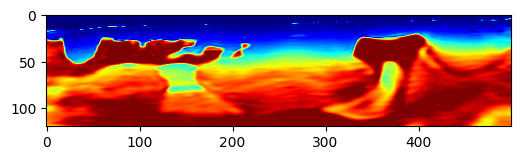

Epoch: 1231 Loss:  -1.9950072765350342 model_loss:  65905.664
Epoch: 1232 Loss:  -1.9949620366096497 model_loss:  65942.56
Epoch: 1233 Loss:  -1.9950017929077148 model_loss:  65844.24
Epoch: 1234 Loss:  -1.994984745979309 model_loss:  65887.62
Epoch: 1235 Loss:  -1.994998812675476 model_loss:  65811.83
Epoch: 1236 Loss:  -1.9950161576271057 model_loss:  65808.27
Epoch: 1237 Loss:  -1.994982659816742 model_loss:  65791.234
Epoch: 1238 Loss:  -1.9950175285339355 model_loss:  65736.266
Epoch: 1239 Loss:  -1.9949960112571716 model_loss:  65751.805
Epoch: 1240 Loss:  -1.9950177669525146 model_loss:  65684.875


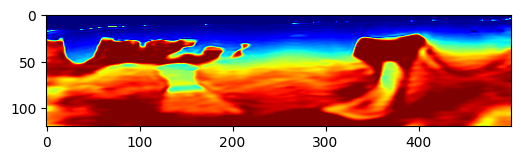

Epoch: 1241 Loss:  -1.9950270652770996 model_loss:  65691.06
Epoch: 1242 Loss:  -1.9950065612792969 model_loss:  65646.41
Epoch: 1243 Loss:  -1.9950302839279175 model_loss:  65627.63
Epoch: 1244 Loss:  -1.9950125217437744 model_loss:  65603.625
Epoch: 1245 Loss:  -1.9950249791145325 model_loss:  65573.766
Epoch: 1246 Loss:  -1.9950329661369324 model_loss:  65547.766
Epoch: 1247 Loss:  -1.995017647743225 model_loss:  65525.766
Epoch: 1248 Loss:  -1.9950363636016846 model_loss:  65493.246
Epoch: 1249 Loss:  -1.9950276017189026 model_loss:  65472.99
Epoch: 1250 Loss:  -1.9950299263000488 model_loss:  65447.08


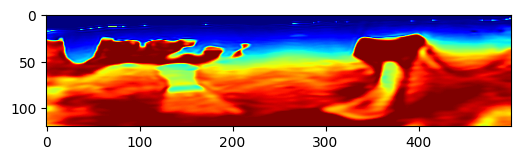

Epoch: 1251 Loss:  -1.9950419664382935 model_loss:  65413.605
Epoch: 1252 Loss:  -1.99502694606781 model_loss:  65400.84
Epoch: 1253 Loss:  -1.9950435757637024 model_loss:  65360.277
Epoch: 1254 Loss:  -1.9950385093688965 model_loss:  65345.758
Epoch: 1255 Loss:  -1.9950379729270935 model_loss:  65315.207
Epoch: 1256 Loss:  -1.995046854019165 model_loss:  65285.88
Epoch: 1257 Loss:  -1.9950401782989502 model_loss:  65268.684
Epoch: 1258 Loss:  -1.9950460195541382 model_loss:  65232.56
Epoch: 1259 Loss:  -1.995048999786377 model_loss:  65214.477
Epoch: 1260 Loss:  -1.9950445890426636 model_loss:  65184.812


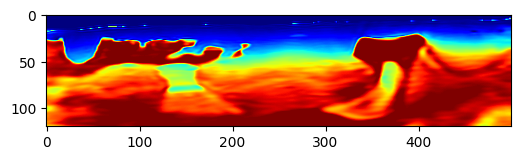

Epoch: 1261 Loss:  -1.9950509071350098 model_loss:  65157.7
Epoch: 1262 Loss:  -1.9950512051582336 model_loss:  65134.285
Epoch: 1263 Loss:  -1.995049238204956 model_loss:  65104.8
Epoch: 1264 Loss:  -1.9950557351112366 model_loss:  65080.86
Epoch: 1265 Loss:  -1.9950532913208008 model_loss:  65053.242
Epoch: 1266 Loss:  -1.995055079460144 model_loss:  65027.75
Epoch: 1267 Loss:  -1.9950591921806335 model_loss:  64999.996
Epoch: 1268 Loss:  -1.995056927204132 model_loss:  64974.906
Epoch: 1269 Loss:  -1.995059609413147 model_loss:  64947.15
Epoch: 1270 Loss:  -1.9950624704360962 model_loss:  64922.12


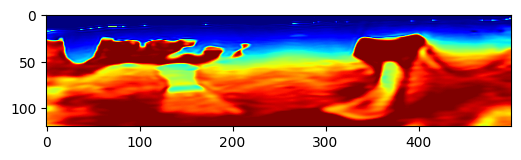

Epoch: 1271 Loss:  -1.9950608611106873 model_loss:  64893.945
Epoch: 1272 Loss:  -1.99506413936615 model_loss:  64869.72
Epoch: 1273 Loss:  -1.9950656294822693 model_loss:  64839.97
Epoch: 1274 Loss:  -1.9950652122497559 model_loss:  64817.312
Epoch: 1275 Loss:  -1.9950676560401917 model_loss:  64787.086
Epoch: 1276 Loss:  -1.9950693249702454 model_loss:  64764.36
Epoch: 1277 Loss:  -1.9950686693191528 model_loss:  64733.605
Epoch: 1278 Loss:  -1.9950715899467468 model_loss:  64713.49
Epoch: 1279 Loss:  -1.9950721859931946 model_loss:  64677.367
Epoch: 1280 Loss:  -1.9950729608535767 model_loss:  64665.35


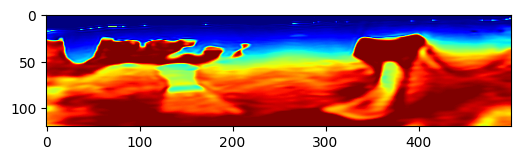

Epoch: 1281 Loss:  -1.9950733184814453 model_loss:  64619.504
Epoch: 1282 Loss:  -1.995076060295105 model_loss:  64619.23
Epoch: 1283 Loss:  -1.9950724244117737 model_loss:  64557.33
Epoch: 1284 Loss:  -1.9950755834579468 model_loss:  64579.363
Epoch: 1285 Loss:  -1.9950677156448364 model_loss:  64485.562
Epoch: 1286 Loss:  -1.9950665831565857 model_loss:  64548.312
Epoch: 1287 Loss:  -1.9950449466705322 model_loss:  64402.79
Epoch: 1288 Loss:  -1.9950342178344727 model_loss:  64517.63
Epoch: 1289 Loss:  -1.9949827790260315 model_loss:  64320.215
Epoch: 1290 Loss:  -1.994950771331787 model_loss:  64460.406


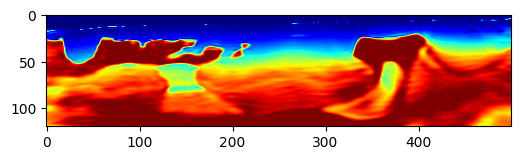

Epoch: 1291 Loss:  -1.9948721528053284 model_loss:  64271.953
Epoch: 1292 Loss:  -1.994839370250702 model_loss:  64382.305
Epoch: 1293 Loss:  -1.994760811328888 model_loss:  64249.35
Epoch: 1294 Loss:  -1.9947768449783325 model_loss:  64303.023
Epoch: 1295 Loss:  -1.9947368502616882 model_loss:  64234.68
Epoch: 1296 Loss:  -1.9948086738586426 model_loss:  64222.84
Epoch: 1297 Loss:  -1.994801938533783 model_loss:  64222.113
Epoch: 1298 Loss:  -1.9948928356170654 model_loss:  64176.957
Epoch: 1299 Loss:  -1.994886338710785 model_loss:  64182.52
Epoch: 1300 Loss:  -1.9949641227722168 model_loss:  64160.79


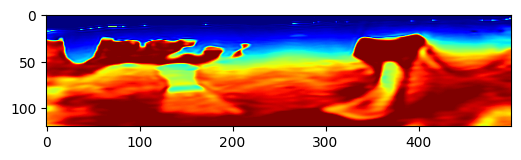

Epoch: 1301 Loss:  -1.9949455261230469 model_loss:  64125.594
Epoch: 1302 Loss:  -1.9950012564659119 model_loss:  64139.39
Epoch: 1303 Loss:  -1.9949675798416138 model_loss:  64067.004
Epoch: 1304 Loss:  -1.9950069189071655 model_loss:  64101.35
Epoch: 1305 Loss:  -1.9949543476104736 model_loss:  64006.734
Epoch: 1306 Loss:  -1.9949817061424255 model_loss:  64054.76
Epoch: 1307 Loss:  -1.994909405708313 model_loss:  63946.395
Epoch: 1308 Loss:  -1.9949325919151306 model_loss:  63999.06
Epoch: 1309 Loss:  -1.9948545694351196 model_loss:  63898.848
Epoch: 1310 Loss:  -1.9948989152908325 model_loss:  63930.496


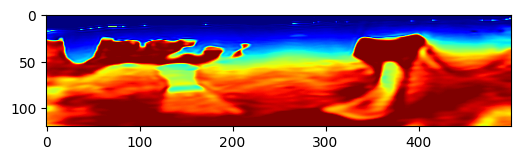

Epoch: 1311 Loss:  -1.9948532581329346 model_loss:  63870.754
Epoch: 1312 Loss:  -1.9949355125427246 model_loss:  63864.74
Epoch: 1313 Loss:  -1.9949123859405518 model_loss:  63841.59
Epoch: 1314 Loss:  -1.9949865341186523 model_loss:  63829.668
Epoch: 1315 Loss:  -1.99495530128479 model_loss:  63785.31
Epoch: 1316 Loss:  -1.9949909448623657 model_loss:  63815.535
Epoch: 1317 Loss:  -1.9949560165405273 model_loss:  63717.93
Epoch: 1318 Loss:  -1.9949851036071777 model_loss:  63788.375
Epoch: 1319 Loss:  -1.9949445724487305 model_loss:  63658.62
Epoch: 1320 Loss:  -1.9949644207954407 model_loss:  63744.312


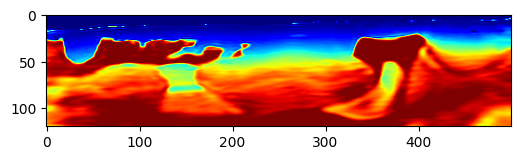

Epoch: 1321 Loss:  -1.9949187636375427 model_loss:  63616.105
Epoch: 1322 Loss:  -1.9949361681938171 model_loss:  63687.996
Epoch: 1323 Loss:  -1.9948920011520386 model_loss:  63587.363
Epoch: 1324 Loss:  -1.9949339628219604 model_loss:  63625.66
Epoch: 1325 Loss:  -1.9949055910110474 model_loss:  63554.434
Epoch: 1326 Loss:  -1.9949488043785095 model_loss:  63571.37
Epoch: 1327 Loss:  -1.9949288964271545 model_loss:  63517.867
Epoch: 1328 Loss:  -1.9949716329574585 model_loss:  63531.574
Epoch: 1329 Loss:  -1.9949463605880737 model_loss:  63470.387
Epoch: 1330 Loss:  -1.994982659816742 model_loss:  63502.01


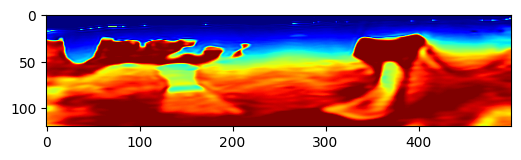

Epoch: 1331 Loss:  -1.9949567317962646 model_loss:  63421.508
Epoch: 1332 Loss:  -1.9949867129325867 model_loss:  63463.11
Epoch: 1333 Loss:  -1.994950771331787 model_loss:  63377.98
Epoch: 1334 Loss:  -1.994986653327942 model_loss:  63413.92
Epoch: 1335 Loss:  -1.994949221611023 model_loss:  63330.598
Epoch: 1336 Loss:  -1.994979977607727 model_loss:  63367.176
Epoch: 1337 Loss:  -1.9949403405189514 model_loss:  63287.535
Epoch: 1338 Loss:  -1.9949840307235718 model_loss:  63315.9
Epoch: 1339 Loss:  -1.9949418902397156 model_loss:  63243.59
Epoch: 1340 Loss:  -1.994981586933136 model_loss:  63270.363


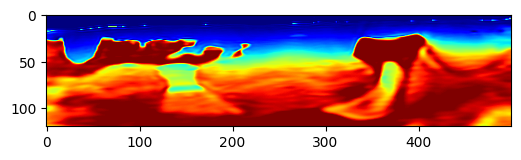

Epoch: 1341 Loss:  -1.9949423670768738 model_loss:  63200.676
Epoch: 1342 Loss:  -1.9949876070022583 model_loss:  63225.957
Epoch: 1343 Loss:  -1.9949427843093872 model_loss:  63160.19
Epoch: 1344 Loss:  -1.9949879050254822 model_loss:  63187.66
Epoch: 1345 Loss:  -1.9949464797973633 model_loss:  63115.777
Epoch: 1346 Loss:  -1.994991958141327 model_loss:  63144.508
Epoch: 1347 Loss:  -1.9949443936347961 model_loss:  63076.35
Epoch: 1348 Loss:  -1.9949942827224731 model_loss:  63101.652
Epoch: 1349 Loss:  -1.994949460029602 model_loss:  63032.203
Epoch: 1350 Loss:  -1.9949964880943298 model_loss:  63060.16


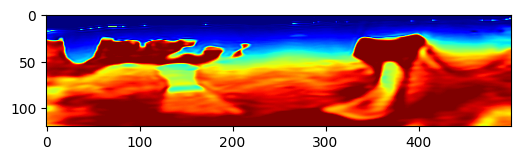

Epoch: 1351 Loss:  -1.9949466586112976 model_loss:  62993.06
Epoch: 1352 Loss:  -1.9950001239776611 model_loss:  63016.8
Epoch: 1353 Loss:  -1.9949524998664856 model_loss:  62950.715
Epoch: 1354 Loss:  -1.9950010180473328 model_loss:  62976.035
Epoch: 1355 Loss:  -1.9949489831924438 model_loss:  62911.914
Epoch: 1356 Loss:  -1.99500572681427 model_loss:  62932.32
Epoch: 1357 Loss:  -1.9949559569358826 model_loss:  62869.31
Epoch: 1358 Loss:  -1.9950048327445984 model_loss:  62893.125
Epoch: 1359 Loss:  -1.9949507117271423 model_loss:  62830.875
Epoch: 1360 Loss:  -1.9950112700462341 model_loss:  62848.297


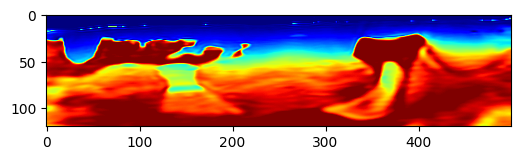

Epoch: 1361 Loss:  -1.9949599504470825 model_loss:  62788.297
Epoch: 1362 Loss:  -1.9950080513954163 model_loss:  62810.625
Epoch: 1363 Loss:  -1.9949522018432617 model_loss:  62750.72
Epoch: 1364 Loss:  -1.995017647743225 model_loss:  62763.64
Epoch: 1365 Loss:  -1.9949655532836914 model_loss:  62708.17
Epoch: 1366 Loss:  -1.9950112104415894 model_loss:  62727.867
Epoch: 1367 Loss:  -1.9949538111686707 model_loss:  62671.418
Epoch: 1368 Loss:  -1.9950257539749146 model_loss:  62677.504
Epoch: 1369 Loss:  -1.9949740171432495 model_loss:  62629.457
Epoch: 1370 Loss:  -1.9950129985809326 model_loss:  62644.992


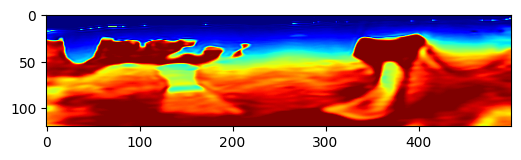

Epoch: 1371 Loss:  -1.994953989982605 model_loss:  62594.902
Epoch: 1372 Loss:  -1.9950355291366577 model_loss:  62588.535
Epoch: 1373 Loss:  -1.9949846863746643 model_loss:  62554.344
Epoch: 1374 Loss:  -1.9950101971626282 model_loss:  62561.45
Epoch: 1375 Loss:  -1.994947612285614 model_loss:  62525.113
Epoch: 1376 Loss:  -1.9950434565544128 model_loss:  62491.203
Epoch: 1377 Loss:  -1.994992971420288 model_loss:  62489.9
Epoch: 1378 Loss:  -1.994989812374115 model_loss:  62469.234
Epoch: 1379 Loss:  -1.9949191808700562 model_loss:  62476.633
Epoch: 1380 Loss:  -1.9950274229049683 model_loss:  62361.664


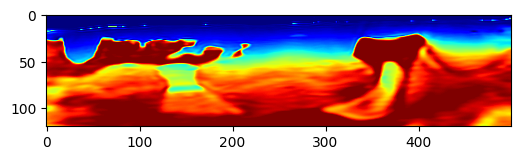

Epoch: 1381 Loss:  -1.9949641227722168 model_loss:  62467.902
Epoch: 1382 Loss:  -1.994894564151764 model_loss:  62323.1
Epoch: 1383 Loss:  -1.9947839975357056 model_loss:  62500.27
Epoch: 1384 Loss:  -1.994809091091156 model_loss:  62113.69
Epoch: 1385 Loss:  -1.9946120977401733 model_loss:  62478.953
Epoch: 1386 Loss:  -1.994379997253418 model_loss:  62151.35
Epoch: 1387 Loss:  -1.9942131042480469 model_loss:  62246.188
Epoch: 1388 Loss:  -1.9943479299545288 model_loss:  62156.297
Epoch: 1389 Loss:  -1.9944157600402832 model_loss:  62178.83
Epoch: 1390 Loss:  -1.9945878386497498 model_loss:  62229.137


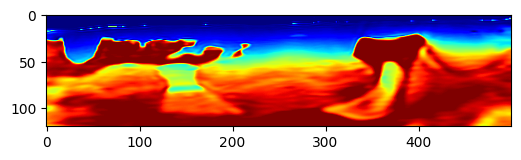

Epoch: 1391 Loss:  -1.994692325592041 model_loss:  62134.434
Epoch: 1392 Loss:  -1.9949187636375427 model_loss:  62149.793
Epoch: 1393 Loss:  -1.9949883222579956 model_loss:  62106.316
Epoch: 1394 Loss:  -1.9949619770050049 model_loss:  62141.473
Epoch: 1395 Loss:  -1.9948660731315613 model_loss:  62167.234
Epoch: 1396 Loss:  -1.994980812072754 model_loss:  61998.07
Epoch: 1397 Loss:  -1.9949315786361694 model_loss:  62113.23
Epoch: 1398 Loss:  -1.994701862335205 model_loss:  62049.125
Epoch: 1399 Loss:  -1.9947572946548462 model_loss:  62074.18
Epoch: 1400 Loss:  -1.9948760867118835 model_loss:  61972.18


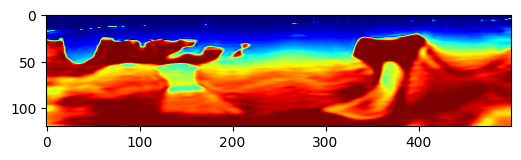

Epoch: 1401 Loss:  -1.9949913620948792 model_loss:  61846.062
Epoch: 1402 Loss:  -1.995102345943451 model_loss:  62128.418
Epoch: 1403 Loss:  -1.995014727115631 model_loss:  61929.95
Epoch: 1404 Loss:  -1.9951090812683105 model_loss:  61925.96
Epoch: 1405 Loss:  -1.9949781894683838 model_loss:  61938.71
Epoch: 1406 Loss:  -1.9951186776161194 model_loss:  61816.35
Epoch: 1407 Loss:  -1.9951282739639282 model_loss:  62025.91
Epoch: 1408 Loss:  -1.995177984237671 model_loss:  61839.367
Epoch: 1409 Loss:  -1.9951266050338745 model_loss:  61894.168
Epoch: 1410 Loss:  -1.9951750040054321 model_loss:  61899.758


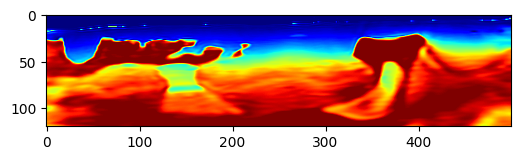

Epoch: 1411 Loss:  -1.9951879382133484 model_loss:  61810.27
Epoch: 1412 Loss:  -1.9951937198638916 model_loss:  61900.87
Epoch: 1413 Loss:  -1.9952077269554138 model_loss:  61796.92
Epoch: 1414 Loss:  -1.9951727390289307 model_loss:  61819.527
Epoch: 1415 Loss:  -1.9952057600021362 model_loss:  61812.066
Epoch: 1416 Loss:  -1.995187759399414 model_loss:  61768.86
Epoch: 1417 Loss:  -1.9952170848846436 model_loss:  61807.453
Epoch: 1418 Loss:  -1.9952099919319153 model_loss:  61740.793
Epoch: 1419 Loss:  -1.99520605802536 model_loss:  61754.72
Epoch: 1420 Loss:  -1.9952164888381958 model_loss:  61732.258


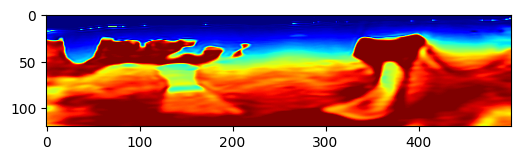

Epoch: 1421 Loss:  -1.9952014684677124 model_loss:  61705.19
Epoch: 1422 Loss:  -1.9952220916748047 model_loss:  61720.113
Epoch: 1423 Loss:  -1.9952123761177063 model_loss:  61684.19
Epoch: 1424 Loss:  -1.9952201843261719 model_loss:  61690.023
Epoch: 1425 Loss:  -1.9952216148376465 model_loss:  61651.793
Epoch: 1426 Loss:  -1.9952131509780884 model_loss:  61639.625
Epoch: 1427 Loss:  -1.9952263832092285 model_loss:  61630.453
Epoch: 1428 Loss:  -1.9952152371406555 model_loss:  61605.07
Epoch: 1429 Loss:  -1.9952267408370972 model_loss:  61605.074
Epoch: 1430 Loss:  -1.995225191116333 model_loss:  61577.74


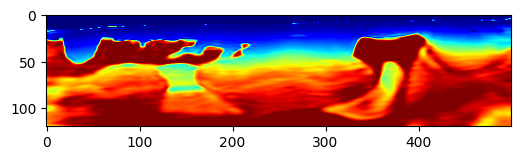

Epoch: 1431 Loss:  -1.9952216148376465 model_loss:  61571.812
Epoch: 1432 Loss:  -1.9952316284179688 model_loss:  61545.13
Epoch: 1433 Loss:  -1.9952195882797241 model_loss:  61532.473
Epoch: 1434 Loss:  -1.9952317476272583 model_loss:  61516.434
Epoch: 1435 Loss:  -1.9952276945114136 model_loss:  61497.215
Epoch: 1436 Loss:  -1.9952282309532166 model_loss:  61491.402
Epoch: 1437 Loss:  -1.995236575603485 model_loss:  61462.555
Epoch: 1438 Loss:  -1.9952248930931091 model_loss:  61456.555
Epoch: 1439 Loss:  -1.9952374696731567 model_loss:  61427.984
Epoch: 1440 Loss:  -1.9952311515808105 model_loss:  61417.977


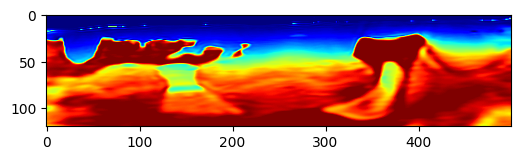

Epoch: 1441 Loss:  -1.9952340126037598 model_loss:  61404.63
Epoch: 1442 Loss:  -1.9952405095100403 model_loss:  61380.77
Epoch: 1443 Loss:  -1.9952307343482971 model_loss:  61375.566
Epoch: 1444 Loss:  -1.9952431321144104 model_loss:  61345.195
Epoch: 1445 Loss:  -1.9952359795570374 model_loss:  61338.07
Epoch: 1446 Loss:  -1.9952399730682373 model_loss:  61316.465
Epoch: 1447 Loss:  -1.9952444434165955 model_loss:  61299.406
Epoch: 1448 Loss:  -1.9952370524406433 model_loss:  61288.938
Epoch: 1449 Loss:  -1.9952470064163208 model_loss:  61262.71
Epoch: 1450 Loss:  -1.995241940021515 model_loss:  61253.535


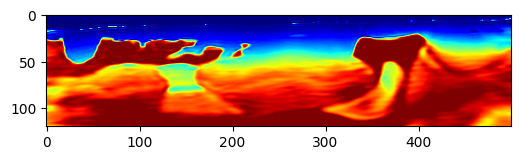

Epoch: 1451 Loss:  -1.9952447414398193 model_loss:  61231.51
Epoch: 1452 Loss:  -1.995248556137085 model_loss:  61215.688
Epoch: 1453 Loss:  -1.9952439069747925 model_loss:  61201.656
Epoch: 1454 Loss:  -1.99524986743927 model_loss:  61180.613
Epoch: 1455 Loss:  -1.9952488541603088 model_loss:  61166.414
Epoch: 1456 Loss:  -1.9952483177185059 model_loss:  61148.98
Epoch: 1457 Loss:  -1.9952527284622192 model_loss:  61129.59
Epoch: 1458 Loss:  -1.9952499866485596 model_loss:  61115.715
Epoch: 1459 Loss:  -1.995252549648285 model_loss:  61096.004
Epoch: 1460 Loss:  -1.9952548742294312 model_loss:  61079.52


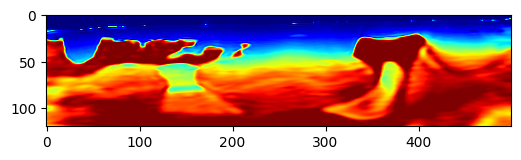

Epoch: 1461 Loss:  -1.9952521920204163 model_loss:  61064.55
Epoch: 1462 Loss:  -1.995256781578064 model_loss:  61043.332
Epoch: 1463 Loss:  -1.9952560663223267 model_loss:  61029.965
Epoch: 1464 Loss:  -1.9952561259269714 model_loss:  61010.277
Epoch: 1465 Loss:  -1.9952596426010132 model_loss:  60993.324
Epoch: 1466 Loss:  -1.9952577352523804 model_loss:  60977.49
Epoch: 1467 Loss:  -1.9952601790428162 model_loss:  60957.97
Epoch: 1468 Loss:  -1.9952614903450012 model_loss:  60942.184
Epoch: 1469 Loss:  -1.9952608942985535 model_loss:  60924.47
Epoch: 1470 Loss:  -1.9952630996704102 model_loss:  60907.03


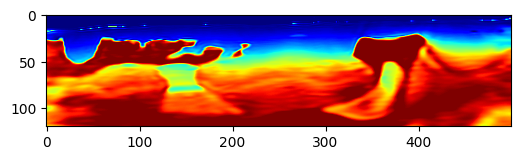

Epoch: 1471 Loss:  -1.9952637553215027 model_loss:  60890.72
Epoch: 1472 Loss:  -1.9952635765075684 model_loss:  60872.617
Epoch: 1473 Loss:  -1.995266079902649 model_loss:  60855.332
Epoch: 1474 Loss:  -1.9952662587165833 model_loss:  60837.6
Epoch: 1475 Loss:  -1.9952664375305176 model_loss:  60820.51
Epoch: 1476 Loss:  -1.9952687621116638 model_loss:  60803.38
Epoch: 1477 Loss:  -1.9952687621116638 model_loss:  60785.86
Epoch: 1478 Loss:  -1.9952695965766907 model_loss:  60769.016
Epoch: 1479 Loss:  -1.9952712655067444 model_loss:  60750.8
Epoch: 1480 Loss:  -1.995271623134613 model_loss:  60733.58


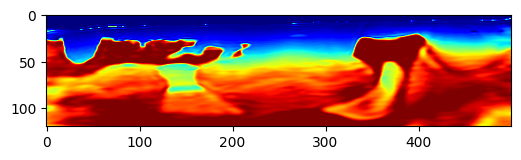

Epoch: 1481 Loss:  -1.9952722787857056 model_loss:  60716.504
Epoch: 1482 Loss:  -1.9952741265296936 model_loss:  60698.695
Epoch: 1483 Loss:  -1.9952744245529175 model_loss:  60682.266
Epoch: 1484 Loss:  -1.9952753782272339 model_loss:  60665.01
Epoch: 1485 Loss:  -1.9952771663665771 model_loss:  60647.52
Epoch: 1486 Loss:  -1.9952779412269592 model_loss:  60630.51
Epoch: 1487 Loss:  -1.9952785968780518 model_loss:  60612.734
Epoch: 1488 Loss:  -1.9952803254127502 model_loss:  60594.42
Epoch: 1489 Loss:  -1.9952808022499084 model_loss:  60576.938
Epoch: 1490 Loss:  -1.99528169631958 model_loss:  60558.95


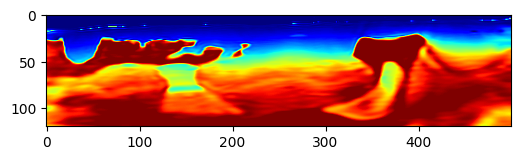

Epoch: 1491 Loss:  -1.99528306722641 model_loss:  60541.47
Epoch: 1492 Loss:  -1.9952840209007263 model_loss:  60523.62
Epoch: 1493 Loss:  -1.995284378528595 model_loss:  60506.48
Epoch: 1494 Loss:  -1.9952861070632935 model_loss:  60487.555
Epoch: 1495 Loss:  -1.9952868223190308 model_loss:  60470.742
Epoch: 1496 Loss:  -1.9952875971794128 model_loss:  60452.348
Epoch: 1497 Loss:  -1.9952886700630188 model_loss:  60436.625
Epoch: 1498 Loss:  -1.9952898025512695 model_loss:  60417.215
Epoch: 1499 Loss:  -1.995290219783783 model_loss:  60403.285
Epoch: 1500 Loss:  -1.9952915906906128 model_loss:  60381.36


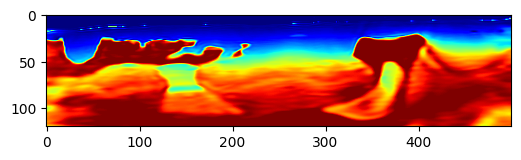

Epoch: 1501 Loss:  -1.9952924251556396 model_loss:  60370.023
Epoch: 1502 Loss:  -1.9952932000160217 model_loss:  60344.383
Epoch: 1503 Loss:  -1.9952934980392456 model_loss:  60339.242
Epoch: 1504 Loss:  -1.9952951669692993 model_loss:  60304.316
Epoch: 1505 Loss:  -1.9952947497367859 model_loss:  60312.086
Epoch: 1506 Loss:  -1.9952948093414307 model_loss:  60258.812
Epoch: 1507 Loss:  -1.995293140411377 model_loss:  60291.883
Epoch: 1508 Loss:  -1.995289921760559 model_loss:  60200.746
Epoch: 1509 Loss:  -1.9952799677848816 model_loss:  60282.08
Epoch: 1510 Loss:  -1.9952646493911743 model_loss:  60127.934


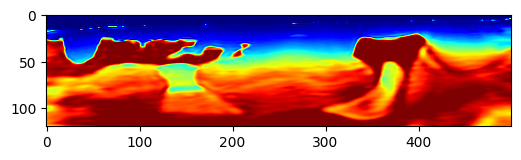

Epoch: 1511 Loss:  -1.9952328205108643 model_loss:  60260.992
Epoch: 1512 Loss:  -1.9951955080032349 model_loss:  60071.797
Epoch: 1513 Loss:  -1.9951313138008118 model_loss:  60198.434
Epoch: 1514 Loss:  -1.9950885772705078 model_loss:  60054.707
Epoch: 1515 Loss:  -1.9950167536735535 model_loss:  60145.074
Epoch: 1516 Loss:  -1.9949933290481567 model_loss:  60027.785
Epoch: 1517 Loss:  -1.994960606098175 model_loss:  60070.434
Epoch: 1518 Loss:  -1.9950004816055298 model_loss:  60029.984
Epoch: 1519 Loss:  -1.9950093030929565 model_loss:  59997.445
Epoch: 1520 Loss:  -1.9950815439224243 model_loss:  60031.18


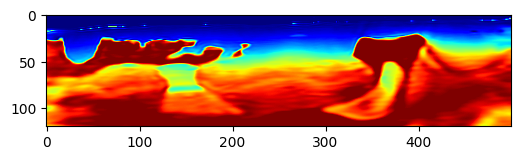

Epoch: 1521 Loss:  -1.9950951933860779 model_loss:  59981.918
Epoch: 1522 Loss:  -1.9951547384262085 model_loss:  59996.62
Epoch: 1523 Loss:  -1.9951438307762146 model_loss:  59974.152
Epoch: 1524 Loss:  -1.9951845407485962 model_loss:  59963.406
Epoch: 1525 Loss:  -1.995140552520752 model_loss:  59943.06
Epoch: 1526 Loss:  -1.9951648712158203 model_loss:  59942.887
Epoch: 1527 Loss:  -1.9950969815254211 model_loss:  59903.055
Epoch: 1528 Loss:  -1.995126485824585 model_loss:  59918.04
Epoch: 1529 Loss:  -1.9950592517852783 model_loss:  59866.71
Epoch: 1530 Loss:  -1.9951099157333374 model_loss:  59883.75


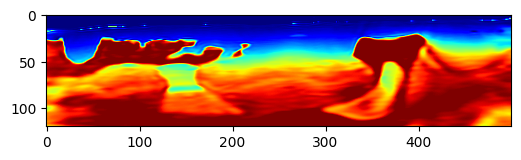

Epoch: 1531 Loss:  -1.995065152645111 model_loss:  59834.395
Epoch: 1532 Loss:  -1.9951339364051819 model_loss:  59852.72
Epoch: 1533 Loss:  -1.9951059818267822 model_loss:  59809.055
Epoch: 1534 Loss:  -1.9951810836791992 model_loss:  59826.266
Epoch: 1535 Loss:  -1.9951528906822205 model_loss:  59783.55
Epoch: 1536 Loss:  -1.995217740535736 model_loss:  59805.168
Epoch: 1537 Loss:  -1.9951854348182678 model_loss:  59747.543
Epoch: 1538 Loss:  -1.9952335953712463 model_loss:  59784.5
Epoch: 1539 Loss:  -1.9951903223991394 model_loss:  59706.836
Epoch: 1540 Loss:  -1.9952293038368225 model_loss:  59762.832


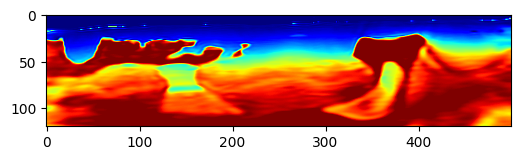

Epoch: 1541 Loss:  -1.9951748251914978 model_loss:  59661.926
Epoch: 1542 Loss:  -1.995203673839569 model_loss:  59743.22
Epoch: 1543 Loss:  -1.9951385855674744 model_loss:  59617.715
Epoch: 1544 Loss:  -1.9951644539833069 model_loss:  59714.31
Epoch: 1545 Loss:  -1.9950948357582092 model_loss:  59583.805
Epoch: 1546 Loss:  -1.9951210618019104 model_loss:  59675.504
Epoch: 1547 Loss:  -1.9950624704360962 model_loss:  59561.992
Epoch: 1548 Loss:  -1.995099663734436 model_loss:  59631.402
Epoch: 1549 Loss:  -1.9950602054595947 model_loss:  59543.75
Epoch: 1550 Loss:  -1.9951077699661255 model_loss:  59588.883


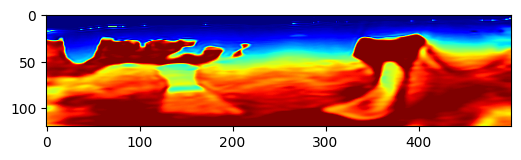

Epoch: 1551 Loss:  -1.99508935213089 model_loss:  59523.195
Epoch: 1552 Loss:  -1.9951380491256714 model_loss:  59551.87
Epoch: 1553 Loss:  -1.9951284527778625 model_loss:  59499.89
Epoch: 1554 Loss:  -1.9951698184013367 model_loss:  59525.934
Epoch: 1555 Loss:  -1.9951618909835815 model_loss:  59468.39
Epoch: 1556 Loss:  -1.9951895475387573 model_loss:  59504.016
Epoch: 1557 Loss:  -1.9951783418655396 model_loss:  59435.273
Epoch: 1558 Loss:  -1.995193898677826 model_loss:  59478.617
Epoch: 1559 Loss:  -1.995182454586029 model_loss:  59403.67
Epoch: 1560 Loss:  -1.99518620967865 model_loss:  59450.76


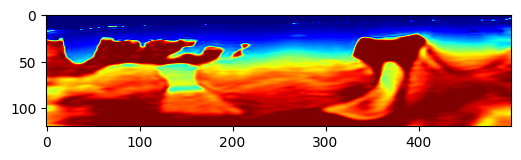

Epoch: 1561 Loss:  -1.9951742887496948 model_loss:  59373.37
Epoch: 1562 Loss:  -1.9951698780059814 model_loss:  59419.367
Epoch: 1563 Loss:  -1.9951637983322144 model_loss:  59342.926
Epoch: 1564 Loss:  -1.99514639377594 model_loss:  59385.26
Epoch: 1565 Loss:  -1.995143175125122 model_loss:  59318.23
Epoch: 1566 Loss:  -1.9951145648956299 model_loss:  59347.78
Epoch: 1567 Loss:  -1.9951223731040955 model_loss:  59292.902
Epoch: 1568 Loss:  -1.995071291923523 model_loss:  59312.145
Epoch: 1569 Loss:  -1.9950820803642273 model_loss:  59276.04
Epoch: 1570 Loss:  -1.995023250579834 model_loss:  59270.355


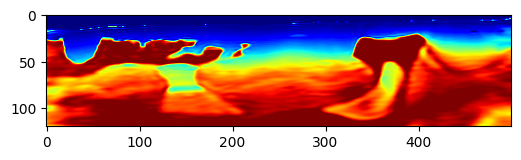

Epoch: 1571 Loss:  -1.99506014585495 model_loss:  59255.37
Epoch: 1572 Loss:  -1.9949976801872253 model_loss:  59237.215
Epoch: 1573 Loss:  -1.9950551390647888 model_loss:  59243.29
Epoch: 1574 Loss:  -1.9950297474861145 model_loss:  59205.688
Epoch: 1575 Loss:  -1.9951159954071045 model_loss:  59216.824
Epoch: 1576 Loss:  -1.995091736316681 model_loss:  59193.445
Epoch: 1577 Loss:  -1.995166838169098 model_loss:  59197.62
Epoch: 1578 Loss:  -1.9951606392860413 model_loss:  59166.74
Epoch: 1579 Loss:  -1.9952292442321777 model_loss:  59166.164
Epoch: 1580 Loss:  -1.9951912760734558 model_loss:  59157.31


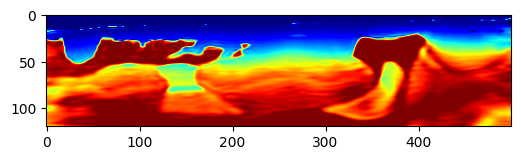

Epoch: 1581 Loss:  -1.9952284097671509 model_loss:  59142.785
Epoch: 1582 Loss:  -1.9952083826065063 model_loss:  59120.188
Epoch: 1583 Loss:  -1.9952539801597595 model_loss:  59100.53
Epoch: 1584 Loss:  -1.9951849579811096 model_loss:  59116.867
Epoch: 1585 Loss:  -1.9951856136322021 model_loss:  59079.527
Epoch: 1586 Loss:  -1.9951779246330261 model_loss:  59068.414
Epoch: 1587 Loss:  -1.995208740234375 model_loss:  59024.016
Epoch: 1588 Loss:  -1.9951168298721313 model_loss:  59094.758
Epoch: 1589 Loss:  -1.995065450668335 model_loss:  59015.297
Epoch: 1590 Loss:  -1.9951239228248596 model_loss:  59020.195


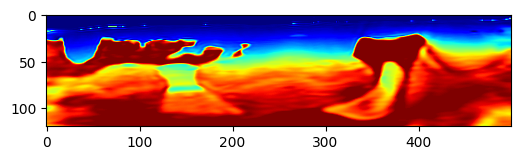

Epoch: 1591 Loss:  -1.9951156973838806 model_loss:  58943.984
Epoch: 1592 Loss:  -1.99498051404953 model_loss:  59096.51
Epoch: 1593 Loss:  -1.9949235916137695 model_loss:  58940.156
Epoch: 1594 Loss:  -1.9950246214866638 model_loss:  58956.836
Epoch: 1595 Loss:  -1.9950539469718933 model_loss:  58888.98
Epoch: 1596 Loss:  -1.994801640510559 model_loss:  59059.203
Epoch: 1597 Loss:  -1.9949730038642883 model_loss:  58873.395
Epoch: 1598 Loss:  -1.9950323104858398 model_loss:  58889.035
Epoch: 1599 Loss:  -1.9950921535491943 model_loss:  58845.984
Epoch: 1600 Loss:  -1.9949912428855896 model_loss:  58872.84


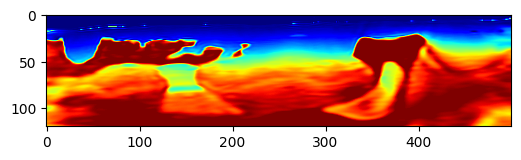

Epoch: 1601 Loss:  -1.9952145218849182 model_loss:  59025.758
Epoch: 1602 Loss:  -1.9950639009475708 model_loss:  58741.05
Epoch: 1603 Loss:  -1.9951125383377075 model_loss:  58859.844
Epoch: 1604 Loss:  -1.9948396682739258 model_loss:  58926.746
Epoch: 1605 Loss:  -1.9947094917297363 model_loss:  58756.3
Epoch: 1606 Loss:  -1.9936811923980713 model_loss:  59047.67
Epoch: 1607 Loss:  -1.9919734001159668 model_loss:  58567.95
Epoch: 1608 Loss:  -1.9885788559913635 model_loss:  59293.094
Epoch: 1609 Loss:  -1.9871842861175537 model_loss:  58733.414
Epoch: 1610 Loss:  -1.9876163005828857 model_loss:  58538.785


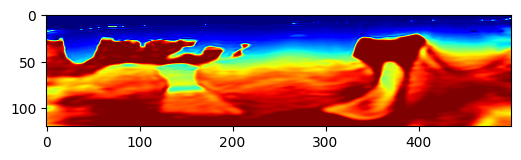

Epoch: 1611 Loss:  -1.9920178055763245 model_loss:  59068.684
Epoch: 1612 Loss:  -1.9937105178833008 model_loss:  58646.996
Epoch: 1613 Loss:  -1.9946731925010681 model_loss:  58863.9
Epoch: 1614 Loss:  -1.9945549368858337 model_loss:  58913.65
Epoch: 1615 Loss:  -1.9945147633552551 model_loss:  58658.746
Epoch: 1616 Loss:  -1.993584394454956 model_loss:  59044.883
Epoch: 1617 Loss:  -1.9923048615455627 model_loss:  58849.03
Epoch: 1618 Loss:  -1.991018295288086 model_loss:  58962.41
Epoch: 1619 Loss:  -1.9911773800849915 model_loss:  58917.613
Epoch: 1620 Loss:  -1.9914817810058594 model_loss:  58815.824


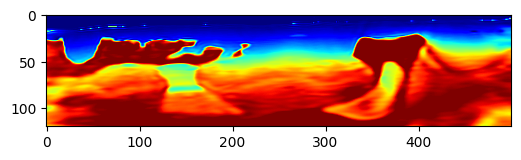

Epoch: 1621 Loss:  -1.9934149980545044 model_loss:  58802.42
Epoch: 1622 Loss:  -1.9941505193710327 model_loss:  58654.363
Epoch: 1623 Loss:  -1.9948886036872864 model_loss:  58806.33
Epoch: 1624 Loss:  -1.9948608875274658 model_loss:  58778.83
Epoch: 1625 Loss:  -1.9949225187301636 model_loss:  58763.75
Epoch: 1626 Loss:  -1.9944857358932495 model_loss:  58917.633
Epoch: 1627 Loss:  -1.9940600395202637 model_loss:  58818.69
Epoch: 1628 Loss:  -1.9932340383529663 model_loss:  58988.375
Epoch: 1629 Loss:  -1.9929396510124207 model_loss:  58801.484
Epoch: 1630 Loss:  -1.9924739003181458 model_loss:  58799.57


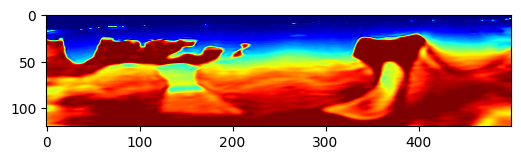

Epoch: 1631 Loss:  -1.993316113948822 model_loss:  58802.39
Epoch: 1632 Loss:  -1.9936556816101074 model_loss:  58733.137
Epoch: 1633 Loss:  -1.9945502877235413 model_loss:  58831.668
Epoch: 1634 Loss:  -1.9946575164794922 model_loss:  58798.645
Epoch: 1635 Loss:  -1.9949535727500916 model_loss:  58815.184
Epoch: 1636 Loss:  -1.9947752952575684 model_loss:  58874.145
Epoch: 1637 Loss:  -1.9947109818458557 model_loss:  58829.43
Epoch: 1638 Loss:  -1.994291067123413 model_loss:  58920.844
Epoch: 1639 Loss:  -1.994139850139618 model_loss:  58815.87
Epoch: 1640 Loss:  -1.9936072826385498 model_loss:  58878.375


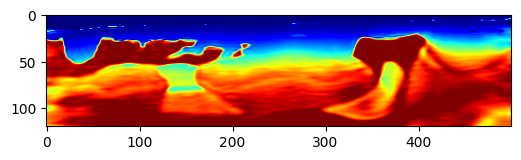

Epoch: 1641 Loss:  -1.9938033819198608 model_loss:  58822.125
Epoch: 1642 Loss:  -1.9936546683311462 model_loss:  58828.547
Epoch: 1643 Loss:  -1.9942747354507446 model_loss:  58826.95
Epoch: 1644 Loss:  -1.9943473935127258 model_loss:  58793.395
Epoch: 1645 Loss:  -1.9947890043258667 model_loss:  58839.043
Epoch: 1646 Loss:  -1.994739592075348 model_loss:  58837.152
Epoch: 1647 Loss:  -1.994895577430725 model_loss:  58840.04
Epoch: 1648 Loss:  -1.9947009682655334 model_loss:  58891.52
Epoch: 1649 Loss:  -1.9947240352630615 model_loss:  58822.75
Epoch: 1650 Loss:  -1.9943882822990417 model_loss:  58881.082


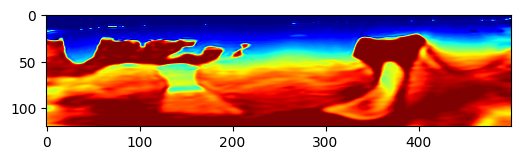

Epoch: 1651 Loss:  -1.9944263696670532 model_loss:  58823.81
Epoch: 1652 Loss:  -1.9941110014915466 model_loss:  58851.617
Epoch: 1653 Loss:  -1.9943633675575256 model_loss:  58817.066
Epoch: 1654 Loss:  -1.9942371249198914 model_loss:  58834.26
Epoch: 1655 Loss:  -1.9946126341819763 model_loss:  58834.97
Epoch: 1656 Loss:  -1.994575023651123 model_loss:  58826.812
Epoch: 1657 Loss:  -1.9948484301567078 model_loss:  58838.72
Epoch: 1658 Loss:  -1.994761347770691 model_loss:  58844.45
Epoch: 1659 Loss:  -1.9949093461036682 model_loss:  58826.617
Epoch: 1660 Loss:  -1.9947377443313599 model_loss:  58857.53


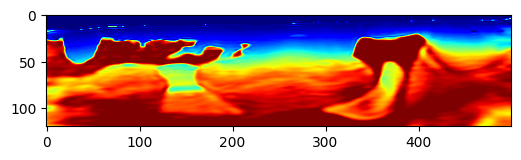

Epoch: 1661 Loss:  -1.9948227405548096 model_loss:  58814.742
Epoch: 1662 Loss:  -1.9945797324180603 model_loss:  58851.97
Epoch: 1663 Loss:  -1.9946873188018799 model_loss:  58807.03
Epoch: 1664 Loss:  -1.9944607615470886 model_loss:  58839.395
Epoch: 1665 Loss:  -1.9946576952934265 model_loss:  58812.105
Epoch: 1666 Loss:  -1.994516372680664 model_loss:  58823.527
Epoch: 1667 Loss:  -1.994761049747467 model_loss:  58811.266
Epoch: 1668 Loss:  -1.9946720004081726 model_loss:  58815.258
Epoch: 1669 Loss:  -1.9948845505714417 model_loss:  58807.953
Epoch: 1670 Loss:  -1.9947839975357056 model_loss:  58818.227


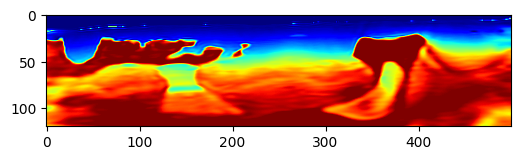

Epoch: 1671 Loss:  -1.9949389100074768 model_loss:  58800.06
Epoch: 1672 Loss:  -1.9947950839996338 model_loss:  58818.37
Epoch: 1673 Loss:  -1.9949142932891846 model_loss:  58788.742
Epoch: 1674 Loss:  -1.9947348833084106 model_loss:  58818.07
Epoch: 1675 Loss:  -1.994857668876648 model_loss:  58783.254
Epoch: 1676 Loss:  -1.9946770071983337 model_loss:  58808.01
Epoch: 1677 Loss:  -1.994830071926117 model_loss:  58777.836
Epoch: 1678 Loss:  -1.994680941104889 model_loss:  58794.426
Epoch: 1679 Loss:  -1.994860589504242 model_loss:  58774.28
Epoch: 1680 Loss:  -1.9947436451911926 model_loss:  58785.418


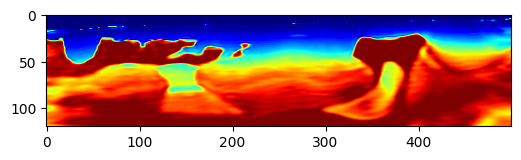

Epoch: 1681 Loss:  -1.9949219822883606 model_loss:  58768.305
Epoch: 1682 Loss:  -1.994811236858368 model_loss:  58777.88
Epoch: 1683 Loss:  -1.9949660897254944 model_loss:  58759.473
Epoch: 1684 Loss:  -1.9948409795761108 model_loss:  58775.137
Epoch: 1685 Loss:  -1.9949743151664734 model_loss:  58750.46
Epoch: 1686 Loss:  -1.9948309659957886 model_loss:  58770.977
Epoch: 1687 Loss:  -1.9949575066566467 model_loss:  58741.477
Epoch: 1688 Loss:  -1.9948057532310486 model_loss:  58762.223
Epoch: 1689 Loss:  -1.9949395060539246 model_loss:  58733.023
Epoch: 1690 Loss:  -1.994795024394989 model_loss:  58751.234


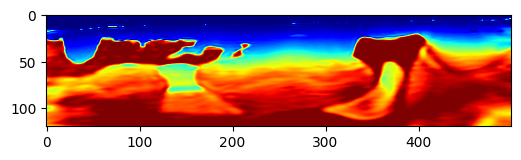

Epoch: 1691 Loss:  -1.9949419498443604 model_loss:  58725.13
Epoch: 1692 Loss:  -1.9948127269744873 model_loss:  58739.38
Epoch: 1693 Loss:  -1.9949651956558228 model_loss:  58716.867
Epoch: 1694 Loss:  -1.9948461055755615 model_loss:  58729.516
Epoch: 1695 Loss:  -1.9949930310249329 model_loss:  58708.13
Epoch: 1696 Loss:  -1.9948736429214478 model_loss:  58721.996
Epoch: 1697 Loss:  -1.9950103163719177 model_loss:  58698.55
Epoch: 1698 Loss:  -1.9948840737342834 model_loss:  58714.598
Epoch: 1699 Loss:  -1.9950129389762878 model_loss:  58688.02
Epoch: 1700 Loss:  -1.9948800206184387 model_loss:  58705.723


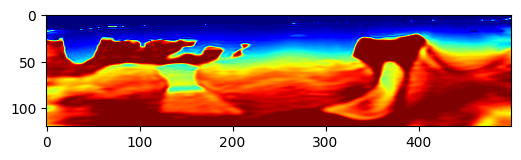

Epoch: 1701 Loss:  -1.9950076937675476 model_loss:  58677.633
Epoch: 1702 Loss:  -1.9948735237121582 model_loss:  58695.133
Epoch: 1703 Loss:  -1.995004951953888 model_loss:  58667.332
Epoch: 1704 Loss:  -1.994875192642212 model_loss:  58683.355
Epoch: 1705 Loss:  -1.9950106143951416 model_loss:  58657.312
Epoch: 1706 Loss:  -1.9948872327804565 model_loss:  58672.12
Epoch: 1707 Loss:  -1.9950233697891235 model_loss:  58647.39
Epoch: 1708 Loss:  -1.9949035048484802 model_loss:  58661.707
Epoch: 1709 Loss:  -1.9950367212295532 model_loss:  58636.867
Epoch: 1710 Loss:  -1.994916558265686 model_loss:  58651.727


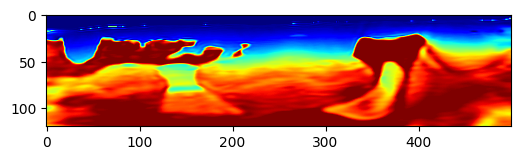

Epoch: 1711 Loss:  -1.9950451850891113 model_loss:  58625.824
Epoch: 1712 Loss:  -1.9949225187301636 model_loss:  58641.63
Epoch: 1713 Loss:  -1.9950482845306396 model_loss:  58614.34
Epoch: 1714 Loss:  -1.9949234127998352 model_loss:  58630.734
Epoch: 1715 Loss:  -1.9950486421585083 model_loss:  58602.773
Epoch: 1716 Loss:  -1.9949238300323486 model_loss:  58619.137
Epoch: 1717 Loss:  -1.995050311088562 model_loss:  58591.402
Epoch: 1718 Loss:  -1.9949273467063904 model_loss:  58607.246
Epoch: 1719 Loss:  -1.9950547814369202 model_loss:  58580.09
Epoch: 1720 Loss:  -1.9949344992637634 model_loss:  58595.47


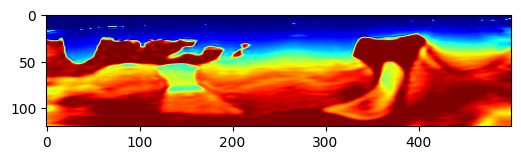

Epoch: 1721 Loss:  -1.9950618743896484 model_loss:  58568.695
Epoch: 1722 Loss:  -1.9949430227279663 model_loss:  58583.895
Epoch: 1723 Loss:  -1.9950689673423767 model_loss:  58556.99
Epoch: 1724 Loss:  -1.9949504733085632 model_loss:  58572.414
Epoch: 1725 Loss:  -1.9950743913650513 model_loss:  58544.91
Epoch: 1726 Loss:  -1.994955062866211 model_loss:  58560.785
Epoch: 1727 Loss:  -1.9950777888298035 model_loss:  58532.676
Epoch: 1728 Loss:  -1.9949578046798706 model_loss:  58548.848
Epoch: 1729 Loss:  -1.9950799942016602 model_loss:  58520.363
Epoch: 1730 Loss:  -1.994960069656372 model_loss:  58536.566


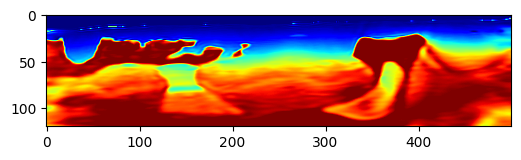

Epoch: 1731 Loss:  -1.9950823187828064 model_loss:  58508.03
Epoch: 1732 Loss:  -1.9949634671211243 model_loss:  58524.117
Epoch: 1733 Loss:  -1.9950860142707825 model_loss:  58495.727
Epoch: 1734 Loss:  -1.9949679374694824 model_loss:  58511.676
Epoch: 1735 Loss:  -1.9950903058052063 model_loss:  58483.33
Epoch: 1736 Loss:  -1.9949733018875122 model_loss:  58499.242
Epoch: 1737 Loss:  -1.9950947761535645 model_loss:  58470.766
Epoch: 1738 Loss:  -1.9949778318405151 model_loss:  58486.824
Epoch: 1739 Loss:  -1.9950986504554749 model_loss:  58458.055
Epoch: 1740 Loss:  -1.994981586933136 model_loss:  58474.31


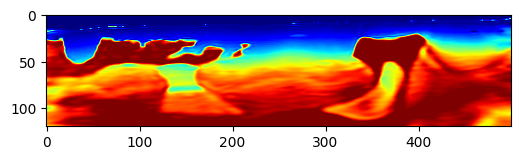

Epoch: 1741 Loss:  -1.9951017498970032 model_loss:  58445.21
Epoch: 1742 Loss:  -1.9949846863746643 model_loss:  58461.645
Epoch: 1743 Loss:  -1.9951043725013733 model_loss:  58432.273
Epoch: 1744 Loss:  -1.994987428188324 model_loss:  58448.812
Epoch: 1745 Loss:  -1.9951069355010986 model_loss:  58419.336
Epoch: 1746 Loss:  -1.9949904084205627 model_loss:  58435.89
Epoch: 1747 Loss:  -1.9951096177101135 model_loss:  58406.34
Epoch: 1748 Loss:  -1.994993805885315 model_loss:  58422.92
Epoch: 1749 Loss:  -1.9951127767562866 model_loss:  58393.33
Epoch: 1750 Loss:  -1.9949972033500671 model_loss:  58409.926


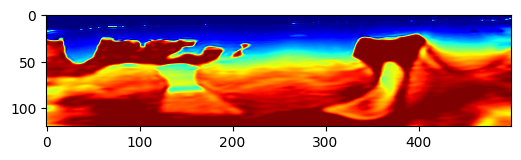

Epoch: 1751 Loss:  -1.9951159954071045 model_loss:  58380.188
Epoch: 1752 Loss:  -1.9950007200241089 model_loss:  58396.863
Epoch: 1753 Loss:  -1.9951188564300537 model_loss:  58366.926
Epoch: 1754 Loss:  -1.9950037598609924 model_loss:  58383.734
Epoch: 1755 Loss:  -1.995121717453003 model_loss:  58353.605
Epoch: 1756 Loss:  -1.9950066208839417 model_loss:  58370.55
Epoch: 1757 Loss:  -1.9951241612434387 model_loss:  58340.242
Epoch: 1758 Loss:  -1.995009183883667 model_loss:  58357.27
Epoch: 1759 Loss:  -1.995126485824585 model_loss:  58326.8
Epoch: 1760 Loss:  -1.9950116276741028 model_loss:  58343.945


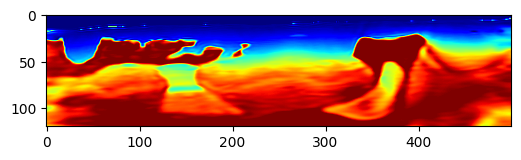

Epoch: 1761 Loss:  -1.9951289892196655 model_loss:  58313.35
Epoch: 1762 Loss:  -1.9950144290924072 model_loss:  58330.594
Epoch: 1763 Loss:  -1.9951313734054565 model_loss:  58299.895
Epoch: 1764 Loss:  -1.9950171113014221 model_loss:  58317.2
Epoch: 1765 Loss:  -1.9951339960098267 model_loss:  58286.41
Epoch: 1766 Loss:  -1.9950199723243713 model_loss:  58303.777
Epoch: 1767 Loss:  -1.9951362609863281 model_loss:  58272.887
Epoch: 1768 Loss:  -1.995022475719452 model_loss:  58290.348
Epoch: 1769 Loss:  -1.995138704776764 model_loss:  58259.3
Epoch: 1770 Loss:  -1.9950251579284668 model_loss:  58276.855


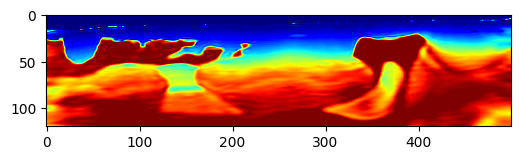

Epoch: 1771 Loss:  -1.9951410293579102 model_loss:  58245.676
Epoch: 1772 Loss:  -1.9950273633003235 model_loss:  58263.36
Epoch: 1773 Loss:  -1.9951431155204773 model_loss:  58232.055
Epoch: 1774 Loss:  -1.9950297474861145 model_loss:  58249.82
Epoch: 1775 Loss:  -1.9951452612876892 model_loss:  58218.39
Epoch: 1776 Loss:  -1.9950320720672607 model_loss:  58236.258
Epoch: 1777 Loss:  -1.9951474070549011 model_loss:  58204.723
Epoch: 1778 Loss:  -1.9950342774391174 model_loss:  58222.688
Epoch: 1779 Loss:  -1.995149552822113 model_loss:  58191.027
Epoch: 1780 Loss:  -1.9950366020202637 model_loss:  58209.05


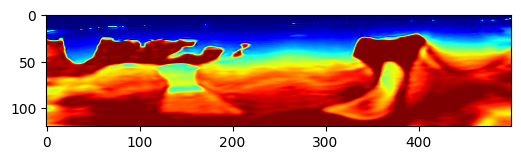

Epoch: 1781 Loss:  -1.9951516389846802 model_loss:  58177.305
Epoch: 1782 Loss:  -1.9950390458106995 model_loss:  58195.473
Epoch: 1783 Loss:  -1.9951539039611816 model_loss:  58163.68
Epoch: 1784 Loss:  -1.9950420260429382 model_loss:  58182.145
Epoch: 1785 Loss:  -1.9951562285423279 model_loss:  58150.535
Epoch: 1786 Loss:  -1.995045244693756 model_loss:  58168.984
Epoch: 1787 Loss:  -1.995158612728119 model_loss:  58137.38
Epoch: 1788 Loss:  -1.9950478672981262 model_loss:  58156.016
Epoch: 1789 Loss:  -1.9951602816581726 model_loss:  58124.492
Epoch: 1790 Loss:  -1.9950499534606934 model_loss:  58143.34


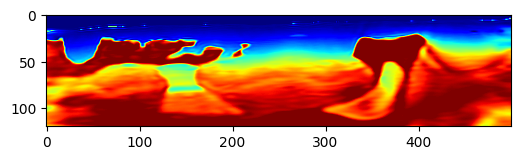

Epoch: 1791 Loss:  -1.9951613545417786 model_loss:  58111.28
Epoch: 1792 Loss:  -1.9950519800186157 model_loss:  58130.074
Epoch: 1793 Loss:  -1.9951626658439636 model_loss:  58097.69
Epoch: 1794 Loss:  -1.995054006576538 model_loss:  58116.41
Epoch: 1795 Loss:  -1.9951643347740173 model_loss:  58083.867
Epoch: 1796 Loss:  -1.995056390762329 model_loss:  58102.47
Epoch: 1797 Loss:  -1.9951662421226501 model_loss:  58070.008
Epoch: 1798 Loss:  -1.9950586557388306 model_loss:  58088.586
Epoch: 1799 Loss:  -1.9951683282852173 model_loss:  58056.098
Epoch: 1800 Loss:  -1.995074450969696 model_loss:  58043.836


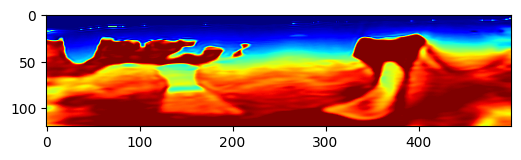

Epoch: 1801 Loss:  -1.9952430725097656 model_loss:  58115.44
Epoch: 1802 Loss:  -1.9954020380973816 model_loss:  58001.625
Epoch: 1803 Loss:  -1.9954286217689514 model_loss:  58068.965
Epoch: 1804 Loss:  -1.9954280853271484 model_loss:  58057.07
Epoch: 1805 Loss:  -1.9953264594078064 model_loss:  58028.457
Epoch: 1806 Loss:  -1.995392918586731 model_loss:  58058.28
Epoch: 1807 Loss:  -1.9954344630241394 model_loss:  58029.9
Epoch: 1808 Loss:  -1.9954679608345032 model_loss:  58030.367
Epoch: 1809 Loss:  -1.9954879879951477 model_loss:  58024.766
Epoch: 1810 Loss:  -1.9954350590705872 model_loss:  58025.117


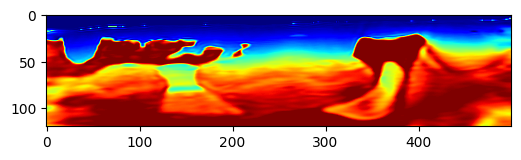

Epoch: 1811 Loss:  -1.9954608082771301 model_loss:  58006.938
Epoch: 1812 Loss:  -1.9954513907432556 model_loss:  58011.62
Epoch: 1813 Loss:  -1.9954801797866821 model_loss:  58008.273
Epoch: 1814 Loss:  -1.9954937100410461 model_loss:  57988.57
Epoch: 1815 Loss:  -1.9954797625541687 model_loss:  58007.707
Epoch: 1816 Loss:  -1.9954924583435059 model_loss:  57983.754
Epoch: 1817 Loss:  -1.9954734444618225 model_loss:  57984.84
Epoch: 1818 Loss:  -1.9954906105995178 model_loss:  57985.58
Epoch: 1819 Loss:  -1.9954893589019775 model_loss:  57965.746
Epoch: 1820 Loss:  -1.9954941868782043 model_loss:  57974.145


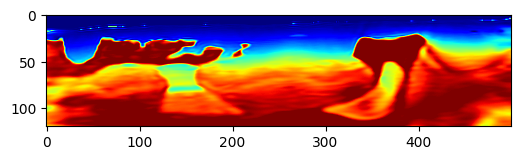

Epoch: 1821 Loss:  -1.9955003261566162 model_loss:  57959.453
Epoch: 1822 Loss:  -1.9954910278320312 model_loss:  57956.227
Epoch: 1823 Loss:  -1.9955004453659058 model_loss:  57954.652
Epoch: 1824 Loss:  -1.9954925775527954 model_loss:  57943.55
Epoch: 1825 Loss:  -1.9955005049705505 model_loss:  57938.32
Epoch: 1826 Loss:  -1.9954997301101685 model_loss:  57931.887
Epoch: 1827 Loss:  -1.99550062417984 model_loss:  57926.902
Epoch: 1828 Loss:  -1.9955043196678162 model_loss:  57920.47
Epoch: 1829 Loss:  -1.9955001473426819 model_loss:  57916.98
Epoch: 1830 Loss:  -1.9955055117607117 model_loss:  57905.926


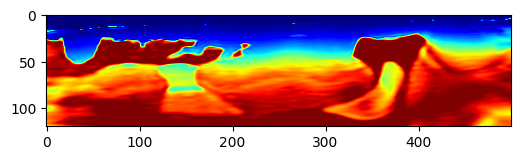

Epoch: 1831 Loss:  -1.9955019354820251 model_loss:  57900.875
Epoch: 1832 Loss:  -1.9955058097839355 model_loss:  57894.605
Epoch: 1833 Loss:  -1.995505452156067 model_loss:  57886.746
Epoch: 1834 Loss:  -1.9955063462257385 model_loss:  57884.176
Epoch: 1835 Loss:  -1.9955081939697266 model_loss:  57873.91
Epoch: 1836 Loss:  -1.995507001876831 model_loss:  57868.246
Epoch: 1837 Loss:  -1.9955098032951355 model_loss:  57860.89
Epoch: 1838 Loss:  -1.9955083131790161 model_loss:  57853.586
Epoch: 1839 Loss:  -1.9955108761787415 model_loss:  57848.336
Epoch: 1840 Loss:  -1.9955106377601624 model_loss:  57840.5


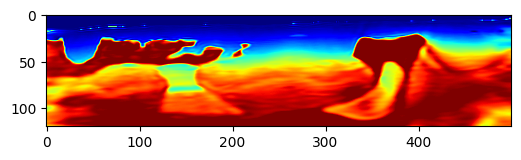

Epoch: 1841 Loss:  -1.9955115914344788 model_loss:  57834.113
Epoch: 1842 Loss:  -1.99551260471344 model_loss:  57826.758
Epoch: 1843 Loss:  -1.99551260471344 model_loss:  57819.785
Epoch: 1844 Loss:  -1.9955142140388489 model_loss:  57812.79
Epoch: 1845 Loss:  -1.9955138564109802 model_loss:  57806.25
Epoch: 1846 Loss:  -1.995515525341034 model_loss:  57798.754
Epoch: 1847 Loss:  -1.9955154657363892 model_loss:  57791.957
Epoch: 1848 Loss:  -1.9955167174339294 model_loss:  57784.703
Epoch: 1849 Loss:  -1.9955171346664429 model_loss:  57777.254
Epoch: 1850 Loss:  -1.9955177903175354 model_loss:  57770.65


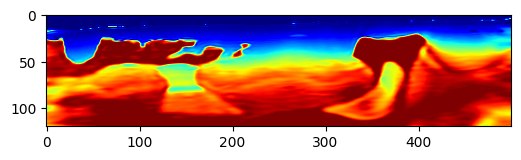

Epoch: 1851 Loss:  -1.9955186247825623 model_loss:  57762.953
Epoch: 1852 Loss:  -1.9955191612243652 model_loss:  57756.29
Epoch: 1853 Loss:  -1.9955200552940369 model_loss:  57748.754
Epoch: 1854 Loss:  -1.9955204129219055 model_loss:  57741.484
Epoch: 1855 Loss:  -1.9955214858055115 model_loss:  57734.355
Epoch: 1856 Loss:  -1.9955218434333801 model_loss:  57726.926
Epoch: 1857 Loss:  -1.995522677898407 model_loss:  57719.816
Epoch: 1858 Loss:  -1.9955232739448547 model_loss:  57712.383
Epoch: 1859 Loss:  -1.9955239295959473 model_loss:  57705.074
Epoch: 1860 Loss:  -1.9955247640609741 model_loss:  57697.65


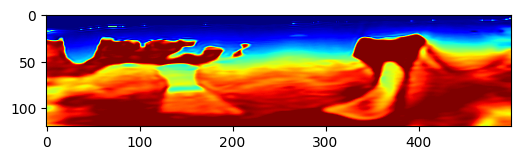

Epoch: 1861 Loss:  -1.995525300502777 model_loss:  57690.273
Epoch: 1862 Loss:  -1.995526134967804 model_loss:  57682.82
Epoch: 1863 Loss:  -1.995526671409607 model_loss:  57675.5
Epoch: 1864 Loss:  -1.9955275058746338 model_loss:  57667.95
Epoch: 1865 Loss:  -1.9955280423164368 model_loss:  57660.57
Epoch: 1866 Loss:  -1.9955288767814636 model_loss:  57653.03
Epoch: 1867 Loss:  -1.9955294132232666 model_loss:  57645.54
Epoch: 1868 Loss:  -1.9955301880836487 model_loss:  57638.086
Epoch: 1869 Loss:  -1.9955308437347412 model_loss:  57630.504
Epoch: 1870 Loss:  -1.9955315589904785 model_loss:  57623.023


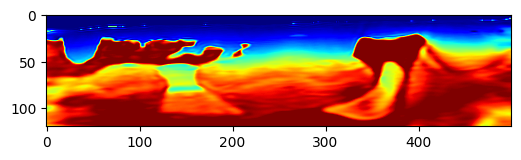

Epoch: 1871 Loss:  -1.995532214641571 model_loss:  57615.406
Epoch: 1872 Loss:  -1.9955328702926636 model_loss:  57607.867
Epoch: 1873 Loss:  -1.995533525943756 model_loss:  57600.28
Epoch: 1874 Loss:  -1.995534062385559 model_loss:  57592.695
Epoch: 1875 Loss:  -1.9955347776412964 model_loss:  57585.082
Epoch: 1876 Loss:  -1.9955354928970337 model_loss:  57577.438
Epoch: 1877 Loss:  -1.9955362677574158 model_loss:  57569.79
Epoch: 1878 Loss:  -1.9955368638038635 model_loss:  57562.14
Epoch: 1879 Loss:  -1.9955375790596008 model_loss:  57554.45
Epoch: 1880 Loss:  -1.9955382347106934 model_loss:  57546.785


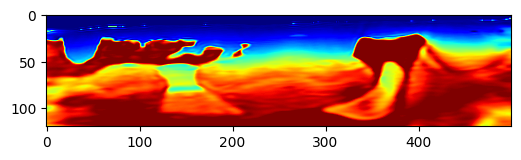

Epoch: 1881 Loss:  -1.9955388307571411 model_loss:  57539.08
Epoch: 1882 Loss:  -1.9955396056175232 model_loss:  57531.383
Epoch: 1883 Loss:  -1.9955403208732605 model_loss:  57523.656
Epoch: 1884 Loss:  -1.9955408573150635 model_loss:  57515.92
Epoch: 1885 Loss:  -1.9955415725708008 model_loss:  57508.18
Epoch: 1886 Loss:  -1.9955421090126038 model_loss:  57500.426
Epoch: 1887 Loss:  -1.995542824268341 model_loss:  57492.676
Epoch: 1888 Loss:  -1.9955435395240784 model_loss:  57484.875
Epoch: 1889 Loss:  -1.9955441355705261 model_loss:  57477.113
Epoch: 1890 Loss:  -1.9955447912216187 model_loss:  57469.32


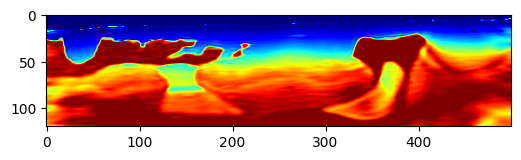

Epoch: 1891 Loss:  -1.9955455660820007 model_loss:  57461.52
Epoch: 1892 Loss:  -1.9955462217330933 model_loss:  57453.73
Epoch: 1893 Loss:  -1.9955469369888306 model_loss:  57445.92
Epoch: 1894 Loss:  -1.9955476522445679 model_loss:  57438.117
Epoch: 1895 Loss:  -1.9955481886863708 model_loss:  57430.305
Epoch: 1896 Loss:  -1.9955488443374634 model_loss:  57422.457
Epoch: 1897 Loss:  -1.9955495595932007 model_loss:  57414.645
Epoch: 1898 Loss:  -1.9955500960350037 model_loss:  57406.78
Epoch: 1899 Loss:  -1.995550811290741 model_loss:  57398.938
Epoch: 1900 Loss:  -1.9955515265464783 model_loss:  57391.062


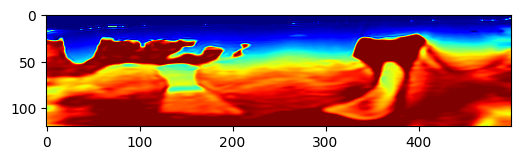

Epoch: 1901 Loss:  -1.9955522418022156 model_loss:  57383.207
Epoch: 1902 Loss:  -1.9955529570579529 model_loss:  57375.355
Epoch: 1903 Loss:  -1.9955534934997559 model_loss:  57367.477
Epoch: 1904 Loss:  -1.9955542087554932 model_loss:  57359.598
Epoch: 1905 Loss:  -1.9955548644065857 model_loss:  57351.723
Epoch: 1906 Loss:  -1.995555579662323 model_loss:  57343.82
Epoch: 1907 Loss:  -1.9955561757087708 model_loss:  57335.938
Epoch: 1908 Loss:  -1.9955568313598633 model_loss:  57328.016
Epoch: 1909 Loss:  -1.995557427406311 model_loss:  57320.14
Epoch: 1910 Loss:  -1.9955580830574036 model_loss:  57312.188


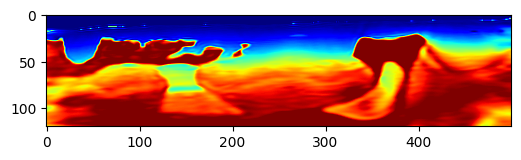

Epoch: 1911 Loss:  -1.995558738708496 model_loss:  57304.297
Epoch: 1912 Loss:  -1.9955595135688782 model_loss:  57296.316
Epoch: 1913 Loss:  -1.995560109615326 model_loss:  57288.44
Epoch: 1914 Loss:  -1.9955608248710632 model_loss:  57280.426
Epoch: 1915 Loss:  -1.9955613613128662 model_loss:  57272.574
Epoch: 1916 Loss:  -1.9955620765686035 model_loss:  57264.543
Epoch: 1917 Loss:  -1.9955626130104065 model_loss:  57256.703
Epoch: 1918 Loss:  -1.9955634474754333 model_loss:  57248.62
Epoch: 1919 Loss:  -1.9955638647079468 model_loss:  57240.805
Epoch: 1920 Loss:  -1.9955648183822632 model_loss:  57232.68


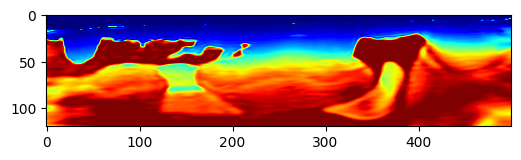

Epoch: 1921 Loss:  -1.9955652356147766 model_loss:  57224.953
Epoch: 1922 Loss:  -1.9955662488937378 model_loss:  57216.695
Epoch: 1923 Loss:  -1.9955663681030273 model_loss:  57209.105
Epoch: 1924 Loss:  -1.9955677390098572 model_loss:  57200.65
Epoch: 1925 Loss:  -1.9955676198005676 model_loss:  57193.3
Epoch: 1926 Loss:  -1.9955692291259766 model_loss:  57184.535
Epoch: 1927 Loss:  -1.995568573474884 model_loss:  57177.582
Epoch: 1928 Loss:  -1.995570719242096 model_loss:  57168.332
Epoch: 1929 Loss:  -1.9955694079399109 model_loss:  57162.027
Epoch: 1930 Loss:  -1.9955725073814392 model_loss:  57151.906


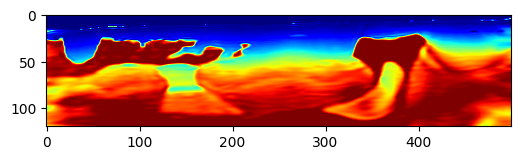

Epoch: 1931 Loss:  -1.9955698251724243 model_loss:  57146.727
Epoch: 1932 Loss:  -1.9955743551254272 model_loss:  57135.074
Epoch: 1933 Loss:  -1.99556964635849 model_loss:  57131.863
Epoch: 1934 Loss:  -1.9955763220787048 model_loss:  57117.6
Epoch: 1935 Loss:  -1.995567798614502 model_loss:  57117.824
Epoch: 1936 Loss:  -1.9955780506134033 model_loss:  57098.86
Epoch: 1937 Loss:  -1.9955623745918274 model_loss:  57105.2
Epoch: 1938 Loss:  -1.995577335357666 model_loss:  57077.87
Epoch: 1939 Loss:  -1.995547890663147 model_loss:  57094.887
Epoch: 1940 Loss:  -1.9955684542655945 model_loss:  57052.895


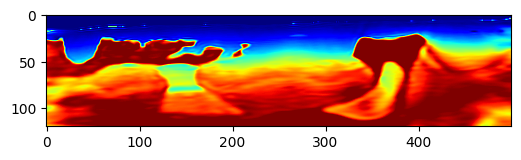

Epoch: 1941 Loss:  -1.9955111742019653 model_loss:  57087.66
Epoch: 1942 Loss:  -1.995533049106598 model_loss:  57022.31
Epoch: 1943 Loss:  -1.9954224228858948 model_loss:  57081.06
Epoch: 1944 Loss:  -1.9954360127449036 model_loss:  56989.875
Epoch: 1945 Loss:  -1.9952480792999268 model_loss:  57062.562
Epoch: 1946 Loss:  -1.9952589273452759 model_loss:  56971.598
Epoch: 1947 Loss:  -1.995028018951416 model_loss:  57022.516
Epoch: 1948 Loss:  -1.9950935244560242 model_loss:  56971.195
Epoch: 1949 Loss:  -1.9949263334274292 model_loss:  56982.203
Epoch: 1950 Loss:  -1.9950891137123108 model_loss:  56964.402


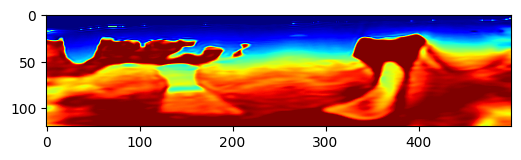

Epoch: 1951 Loss:  -1.9950329661369324 model_loss:  56956.28
Epoch: 1952 Loss:  -1.9952284693717957 model_loss:  56949.383
Epoch: 1953 Loss:  -1.995217502117157 model_loss:  56942.62
Epoch: 1954 Loss:  -1.995366096496582 model_loss:  56935.453
Epoch: 1955 Loss:  -1.9953402876853943 model_loss:  56934.793
Epoch: 1956 Loss:  -1.9954376220703125 model_loss:  56921.85
Epoch: 1957 Loss:  -1.99538254737854 model_loss:  56926.97
Epoch: 1958 Loss:  -1.9954528212547302 model_loss:  56903.914
Epoch: 1959 Loss:  -1.9953685998916626 model_loss:  56916.844
Epoch: 1960 Loss:  -1.99542897939682 model_loss:  56881.43


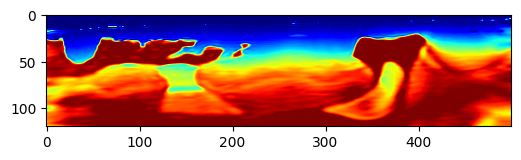

Epoch: 1961 Loss:  -1.995319664478302 model_loss:  56904.56
Epoch: 1962 Loss:  -1.9953819513320923 model_loss:  56859.44
Epoch: 1963 Loss:  -1.9952600598335266 model_loss:  56890.26
Epoch: 1964 Loss:  -1.9953349232673645 model_loss:  56842.46
Epoch: 1965 Loss:  -1.9952203035354614 model_loss:  56872.26
Epoch: 1966 Loss:  -1.9953144788742065 model_loss:  56832.1
Epoch: 1967 Loss:  -1.9952211380004883 model_loss:  56852.19
Epoch: 1968 Loss:  -1.995328962802887 model_loss:  56826.285
Epoch: 1969 Loss:  -1.9952551126480103 model_loss:  56834.5
Epoch: 1970 Loss:  -1.995363175868988 model_loss:  56818.86


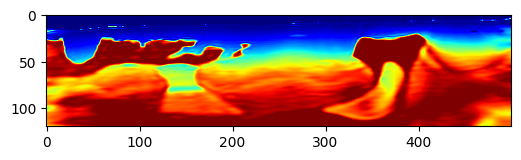

Epoch: 1971 Loss:  -1.9952974319458008 model_loss:  56821.53
Epoch: 1972 Loss:  -1.995395541191101 model_loss:  56806.367
Epoch: 1973 Loss:  -1.9953269362449646 model_loss:  56811.98
Epoch: 1974 Loss:  -1.9954141974449158 model_loss:  56790.586
Epoch: 1975 Loss:  -1.9953374862670898 model_loss:  56804.082
Epoch: 1976 Loss:  -1.995417594909668 model_loss:  56774.535
Epoch: 1977 Loss:  -1.9953324794769287 model_loss:  56794.992
Epoch: 1978 Loss:  -1.995409607887268 model_loss:  56759.484
Epoch: 1979 Loss:  -1.9953184723854065 model_loss:  56782.52
Epoch: 1980 Loss:  -1.9953968524932861 model_loss:  56745.93


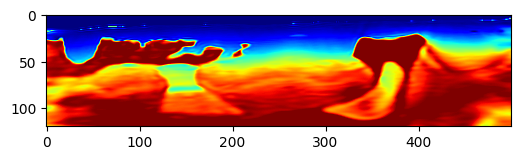

Epoch: 1981 Loss:  -1.9953041672706604 model_loss:  56766.98
Epoch: 1982 Loss:  -1.9953868389129639 model_loss:  56733.996
Epoch: 1983 Loss:  -1.9952967166900635 model_loss:  56750.902
Epoch: 1984 Loss:  -1.9953840970993042 model_loss:  56722.688
Epoch: 1985 Loss:  -1.995298683643341 model_loss:  56736.34
Epoch: 1986 Loss:  -1.9953889846801758 model_loss:  56710.938
Epoch: 1987 Loss:  -1.995307743549347 model_loss:  56723.805
Epoch: 1988 Loss:  -1.9953978061676025 model_loss:  56698.527
Epoch: 1989 Loss:  -1.9953189492225647 model_loss:  56712.445
Epoch: 1990 Loss:  -1.995406687259674 model_loss:  56685.69


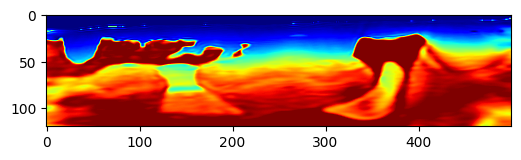

Epoch: 1991 Loss:  -1.995327651500702 model_loss:  56701.117
Epoch: 1992 Loss:  -1.9954125881195068 model_loss:  56672.62
Epoch: 1993 Loss:  -1.995331585407257 model_loss:  56689.066
Epoch: 1994 Loss:  -1.9954143166542053 model_loss:  56659.516
Epoch: 1995 Loss:  -1.995331048965454 model_loss:  56676.42
Epoch: 1996 Loss:  -1.995413064956665 model_loss:  56646.62
Epoch: 1997 Loss:  -1.99532812833786 model_loss:  56663.508
Epoch: 1998 Loss:  -1.9954105615615845 model_loss:  56633.92
Epoch: 1999 Loss:  -1.995324969291687 model_loss:  56650.74


In [12]:
# Iterative inversion loop
# t_start = time.time()
num_batches = 2 # split data into 8 batches for speed and reduced memory use
num_shots_per_batch = int(n_shots / num_batches)
num_epochs = 2000 # Pass through the entire dataset 30 timesMisfit_Wasserstein1(trans_type='linear',dt=1,theta=1,p=1)
vmin, vmax = np.percentile(model_true.numpy(), [2,98]) # For plotting
model_loss = []
data_loss = []

initial_value = 2
final_value = 8
N = num_epochs
for epoch in range(num_epochs):
    epoch_loss = 0
    iterations = epoch
...
    for it in range(num_batches):
        optimizer.zero_grad()
        
        batch_src_amps = source_amplitudes[:num_shots_per_batch]
        batch_src_amps_true = source_amplitudes_true[:num_shots_per_batch]
        batch_rcv_amps_true = receiver_amplitudes_true[it::num_batches].to(device)
        
        batch_x_s = source_locations[it::num_batches].to(device)
        batch_x_r = receiver_locations[it::num_batches].to(device)

        ##########   ifwi
        model = imvel(coords.contiguous())

        # Denormalize
        std_vp = 3e3
        mean_vp = 3e3
        model = model * std_vp + model_init.to(device)
        # model = torch.where(mask == 1, model, model_init.to(device))
        out = scalar(
                    model.T, dx, dt,
                    source_amplitudes=batch_src_amps,
                    source_locations=batch_x_s,
                    receiver_locations=batch_x_r,
                    pml_freq=values,
                    )
        batch_rcv_amps_pred = out[-1].permute(0, 2, 1)
        u_obs = batch_rcv_amps_true
        u_pred = batch_rcv_amps_pred
        d1,d2 = data_conv(u_obs.permute(0, 2, 1), u_pred.permute(0, 2, 1), batch_x_s)
        loss = criterion_data.forward(d1,d2)

        total_loss = loss  
        total_loss.backward()    
        optimizer.step()
        epoch_loss += total_loss.item()
        
    scheduler.step()
    v_loss = criterion(model.cpu(),model_true.cpu()).detach().numpy()
    model_loss.append(v_loss.item())
    data_loss.append(epoch_loss)
    print('Epoch:', epoch, 'Loss: ', epoch_loss,'model_loss: ', v_loss)
    if epoch !=0 and epoch % 10 == 0:
        plt.show()
        plt.figure(figsize=(6, 4))
        plt.imshow(model.cpu().detach().numpy(), vmin=1.5e3, vmax=4.5e3,
                   cmap='jet')
        plt.show()

# t_end = time.time()
# print('Runtime:', t_end - t_start)